<a id='Top'></a>
# Decision-Driven Regularization
This document contains all codes for the paper---Decision-Driven Regularization: A Blended Model for Predict-then-Optimize.

## [Part 0: Functions and Solvers](#Part_0) 

### [Functions-Sample generation](#Part_0.0)      
### [Functions--Parameter prediction and cost estimation](#Part_0.0.0)
### [Functions-Figure plot](#Part_0.0.1)

### [0.2: Solvers-OLS](#Part_0.1) 

### [0.3: Solvers-LASSO](#Part_0.2) 

### [0.4: Solvers-Ridge](#Part_0.3) 

### [0.5: Solvers-SPO+](#Part_0.4) 

### [0.6: Solvers-DDR-SPO+](#Part_0.5) 

### [0.7: Solvers-DDR](#Part_0.6) 

### [0.8: Solvers-JERO-Like](#Part_0.7) 

### [0.9: Solvers-JERO-Real](#Part_0.8) 

## [Section 2: Out-of-sample fidelity](#Sec_2) 

#### [Figure 1](#figure1)  


## [Section 4.1: Benchmarks](#Sec_4.1) 

### [4.1.1 Comparison against SPO+](#Part_4.1.1)   

### [4.1.2 Adding quadratic terms](#Part_4.1.2)   

### [4.1.3 Against LASSO and Ridge](#Part_4.1.3)  


## [Section 4.2: Comparison Against OLS](#Sec_4.2) 

### [4.2.1 Base case--Uniform W](#Part_4.2.1)   

### [4.2.2 Effects of d, p, N, alpha--Uniform W](#Part_4.2.2)   

### [4.2.3 Effects of p when N is large--Uniform W](#Part_4.2.3)  

### [4.2.4 Base case--Binary W](#Part_4.2.4)   

### [4.2.5 Effects of d, p, N, alpha--Binary W](#Part_4.2.4)   

### [4.2.6 With constraints](#Part_4.2.6)   

### [4.2.7 With transformation matrix](#Part_4.2.7)   


## [Section 4.3: Misspecification](#Sec_4.3) 


## [Section 4.4: Nonlinear cost](#Sec_4.4) 


In [1]:
import numpy as np
from scipy import *
from scipy.optimize import fsolve
from numpy import random
import seaborn as sns
import matplotlib.pyplot as plt
from gurobipy import *
from sklearn.model_selection import train_test_split
#import cvxpy as cp
from scipy.linalg import fractional_matrix_power
from numpy.linalg import inv
import pandas as pd
from scipy.optimize import minimize
from scipy.optimize import NonlinearConstraint
from mpl_toolkits.mplot3d import Axes3D
import time
import pickle
from scipy.stats import gaussian_kde
from matplotlib import gridspec

# from sklearn.linear_model import Ridge
# from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import MultiTaskLassoCV
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import train_test_split, KFold
import warnings

from scipy.stats import bernoulli

import gc

from rsome import ro
from rsome import grb_solver as grb

seed = 3

<a id='Part_0'></a>
## Part 0: Functions and Solvers
[Go back to top](#Top)

<a id='Part_0.0'></a>
### Functions--Sample generation
[Go back to top](#Top)
"generate_truth" generates the true $\boldsymbol{w}$ in the paper.

"generate_samples" geneartes the training data and test data. 

In [4]:
def generate_truth(lower,upper,p,d, version = 0):
    # p number of feature; 
    # d number of routes
    # B_star is w in the paper
    # w ~ U[lower, upper]
    # version 0: uniformly distributed in [lower, upper]
    # version 1: each component is bernoulli with prob == 0.5
    # version 2: W* = (W^0,0)
    # version 3: W* = (W sparse, 0)
#     random.seed(seed)
    if version == 0:
        W_star = np.random.uniform(lower,upper,(d,p))
    elif version == 1:
        prob = 0.5
        X = bernoulli(prob)
        W_star = X.rvs((d,p))
    elif version == 2:
        W_star = np.concatenate((np.random.uniform(lower,upper,(d,np.int(0.75*p))), np.zeros((d, p - np.int(0.75*p)))), axis = 1)
    elif version == 3:
        prob = 0.5
        X = bernoulli(prob)
        W_star = np.concatenate( ( X.rvs((d,np.int(0.75*p))), np.zeros((d, p - np.int(0.75*p))) ), axis = 1 )
    elif version == 4:
        W_U = np.random.uniform(lower,upper,(d,p))
        prob = 0.5
        X = bernoulli(prob)
        W_B = X.rvs((d,p))
        W_star = np.multiply(W_U, W_B)
    elif version == 5: ## 0(0.5),1(0.25),2(0.25)
        W_star = np.random.choice([0,1,2], (d,p), p =[0.5,0.25,0.25])
    return W_star
    
def generate_samples(p,d,samples_test, samples_train, alpha, W_star, n_epsilon = 1, mis = 1, thres = 10, 
                     version = 1, x_dist = 'normal', e_dist = 'normal', x_low = 0, x_up = 2, x_mean = 2, 
                     x_var = 0.25, bump = 0):
    # upper and lower are not used
    # mis is the beta in the paper
    if version == 1: ## X ~ U[x_low,x_up]; epsilon ~ N(0,alpha)
        if x_dist == 'normal':
#             x_test= np.random.uniform(x_low, x_up, size = (samples_test,p))
#             x_train = np.random.uniform(x_low, x_up, size = (samples_train,p))
            x_test= np.random.multivariate_normal(x_mean*np.ones(p), x_var*np.identity(p), size = samples_test) ## KK
            x_train = np.random.multivariate_normal(x_mean*np.ones(p), x_var*np.identity(p), size = samples_train) ## KK
            
        elif x_dist == 'uniform':
            x_test= np.random.uniform(x_low, x_up, size = (samples_test,p))
            x_train = np.random.uniform(x_low, x_up, size = (samples_train,p))
        
        z_test_ori = np.power(np.dot(x_test, W_star.T) + bump * np.ones((samples_test, d)), mis)
        z_train_ori = np.power(np.dot(x_train, W_star.T) + bump * np.ones((samples_train, d)), mis)
        
        if e_dist == 'normal':
            noise_test = np.random.multivariate_normal(np.zeros(d), alpha*np.identity(d), size = samples_test)
            noise_train = np.random.multivariate_normal(np.zeros(d), alpha*np.identity(d), size = samples_train)
        elif e_dist == 'uniform':
            noise_test = np.random.uniform(-alpha,alpha, size = (samples_test, d))
#             noise_train = np.random.uniform(x_low, x_up, size = (samples_train, p))  #### why x_low and x_up
            noise_train = np.random.uniform(-alpha, alpha, size = (samples_train, d))  ## KK

        z_test = z_test_ori + noise_test
        z_train = z_train_ori + noise_train
    
    elif version == 2: # n_epsilon
        if x_dist == 'normal':
            x_test= np.random.multivariate_normal(x_mean*np.zeros(p), x_var*np.identity(p), size = samples_test)
            x_train = np.random.multivariate_normal(x_mean*np.zeros(p), x_var*np.identity(p), size = samples_train)
        elif x_dist == 'uniform':
            x_test= np.random.uniform(x_low, x_up, size = (samples_test,p))
            x_train = np.random.uniform(x_low, x_up, size = (samples_train,p))
        
        z_test_ori = np.power(np.dot(x_test, W_star.T) + bump * np.ones((samples_test, d)), mis)
        z_train_ori = np.power(np.dot(x_train, W_star.T) + bump * np.ones((samples_train, d)), mis)
        
        if e_dist == 'normal':
            z_test = [z_test_ori + np.random.multivariate_normal(np.zeros(d), alpha*np.identity(d), size = samples_test) for n in range(n_epsilon)]
            noise_train = np.random.multivariate_normal(np.zeros(d), alpha*np.identity(d), size = samples_train)
        elif e_dist == 'uniform':
            z_test = [z_test_ori + np.random.uniform(-alpha, alpha, size = (samples_test,d)) for n in range(n_epsilon)]
            noise_train = np.random.uniform(-alpha, alpha, size = (samples_train, d))  ## KK
        
        z_train = z_train_ori + noise_train
        
    elif version == 3: ## SPO+ version
        x_test= np.random.multivariate_normal(np.zeros(p), np.identity(p), size = samples_test)
        hold = np.dot(x_test, W_star.T)/sqrt(p) + 3
        sign_hold = np.sign(hold)
        z_test_ori = np.multiply(sign_hold, np.power(np.abs(hold), mis)) + 1
        noise = np.random.uniform(1 - alpha, 1 + alpha, size = (samples_test,d))
        z_test =np.multiply(z_test_ori, noise) 

        x_train=np.random.multivariate_normal(np.zeros(p), np.identity(p), size = samples_train)
        hold = np.dot(x_train, W_star.T)/sqrt(p) + 3
        sign_hold = np.sign(hold)
        z_train_ori = np.multiply(sign_hold, np.power(np.abs(hold), mis)) + 1
        noise = np.random.uniform(1 - alpha,1 + alpha, size = (samples_train, d))
        z_train = np.multiply(z_train_ori, noise) 
    
    return x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star

In [5]:
# Generate a set of data to test functions and solvers here
random.seed(seed)
iters = 100
p = 4
d = 5
samples_test = 100
samples_train = 10
lower = 0
upper = 3
alpha = 3
n_epsilon = 10
mis = 1
thres = 100
## Generate data below
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p
W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
data = generate_samples(p,d,samples_test, samples_train, alpha, W_star, n_epsilon = 1, mis = 1, thres = 10, 
                     version = 1, x_dist = 'normal', e_dist = 'uniform', x_low = 0, x_up = 2, x_mean = 2, 
                     x_var = 0.5, bump = 4)
x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data
x_train

print(x_train @ W_star.T)

[[12.70392446 12.40005143  5.92156692 14.38462541  8.22283265]
 [ 7.7304045   7.8660885   3.92646019  7.53731196  5.42782034]
 [13.39104136 13.29456226  6.31854762 14.44605775  9.13558709]
 [14.54702039 16.54534087  6.9734782  13.5319547   8.31843455]
 [11.20923184 12.39787417  5.59090517 10.48517086  6.56130375]
 [16.2605417  17.47552907  6.95868471 17.57496862  9.80327862]
 [15.53530037 17.51250701  7.35264145 15.14103788  8.35082362]
 [13.97823319 13.55590688  7.48523901 14.35738111  9.14813137]
 [13.11258851 13.05097439  5.94721811 15.06034123  7.97758709]
 [12.85788612 13.98980123  6.37989032 11.97001556  8.25073926]]


<a id='Part_0.0.0'></a>
### Functions--Parameter prediction and cost estimation
[Go back to top](#Top)

In [6]:
def param_prediction_and_cost_estimation(x_test, W, w0, thres, yconstraint = 0, A = 0, b = 0, yB = 0, B = 0):
    M = len(x_test)
#     z_predict = np.minimum(x_test @ np.array(W).T + np.tile(w0, (M,1)),thres)
    z_predict = x_test @ np.array(W).T + np.tile(w0, (M,1))
    y_predict = decision_finder(z_predict, yconstraint, A, b, yB, B)
    c_predict = np.sum( np.minimum(z_predict, thres) * y_predict, axis = 1 )
    return np.array(z_predict), np.array(y_predict), np.array(c_predict)

def decision_finder(z, yconstraint = 0, A = 0, b = 0, yB = 0, B = 0):
    N,d = z.shape
    if yconstraint == 0:
        if yB == 0:
            y = np.float64((z == np.min(z, axis = np.array(z).ndim - 1, keepdims=True)).view('i1'))
            mask = np.all(y == np.array([1 for i in range(d)]), axis = np.array(z).ndim - 1) 
            y[mask] = [1/d for i in range(d)]  ## if multiple minimum, assign equal prob.
        else:
            z_new = (np.array(B) @ np.array(z.T)).T
            y = np.float64((z_new == np.min(z_new, axis = np.array(z_new).ndim - 1, keepdims=True)).view('i1'))
            mask = np.all(y == np.array([1 for i in range(d)]), axis = np.array(z_new).ndim - 1) 
            y[mask] = [1/d for i in range(d)]  ## if multiple minimum, assign equal prob.
    else:
        a,d= A.shape
        m = Model("TSP")
        #m.setParam("DualReductions",0) 
        m.setParam('OutputFlag', 0)

        y_ind = tuplelist([(n,i) for n in range(N) for i in range(d)])

        y_tsp = m.addVars(y_ind, vtype=GRB.BINARY)

        m.setObjective( quicksum(z[n][i]*y_tsp[n,i] for i in range(d) for n in range(N)), GRB.MINIMIZE)
        m.addConstrs( quicksum( y_tsp[n,i] for i in range(d) ) == 1 for n in range(N) )
        m.addConstrs( quicksum( A[k,i]*y_tsp[n,i] for i in range(d) ) <= b[k] for k in range(a) for n in range(N) )
        m.optimize()
        end = time.time()

        y_tsp = m.getAttr('x', y_tsp)
        
        y = []
        for n in range(N):
            y.append([y_tsp[(n,i)] for i in range(d)])
    return np.array(y)

def cross_compare2(c_item, c_base, c_oracle):
    N = len(c_item)
    c_diff = c_item - c_base
    lbel = np.zeros((N,1))
    
    equals = np.sum(c_diff == 0)
    wins = np.sum(c_diff < 0)
    lose = np.sum(c_diff > 0)
    
    lbel[c_diff < 0] = 1
    lbel[c_diff > 0] = -1
    
#     print(N, equals, wins, lose)
    if N == equals:
        win_ratio = 0.5
    else:
        win_ratio = wins/(N - equals)
    mci = (np.mean(c_item) - np.mean(c_base))/np.abs(np.mean(c_oracle))
    return lbel, win_ratio, mci

def cross_compare2plus(c_item, c_base, c_oracle):
    N = len(c_item)
    c_diff = c_item - c_base
    lbel = np.zeros((N,1))
    
    equals = np.sum(c_diff == 0)
    wins = np.sum(c_diff < 0)
    lose = np.sum(c_diff > 0)
    
    lbel[c_diff < 0] = 1
    lbel[c_diff > 0] = -1
    
#     print(N, equals, wins, lose)
    if N == equals:
        win_ratio = 0.5
    else:
        win_ratio = wins/(N - equals)
    mci = (np.mean(c_item) - np.mean(c_base))/np.abs(np.mean(c_oracle))
#     pio = (np.mean(c_item) - np.mean(c_oracle))/np.abs(np.mean(c_base) - np.mean(c_oracle))
    pio = (np.mean(c_base) - np.mean(c_item))/np.abs(np.mean(c_base) - np.mean(c_oracle))
    return lbel, win_ratio, mci, pio

def cross_compare(y_test_ddr, y_test_spo, z_test_ori, y_test_opt, thres):
    difference = 0
    powers = [2**i for i in range(d)]
    c_spo_true = np.sum(np.minimum(z_test_ori,thres) * y_test_spo, axis = 1)
    c_ddr_true = np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
    c_oracle = np.sum(np.minimum(z_test_ori,thres) * y_test_opt, axis = 1)
    std_spo_true = np.std(c_spo_true)
    std_ddr_true = np.std(c_ddr_true)
    ddr_wins = 0
    spo_wins = 0
    for i in range(len(y_test_ddr)):
        diff_vec = [y_test_spo[i][j] - y_test_ddr[i][j] for j in range(d)]
        if np.dot(powers, diff_vec) != 0:
            difference += 1
            if c_ddr_true[i] < c_spo_true[i]:
                ddr_wins += 1
            elif c_spo_true[i] < c_ddr_true[i]:
                spo_wins += 1
    if difference == 0:
        win_ratio = 0
    else:
        win_ratio = ddr_wins / difference
    return difference / len(y_test_ddr), win_ratio, (np.mean(c_ddr_true) - np.mean(c_spo_true))/np.abs(np.mean(c_oracle)),\
            (np.mean(c_ddr_true)-np.mean(c_oracle))/np.abs(np.mean(c_oracle)),(np.mean(c_ddr_true) - np.mean(c_spo_true))/std_ddr_true

def head_2_head(item, base):
    count = 0
    diff = 0
    N = len(item)
    for i in range(N):
        if item[i] < base[i]:
            count += 1
            diff += 1
        elif item[i] > base[i]:
            diff += 1
    if diff == 0:
        return 0,0
    else:
        return count / diff, diff / N
    
# def cross_compare1(y_item, y_base, c_item, c_base, c_oracle):
#     N = len(y_item)
#     y_diff = y_item - y_base
#     c_diff = c_item - c_base
#     lbel = np.zeros((N,1))
#     wins = 0
#     equals = 0
#     lose = 0
#     for n in range(N):
#         if np.sum(np.absolute(y_diff[n])) < 0.1: ## if same
#             equals += 1
#             lbel[n] = 0
#         else:
#             if c_diff[n] < 0:
#                 wins += 1
#                 lbel[n] = 1
#             else:
#                 lose += 1
#                 lbel[n] = -1
#     print(N, equals, wins, lose)
#     if N == equals:
#         win_ratio = 0
#     else:
#         win_ratio = wins/(N - equals)
#     mci = (np.mean(c_item) - np.mean(c_base))/np.abs(np.mean(c_oracle))
#     return lbel, win_ratio, mci

<a id='Part_0.0.1'></a>
### Functions--Figure plot
[Go back to top](#Top)

In [ ]:
def figure_plot_upleft(all_x, all_y, figure_name, size = (5, 5), move = [-0.12, 0.04, 0.35, 0.55], 
                       ysame = 0, yrange = [6,6], sublabel = '', ypio = 0):
    
    data = np.asarray([all_x,all_y])

    xmin, ymin = data.min(axis = 1)
    xmax, ymax = data.max(axis = 1)

    xmax, xmin = tuple(np.array([xmax, xmin]) + 0.25*(xmax - xmin)*np.array([1, -1]))
    ymax, ymin = tuple(np.array([ymax, ymin]) + 0.25*(ymax - ymin)*np.array([1, -1]))
    
    ####### Obtain KDE  
    #KDE for top marginal
    kde_X = gaussian_kde(data[0])
    #KDE for right marginal
    kde_Y = gaussian_kde(data[1])

    x = np.linspace(0, 100, 100)
    y = np.linspace(ymin, ymax, 100)
        
    dx = kde_X(x) # X-marginal density
    dy = kde_Y(y) # Y-marginal density

    #Define grid for subplots, ratio for axis
    gs = gridspec.GridSpec(2, 2, width_ratios=[1, 3], height_ratios = [1, 3]) 

    ####### Create scatter plot
    fig = plt.figure(figsize = size)
    ax = plt.subplot(gs[1, 1])
    cax = ax.scatter(data[0], data[1], s = 15, color='#003D7C', marker = "o", edgecolors = "#EF7C00")
    plt.xlabel('Head-to-head (%)')
    if ypio == 0:
        plt.ylabel('Mean cost reduction (%)')
    else:
        plt.ylabel('Regret reduction (%)') #pio
    
    
    if ysame == 0:
        plt.vlines(50, ymin, ymax, linestyle="dashed", alpha = 0.8,color = 'k')
    else:
        plt.vlines(50, yrange[0], yrange[1], linestyle="dashed", alpha = 0.8,color = 'k')
    
    if ypio == 0:
        plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k')
        ax.annotate(sublabel, xy = (0.55,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    elif ypio == 1: #(base - item)/(base - oracle)
        plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k')
        ax.annotate(sublabel, xy = (0.05,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    else: #(item - oracle)/(base - oracle)
        plt.hlines(100, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k') #pio
        ax.annotate(sublabel, xy = (0.55,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    


    ####### Create Y-marginal (right)
    axr = plt.subplot(gs[1, 0], xticks = [], yticks = [], frameon = False)
    axr.plot(dy, y, color = 'black')
    
    if ypio == 0:
        axr.fill_betweenx(y, 0, dy, where = y <= 0, alpha = 1, color='#003D7C')
        axr.fill_betweenx(y, 0, dy, where = y >= 0, alpha = 1, color='#EF7C00')

        leftarea = np.round( sum(n <= 0 for n in all_y)/len(all_y),2 )
        rightarea = np.round( sum(n > 0 for n in all_y)/len(all_y),2 )

        axr.annotate(leftarea, xy=(0.8, abs(ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.8, abs(ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    elif ypio == 1:
        axr.fill_betweenx(y, 0, dy, where = y <= 0, alpha = 1, color='#EF7C00')
        axr.fill_betweenx(y, 0, dy, where = y >= 0, alpha = 1, color='#003D7C')

        leftarea = np.round( sum(n <= 0 for n in all_y)/len(all_y),2 )
        rightarea = np.round( sum(n > 0 for n in all_y)/len(all_y),2 )

        axr.annotate(leftarea, xy=(0.8, abs(ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.8, abs(ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    else:
        axr.fill_betweenx(y, 0, dy, where = y <= 100, alpha = 1, color='#003D7C') #pio
        axr.fill_betweenx(y, 0, dy, where = y >= 100, alpha = 1, color='#EF7C00') #pio

        leftarea = np.round( sum(n <= 100 for n in all_y)/len(all_y),2 ) #pio
        rightarea = np.round( sum(n > 100 for n in all_y)/len(all_y),2 ) #pio

        axr.annotate(leftarea, xy=(0.8, (100 - ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.8, (100 - ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)

    axr.invert_xaxis()

    ####### Create X-marginal (top)
    axt = plt.subplot(gs[0,1], frameon = False, yticks = [], xticks = [])
    #base = pyplot.gca().transData
    #rot = transforms.Affine2D().rotate_deg(180)
    axt.plot(x, dx, color = 'black')
    axt.fill_between(x, 0, dx, where = x >= 49.9, alpha= 1, color = '#003D7C')
    axt.fill_between(x, 0, dx, where = x <= 50, alpha= 1, color = '#EF7C00')

#     axt.invert_yaxis()

    leftarea = np.round( sum(n <= 50 for n in all_x)/len(all_x),2 )
    rightarea = np.round( sum(n > 50 for n in all_x)/len(all_x),2 )

    axt.annotate(leftarea, xy=(move[2], 0.15), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    axt.annotate(rightarea, xy=(move[3], 0.15), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)

    ####### Bring the marginals closer to the scatter plot and save eps file
    fig.tight_layout(pad = 1)
    plt.savefig(figure_name + '.eps', format='eps')
    plt.savefig(figure_name + '.pdf', format='pdf')

def figure_plot_upright(all_x, all_y, figure_name, size = (5, 5), move = [-0.07, 0.07, 0.35, 0.55], 
                        ysame = 0, yrange = [6,6], sublabel = '', ypio = 0):
    
    data = np.asarray([all_x,all_y])

    xmin, ymin = data.min(axis = 1)
    xmax, ymax = data.max(axis = 1)

    xmax, xmin = tuple(np.array([xmax, xmin]) + 0.25*(xmax - xmin)*np.array([1, -1]))
    ymax, ymin = tuple(np.array([ymax, ymin]) + 0.25*(ymax - ymin)*np.array([1, -1]))

    ####### Obtain KDE  

    #KDE for top marginal
    kde_X = gaussian_kde(data[0])
    #KDE for right marginal
    kde_Y = gaussian_kde(data[1])

    x = np.linspace(0, 100, 100)
    y = np.linspace(ymin, ymax, 100)

    dx = kde_X(x) # X-marginal density
    dy = kde_Y(y) # Y-marginal density

    #Define grid for subplots
    gs = gridspec.GridSpec(2, 2, width_ratios=[3, 1], height_ratios = [1, 3])

    ####### Create scatter plot
    fig = plt.figure(figsize = size)
    ax = plt.subplot(gs[1, 0])
    cax = ax.scatter(data[0], data[1], s = 15, color='#003D7C', marker = "o", edgecolors = "#EF7C00")
    plt.xlabel('Head-to-head (%)')
    if ypio == 0:
        plt.ylabel('Mean cost reduction (%)')
    else:
        plt.ylabel('Regret reduction (%)') #pio
    
    
    if ysame == 0:
        plt.vlines(50, ymin, ymax, linestyle="dashed", alpha = 0.8,color = 'k')
    else:
        plt.vlines(50, yrange[0], yrange[1], linestyle="dashed", alpha = 0.8,color = 'k')
    
    if ypio == 0:
        plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k')
        ax.annotate(sublabel, xy = (0.55,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    elif ypio == 1:
        plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k')
        ax.annotate(sublabel, xy = (0.05,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    else:
        plt.hlines(100, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k') #pio
        ax.annotate(sublabel, xy = (0.55,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)

    ####### Create Y-marginal (right)
    axr = plt.subplot(gs[1, 1], xticks = [], yticks = [], frameon = False)
    axr.plot(dy, y, color = 'black')

    if ypio == 0:
        axr.fill_betweenx(y, 0, dy, where = y <= 0.01, alpha = 1, color='#003D7C')
        axr.fill_betweenx(y, 0, dy, where = y >= 0, alpha = 1, color='#EF7C00')

        leftarea = np.round( sum(n <= 0 for n in all_y)/len(all_y),2 )
        rightarea = np.round( sum(n > 0 for n in all_y)/len(all_y),2 )

        axr.annotate(leftarea, xy=(0.15, abs(ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.15, abs(ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    elif ypio == 1:
        axr.fill_betweenx(y, 0, dy, where = y <= 0, alpha = 1, color='#EF7C00')
        axr.fill_betweenx(y, 0, dy, where = y >= 0, alpha = 1, color='#003D7C')

        leftarea = np.round( sum(n <= 0 for n in all_y)/len(all_y),2 )
        rightarea = np.round( sum(n > 0 for n in all_y)/len(all_y),2 )

        axr.annotate(leftarea, xy=(0.15, abs(ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.15, abs(ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    else:
        axr.fill_betweenx(y, 0, dy, where = y <= 100, alpha = 1, color='#003D7C') #pio
        axr.fill_betweenx(y, 0, dy, where = y >= 100, alpha = 1, color='#EF7C00') #pio

        leftarea = np.round( sum(n <= 100 for n in all_y)/len(all_y),2 ) #pio
        rightarea = np.round( sum(n > 100 for n in all_y)/len(all_y),2 ) #pio

        axr.annotate(leftarea, xy=(0.15, (100 - ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.15, (100 - ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
#     axr.invert_xaxis()


    ####### Create X-marginal (top)
    axt = plt.subplot(gs[0,0], frameon = False, yticks = [], xticks = [])
    #base = pyplot.gca().transData
    #rot = transforms.Affine2D().rotate_deg(180)
    axt.plot(x, dx, color = 'black')
    axt.fill_between(x, 0, dx, where = x >= 49.9, alpha= 1, color = '#003D7C')
    axt.fill_between(x, 0, dx, where = x <= 50, alpha= 1, color = '#EF7C00')

#     axt.invert_yaxis()

    leftarea = np.round( sum(n <= 50 for n in all_x)/len(all_x),2 )
    rightarea = np.round( sum(n > 50 for n in all_x)/len(all_x),2 )

    axt.annotate(leftarea, xy=(move[2], 0.15), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    axt.annotate(rightarea, xy=(move[3], 0.15), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)


    ####### Bring the marginals closer to the scatter plot and save eps file
    fig.tight_layout(pad = 1)
    plt.savefig(figure_name + '.eps', format='eps')
    plt.savefig(figure_name + '.pdf', format='pdf')

def figure_plot_lowleft(all_x, all_y, figure_name, size = (5, 5), move = [-0.07, 0.07, 0.35, 0.55], 
                        ysame = 0, yrange = [6,6], sublabel = '', ypio = 0):
    
    data = np.asarray([all_x,all_y])

    xmin, ymin = data.min(axis = 1)
    xmax, ymax = data.max(axis = 1)

    xmax, xmin = tuple(np.array([xmax, xmin]) + 0.25*(xmax - xmin)*np.array([1, -1]))
    ymax, ymin = tuple(np.array([ymax, ymin]) + 0.25*(ymax - ymin)*np.array([1, -1]))

    ####### Obtain KDE  

    #KDE for top marginal
    kde_X = gaussian_kde(data[0])
    #KDE for right marginal
    kde_Y = gaussian_kde(data[1])

    x = np.linspace(0, 100, 100)
    y = np.linspace(ymin, ymax, 100)

    dx = kde_X(x) # X-marginal density
    dy = kde_Y(y) # Y-marginal density

    #Define grid for subplots
    gs = gridspec.GridSpec(2, 2, width_ratios=[1, 3], height_ratios = [3, 1])

    ####### Create scatter plot
    fig = plt.figure(figsize = size)
    ax = plt.subplot(gs[0, 1])
    cax = ax.scatter(data[0], data[1], s = 15, color='#003D7C', marker = "o", edgecolors = "#EF7C00")
    plt.xlabel('Head-to-head (%)')
    if ypio == 0:
        plt.ylabel('Mean cost reduction (%)')
    else:
        plt.ylabel('Regret reduction (%)') #pio
    
    
    if ysame == 0:
        plt.vlines(50, ymin, ymax, linestyle="dashed", alpha = 0.8,color = 'k')
    else:
        plt.vlines(50, yrange[0], yrange[1], linestyle="dashed", alpha = 0.8,color = 'k')
    
    if ypio == 0:
        plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k')
        ax.annotate(sublabel, xy = (0.55,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    elif ypio == 1:
        plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k')
        ax.annotate(sublabel, xy = (0.05,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    else:
        plt.hlines(100, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k') #pio
        ax.annotate(sublabel, xy = (0.55,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)

    ####### Create Y-marginal (right)
    axr = plt.subplot(gs[0, 0], xticks = [], yticks = [], frameon = False)
    axr.plot(dy, y, color = 'black')

    if ypio == 0:
        axr.fill_betweenx(y, 0, dy, where = y <= 0, alpha = 1, color='#003D7C')
        axr.fill_betweenx(y, 0, dy, where = y >= 0, alpha = 1, color='#EF7C00')

        leftarea = np.round( sum(n <= 0 for n in all_y)/len(all_y),2 )
        rightarea = np.round( sum(n > 0 for n in all_y)/len(all_y),2 )

        axr.annotate(leftarea, xy=(0.8, abs(ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.8, abs(ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    elif ypio == 1:
        axr.fill_betweenx(y, 0, dy, where = y <= 0, alpha = 1, color='#EF7C00')
        axr.fill_betweenx(y, 0, dy, where = y >= 0, alpha = 1, color='#003D7C')

        leftarea = np.round( sum(n <= 0 for n in all_y)/len(all_y),2 )
        rightarea = np.round( sum(n > 0 for n in all_y)/len(all_y),2 )

        axr.annotate(leftarea, xy=(0.8, abs(ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.8, abs(ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    else:
        axr.fill_betweenx(y, 0, dy, where = y <= 100, alpha = 1, color='#003D7C') #pio
        axr.fill_betweenx(y, 0, dy, where = y >= 100, alpha = 1, color='#EF7C00') #pio

        leftarea = np.round( sum(n <= 100 for n in all_y)/len(all_y),2 ) #pio
        rightarea = np.round( sum(n > 100 for n in all_y)/len(all_y),2 ) #pio

        axr.annotate(leftarea, xy=(0.8, (100 - ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.8, (100 - ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)

    axr.invert_xaxis()


    ####### Create X-marginal (top)
    axt = plt.subplot(gs[1,1], frameon = False, yticks = [], xticks = [])
    #base = pyplot.gca().transData
    #rot = transforms.Affine2D().rotate_deg(180)
    axt.plot(x, dx, color = 'black')
    axt.fill_between(x, 0, dx, where = x >= 49.9, alpha= 1, color = '#003D7C')
    axt.fill_between(x, 0, dx, where = x <= 50, alpha= 1, color = '#EF7C00')

    axt.invert_yaxis()

    leftarea = np.round( sum(n <= 50 for n in all_x)/len(all_x),2 )
    rightarea = np.round( sum(n > 50 for n in all_x)/len(all_x),2 )

    axt.annotate(leftarea, xy=(move[2], 0.8), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    axt.annotate(rightarea, xy=(move[3], 0.8), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)


    ####### Bring the marginals closer to the scatter plot and save eps file
    fig.tight_layout(pad = 1)
    plt.savefig(figure_name + '.eps', format='eps')
    plt.savefig(figure_name + '.pdf', format='pdf')


def figure_plot_lowright(all_x, all_y, figure_name, size = (5, 5), move = [-0.07, 0.07, 0.35, 0.55], 
                         ysame = 0, yrange = [6,6], sublabel = '', ypio = 0):
    
    data = np.asarray([all_x,all_y])

    xmin, ymin = data.min(axis = 1)
    xmax, ymax = data.max(axis = 1)

    xmax, xmin = tuple(np.array([xmax, xmin]) + 0.25*(xmax - xmin)*np.array([1, -1]))
    ymax, ymin = tuple(np.array([ymax, ymin]) + 0.25*(ymax - ymin)*np.array([1, -1]))

    ####### Obtain KDE  

    #KDE for top marginal
    kde_X = gaussian_kde(data[0])
    #KDE for right marginal
    kde_Y = gaussian_kde(data[1])

    x = np.linspace(0, 100, 100)
    y = np.linspace(ymin, ymax, 100)


    dx = kde_X(x) # X-marginal density
    dy = kde_Y(y) # Y-marginal density

    #Define grid for subplots
    gs = gridspec.GridSpec(2, 2, width_ratios=[3, 1], height_ratios = [3, 1])

    ####### Create scatter plot
    fig = plt.figure(figsize = size)
    ax = plt.subplot(gs[0, 0])
    cax = ax.scatter(data[0], data[1], s = 15, color='#003D7C', marker = "o", edgecolors = "#EF7C00")
    plt.xlabel('Head-to-head (%)')
    if ypio == 0:
        plt.ylabel('Mean cost reduction (%)')
    else:
        plt.ylabel('Regret reduction (%)') #pio
    
    
    if ysame == 0:
        plt.vlines(50, ymin, ymax, linestyle="dashed", alpha = 0.8,color = 'k')
    else:
        plt.vlines(50, yrange[0], yrange[1], linestyle="dashed", alpha = 0.8,color = 'k')
    
    if ypio == 0:
        plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k')
        ax.annotate(sublabel, xy = (0.55,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    elif ypio == 1:
        plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k')
        ax.annotate(sublabel, xy = (0.05,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
    else:
        plt.hlines(100, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k') #pio
        ax.annotate(sublabel, xy = (0.55,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)

    ####### Create Y-marginal (right)
    axr = plt.subplot(gs[0, 1], xticks = [], yticks = [], frameon = False)
    axr.plot(dy, y, color = 'black')

    if ypio == 0:
        axr.fill_betweenx(y, 0, dy, where = y <= 0, alpha = 1, color='#003D7C')
        axr.fill_betweenx(y, 0, dy, where = y >= 0, alpha = 1, color='#EF7C00')

        leftarea = np.round( sum(n <= 0 for n in all_y)/len(all_y),2 )
        rightarea = np.round( sum(n > 0 for n in all_y)/len(all_y),2 )

        axr.annotate(leftarea, xy=(0.15, abs(ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.15, abs(ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    elif ypio == 1:
        axr.fill_betweenx(y, 0, dy, where = y <= 0, alpha = 1, color='#EF7C00')
        axr.fill_betweenx(y, 0, dy, where = y >= 0, alpha = 1, color='#003D7C')

        leftarea = np.round( sum(n <= 0 for n in all_y)/len(all_y),2 )
        rightarea = np.round( sum(n > 0 for n in all_y)/len(all_y),2 )

        axr.annotate(leftarea, xy=(0.15, abs(ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.15, abs(ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    else:
        axr.fill_betweenx(y, 0, dy, where = y <= 100, alpha = 1, color='#003D7C') #pio
        axr.fill_betweenx(y, 0, dy, where = y >= 100, alpha = 1, color='#EF7C00') #pio

        leftarea = np.round( sum(n <= 100 for n in all_y)/len(all_y),2 ) #pio
        rightarea = np.round( sum(n > 100 for n in all_y)/len(all_y),2 ) #pio

        axr.annotate(leftarea, xy=(0.15, (100 - ymin)/(ymax - ymin) + move[0]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
        axr.annotate(rightarea, xy=(0.15, (100 - ymin)/(ymax - ymin) + move[1]), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)

#     axr.invert_xaxis()


    ####### Create X-marginal (top)
    axt = plt.subplot(gs[1,0], frameon = False, yticks = [], xticks = [])
    #base = pyplot.gca().transData
    #rot = transforms.Affine2D().rotate_deg(180)
    axt.plot(x, dx, color = 'black')
    axt.fill_between(x, 0, dx, where = x >= 49.9, alpha= 1, color = '#003D7C')
    axt.fill_between(x, 0, dx, where = x <= 50, alpha= 1, color = '#EF7C00')

    axt.invert_yaxis()

    leftarea = np.round( sum(n <= 50 for n in all_x)/len(all_x),2 )
    rightarea = np.round( sum(n > 50 for n in all_x)/len(all_x),2 )

    axt.annotate(leftarea, xy=(move[2], 0.8), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)
    axt.annotate(rightarea, xy=(move[3], 0.8), xycoords='axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 12)


    ####### Bring the marginals closer to the scatter plot and save eps file
    fig.tight_layout(pad = 1)
    plt.savefig(figure_name + '.eps', format='eps')
    plt.savefig(figure_name + '.pdf', format='pdf')

<a id='Part_0.1'></a>
### Solvers--OLS
[Go back to top](#Top)

Historical data: ${(\tilde{\boldsymbol z}_n, \tilde{\boldsymbol x}_n)}_{n \in [N]}$, $\tilde{\boldsymbol z}_n \in \mathbb{R}^d$ and $\tilde{\boldsymbol x}_n \in \mathbb{R}^p$

Parameters to be estimated: $\boldsymbol W \in \mathbb{R}^{d\times p}$, $\boldsymbol w^0 \in \mathbb{R}^{d}$

The model we need to solve to obtain $\boldsymbol W$ and $\boldsymbol w^0$:
$$
\min_{\boldsymbol {W, w^0}}~\frac{1}{N}\sum_{n \in [N]} \|\tilde{\boldsymbol z}_n - \boldsymbol W \tilde{\boldsymbol x}_n - \boldsymbol w^0\|_2^2
$$

Let $\tilde{\boldsymbol Z} = (\tilde{\boldsymbol z}_1, \ldots, \tilde{\boldsymbol z}_N)^\top$, and $\tilde{\boldsymbol x} = (\tilde{\boldsymbol x}_1, \ldots, \tilde{\boldsymbol x}_N)^\top$. We can also rewrite the model as:
$$
\min_{\boldsymbol {W, w^0}}~\frac{1}{N}~\|\tilde{\boldsymbol Z} - \tilde{\boldsymbol X} \boldsymbol W^\top  - (\boldsymbol w^0, \ldots, \boldsymbol w^0)^\top\|_2^2
$$

In [8]:
## Some common function below
def Loss(x_train, z_train, W, w0):
    #W and w0 can be a tuplelist or an array
#     x_train = data[3]
#     z_train = data[5]
    N,p = x_train.shape
    N,d = z_train.shape
    a = []
    for n in range(N):
        for i in range(d):
            temp = []
            for j in range(p):
                temp.append(x_train[n][j]*W[i,j])
            a.append((z_train[n][i] - sum(temp) - w0[i])*(z_train[n][i] - sum(temp) - w0[i]))      
    return np.sum(a)/N

def Loss1(x_train, z_train, W, w0):
    #W and w0 can only be an array
#     x_train = data[3]
#     z_train = data[5]
    N,p = x_train.shape
    N,d = z_train.shape
    W = np.array(W)
    w0 = np.array(w0)
    return np.sum(np.square(z_train - x_train @ W.T - np.tile(w0_ols, (N,1))))/N

def L1_Loss1(x_train, z_train, W, w0):
    #W and w0 can only be an array
#     x_train = data[3]
#     z_train = data[5]
    N,p = x_train.shape
    N,d = z_train.shape
    W = np.array(W)
    w0 = np.array(w0)
    return np.sum(np.absolute(z_train - x_train @ W.T - np.tile(w0_ols, (N,1))))/N

In [9]:
def ols_solver(x_train, z_train):
#     x_train = data[3]
#     z_train = data[5]
    N,p = x_train.shape
    N,d = z_train.shape
    
    start = time.time()
    m = Model("OLS")
    #m.setParam("DualReductions",0)
    m.setParam('OutputFlag', 0)

    W_ind = tuplelist([(i,j) for i in range(d) for j in range(p)])
    w0_ind = tuplelist([i for i in range(d)])
    
    W_ddr = m.addVars(W_ind, lb=-GRB.INFINITY)
    
    w0_ddr = m.addVars(w0_ind, lb=-GRB.INFINITY)

    m.setObjective(Loss(x_train, z_train, W_ddr, w0_ddr), GRB.MINIMIZE)

    m.optimize()
    end = time.time()

    W = m.getAttr('x', W_ddr)
    w0 = m.getAttr('x', w0_ddr)
    W_results = []
    for i in range(d):
        W_results.append([W[(i,j)] for j in range(p)])
    w0_results = [w0[j] for j in range(d)]
    end = time.time()
    return W_results, w0_results, end-start, m.ObjVal

def L1_ols_solver(x_train, z_train):
#     x_train = data[3]
#     z_train = data[5]
    N,p = x_train.shape
    N,d = z_train.shape
    
    start = time.time()
    m = Model("OLS")
    #m.setParam("DualReductions",0)
    m.setParam('OutputFlag', 0)

    W_ind = tuplelist( [(i,j) for i in range(d) for j in range(p)] )
    w0_ind = tuplelist( [i for i in range(d)] )
    obj_ind = tuplelist( [(n,i) for n in range(N) for i in range(d)] )
    
    W_ddr = m.addVars( W_ind, lb=-GRB.INFINITY )
    w0_ddr = m.addVars( w0_ind, lb=-GRB.INFINITY )
    obj_ddr = m.addVars( obj_ind, lb=0 )

    m.setObjective( quicksum(obj_ddr[n, i] for n in range(N) for i in range(d)), GRB.MINIMIZE )
    
    m.addConstrs( obj_ddr[n,i] >= z_train[n,i] - quicksum(x_train[n][j]*W_ddr[i,j] for j in range(p)) \
                 - w0_ddr[i] for n in range(N) for i in range(d) )
    m.addConstrs( obj_ddr[n,i] >= - z_train[n,i] + quicksum(x_train[n][j]*W_ddr[i,j] for j in range(p)) \
                 + w0_ddr[i] for n in range(N) for i in range(d) )

    m.optimize()
    end = time.time()

    W = m.getAttr('x', W_ddr)
    w0 = m.getAttr('x', w0_ddr)
    W_results = []
    for i in range(d):
        W_results.append( [W[(i,j)] for j in range(p)] )
    w0_results = [w0[j] for j in range(d)]
    end = time.time()
    return W_results, w0_results, end-start, m.ObjVal/N

def L1_ols_solver_rsome(x_train, z_train):
#     x_train = data[3]
#     z_train = data[5]
    N,p = x_train.shape
    N,d = z_train.shape
    
    start = time.time()
    m = ro.Model('abs')
    
    W = m.dvar( (d, p) )
    w0 = m.dvar( d )
    obj = m.dvar( (N, d) )

    m.min( obj.sum() )
    
#     m.st( obj >= z_train - x_train @ W_ddr - np.ones((N,d))*w0 )
#     m.st( obj >= - z_train + x_train @ W_ddr + np.ones((N,d))*w0 )
    for n in range(N):
        for i in range(d):
            m.st( obj[n,i] >= z_train[n,i] - (x_train[n,:]*W[i,:]).sum() - w0[i] )
            m.st( obj[n,i] >= - z_train[n,i] + (x_train[n,:]*W[i,:]).sum() + w0[i] )

    m.solve(grb)
    end = time.time()

    W_results = W.get()
    w0_results = w0.get()
    obj = obj.get()
    end = time.time()
    return W_results, w0_results, end-start, obj.sum()/N

In [10]:
random.seed(seed)
iters = 100
p = 4
d = 5
samples_test = 100
samples_train = 25
lower = 0
upper = 3
alpha = 3
n_epsilon = 10
mis = 1
thres = 100
## Generate data below
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p
W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
data = generate_samples(p,d,samples_test, samples_train, alpha, W_star, n_epsilon = 1, mis = 1, thres = 10, 
                     version = 1, x_dist = 'normal', e_dist = 'uniform', x_low = 0, x_up = 2, x_mean = 2, 
                     x_var = 0.5, bump = 4)
x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data


In [11]:
W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)
print(W_ols, w0_ols, t_ols, obj_ols) # results verified

# W_abs, w0_abs, t_abs, obj_abs = L1_ols_solver(x_train, z_train)
# print(W_abs, w0_abs, t_abs, obj_abs)

# W_abs, w0_abs, t_abs, obj_abs = L1_ols_solver_rsome(x_train, z_train)
# print(W_abs, w0_abs, t_abs, obj_abs)

Academic license - for non-commercial use only - expires 2023-08-16
Using license file C:\Users\kings\gurobi.lic
[[1.7602740805531463, 2.2731242492177066, 0.000767656936237561, 1.77506341114719], [2.2704029478915166, 1.7297125862383596, 0.7350184631873175, 0.2914530576552118], [0.2167132065395379, 0.8108036603666702, 0.31145269332066117, 1.0061181870528335], [2.0157894850464597, 1.0309458191654122, 2.1423846074443644, 2.1452517241764975], [-0.32325552671194363, 0.17454957009714714, -0.166467710005601, 0.01912424932126927]] [4.993992319687845, 7.081437024362608, 5.114809914461746, 2.4367963074592573, 12.380718628929959] 0.05684828758239746 13.130903018248091


<ipython-input-8-9dfbcb7eddf0>:14: DeprecationWarning: scipy.sum is deprecated and will be removed in SciPy 2.0.0, use numpy.sum instead
  a.append((z_train[n][i] - sum(temp) - w0[i])*(z_train[n][i] - sum(temp) - w0[i]))


<a id='Part_0.2'></a>
### Solvers--LASSO
[Go back to top](#Top)

Historical data: ${(\tilde{\boldsymbol z}_n, \tilde{\boldsymbol x}_n)}_{n \in [N]}$, $\tilde{\boldsymbol z}_n \in \mathbb{R}^d$ and $\tilde{\boldsymbol x}_n \in \mathbb{R}^p$

Parameters to be estimated: $\boldsymbol W \in \mathbb{R}^{d\times p}$, $\boldsymbol w^0 \in \mathbb{R}^{d}$

$$
\min_{\boldsymbol {W, w^0}}~\frac{1}{N} \sum_{n \in [N]}\|\tilde{\boldsymbol z}_n - \boldsymbol W \tilde{\boldsymbol x}_n - \boldsymbol w^0\|_2^2 + \lambda \|(\boldsymbol W, \boldsymbol w^0)\|_1
$$

For this model, $\lambda$ is a given parameter and can be cross validated. 

We use MultiTaskLassoCV from sklean package to solve this problem. 

In [ ]:
def lasso_solver(x_train, z_train):
#     x_train = data[3]
#     z_train = data[5]
    start = time.time()
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
    # define model
    model = MultiTaskLassoCV(alphas=arange(0, 1, 0.01), cv=cv, n_jobs=-1)
    # fit model
    warnings.filterwarnings("ignore")
    model.fit(x_train, z_train)
    W_results = model.coef_
    w0_results = model.intercept_
    end = time.time()
    return W_results, w0_results, end-start

<a id='Part_0.3'></a>
### Solvers--Ridge
[Go back to top](#Top)

Historical data: ${(\tilde{\boldsymbol z}_n, \tilde{\boldsymbol x}_n)}_{n \in [N]}$, $\tilde{\boldsymbol z}_n \in \mathbb{R}^d$ and $\tilde{\boldsymbol x}_n \in \mathbb{R}^p$

Parameters to be estimated: $\boldsymbol W \in \mathbb{R}^{d\times p}$, $\boldsymbol w^0 \in \mathbb{R}^{d}$

$$
\min_{\boldsymbol {W, w^0}}~\frac{1}{N} \sum_{n \in [N]}\|\tilde{\boldsymbol z}_n - \boldsymbol W \tilde{\boldsymbol x}_n - \boldsymbol w^0\|_2^2 + \lambda \|(\boldsymbol W, \boldsymbol w^0)\|_{F}
$$

For this model, $\lambda$ is a given parameter and can be cross validated. 

We use RidgeCV from sklean package to solve this problem. 

In [13]:
def ridge_solver(x_train, z_train):
#     x_train = data[3]
#     z_train = data[5]
    start = time.time()
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
    # define model
    model = RidgeCV(alphas=arange(0, 5, 0.1), fit_intercept=True, cv=cv)
    # fit model
    warnings.filterwarnings("ignore")
    model.fit(x_train, z_train)
    W_results = model.coef_
    w0_results = model.intercept_
    end = time.time()
    return W_results, w0_results, end-start

In [14]:
W_lso, w0_lso, t_lso = lasso_solver(x_train, z_train)
print(W_lso, w0_lso, t_lso)

W_rgi, w0_rgi, t_rgi = ridge_solver(x_train, z_train)
print(W_rgi, w0_rgi, t_rgi)

<ipython-input-12-b8cd199fd9ba>:7: DeprecationWarning: scipy.arange is deprecated and will be removed in SciPy 2.0.0, use numpy.arange instead
  model = MultiTaskLassoCV(alphas=arange(0, 1, 0.01), cv=cv, n_jobs=-1)


[[ 1.69065521  1.99931649 -0.05653767  1.49922184]
 [ 2.1343918   1.55047787  0.64921347  0.21683313]
 [ 0.23834275  0.68827661  0.24707761  0.84403414]
 [ 1.95428654  0.82626945  1.8843267   1.80640219]
 [-0.29741023  0.15572472 -0.15657789  0.0106504 ]] [ 6.36120803  8.05078784  5.77024229  4.15181385 12.36627199] 0.1404099464416504
[[ 1.34323251  1.44797623 -0.11692495  1.02765088]
 [ 1.63595755  1.17286459  0.52824917  0.12485499]
 [ 0.22494043  0.46472372  0.15677143  0.56910098]
 [ 1.56196919  0.51485621  1.50047629  1.25829468]
 [-0.21883522  0.11130903 -0.14108073 -0.00566048]] [ 9.26229346 10.27641361  6.9793021   7.40464259 12.30527399] 1.163320541381836


<a id='Part_0.4'></a>
### Solvers--SPO+
[Go back to top](#Top)

$$
\boldsymbol w^{SPO+} = \arg\min 2 \cdot \frac{1}{N}\sum_n c(\boldsymbol y_n^*; f(\tilde{\boldsymbol x}_n; \bar{\boldsymbol w})) + \frac{1}{N}\sum_n\max_{\boldsymbol y_n \in \mathcal{Y}} \Big\{c(\boldsymbol y_n;\tilde{\boldsymbol z}_n) - 2 \cdot c(\boldsymbol y_n; f(\tilde{\boldsymbol x}_n; \bar{\boldsymbol w})) \Big\}
$$
where 
$$
\boldsymbol y^*_n = \arg\min c(\boldsymbol y_n; \tilde{\boldsymbol z}_n).
$$

Specifically, when $c(\boldsymbol y; \boldsymbol z) = \boldsymbol y^\top \boldsymbol z$, we have 
$$
\boldsymbol w^{SPO+} = \arg\min 2 \cdot \frac{1}{N}\sum_n {{\boldsymbol y}_n^*}^\top (\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0) + \frac{1}{N}\sum_n\max_{\boldsymbol y_n \in \mathcal{Y}} \Big\{\boldsymbol y_n^\top \tilde{\boldsymbol z}_n - 2 \boldsymbol y_n^\top (\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0) \Big\}.
$$

We can reformulate this problem as a LP:
$$
\begin{align}
\min~&2 \cdot \frac{1}{N}\sum_n {{\boldsymbol y}_n^*}^\top (\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0) + \frac{1}{N}\sum_n t_n\\
\text{s.t.}~& \tilde{\boldsymbol z}_n - 2 (\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0) - t_n \boldsymbol 1 \leq \boldsymbol 0 \quad \forall n \in [N];\\
&\boldsymbol W \in \mathbb{R}^{d \times p}; \boldsymbol w^0 \in \mathbb{R}^{d}.
\end{align}
$$

We did not consider the thresholding for the SPO+.

In [15]:
def obj1(x, W, y, w0):
    a = []
    N,p = x.shape
    for n in range(N):
        for i in range(d):
            temp = []
            for j in range(p):
                temp.append(x[n][j]*W[i,j])
            a.append((sum(temp) + w0[i])*y[n][i])
    return sum(a)/N

def spo_solver(x_train, z_train, opt_y):
    start = time.time()
#     x_train = data[3]
#     z_train = data[5]
    N,p = x_train.shape
    N,d = z_train.shape
    
    mu = -1
    lamb = 1
    m = Model("spo+")
    m.setParam('OutputFlag', 0)

    W_ind = tuplelist([(i,j) for i in range(d) for j in range(p)])
    w0_ind = tuplelist([i for i in range(d)])
    t_ind = tuplelist([n for n in range(N)])

    W_spo = m.addVars(W_ind, lb=-GRB.INFINITY)
    w0_spo = m.addVars(w0_ind, lb=-GRB.INFINITY)
    t_spo = m.addVars(t_ind, lb=-GRB.INFINITY)

    m.setObjective(( lamb*((1-mu)*obj1(x_train, W_spo, opt_y, w0_spo) + quicksum([t_spo[n] for n in range(N)]) / N)), GRB.MINIMIZE )

    m.addConstrs(( -mu*z_train[n][i] - (1- mu)*(quicksum([x_train[n][j]*W_spo[i,j] for j in range(p) ]) + w0_spo[i]) -\
                  t_spo[n] <= 0 for n in range(N) for i in range(d) ))

    m.optimize()

    W = m.getAttr('x', W_spo)
    w0 = m.getAttr('x', w0_spo)
    W_results = []
    for i in range(d):
        W_results.append([W[(i,j)] for j in range(p)])
    w0_results = [w0[i] for i in range(d)]
    end = time.time()
    return W_results, w0_results, end-start

In [16]:
random.seed(seed)
iters = 1
p = 2
d = 3
samples_test = 10
samples_train = 10
lower = 0
upper = 1
alpha = 1
n_epsilon = 0
mis = 1
thres = 100000
## Generate data below
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p
W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
data = generate_samples(p,d,samples_test, samples_train, alpha, W_star, n_epsilon = 1, mis = 1, thres = 100000, 
                     version = 1, x_dist = 'uniform', e_dist = 'normal', x_low = -2, x_up = 2, x_mean = 2, 
                     x_var = 0.25, bump = 7)
x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data

In [17]:
y_train_opt = decision_finder(z_train) #generates the optimal y from the training costs
W_spo, w0_spo, t_spo = spo_solver(x_train, z_train, y_train_opt)
print(W_spo, w0_spo) ## results verified

[[3.4431160207171896, -1.4217646685467689], [1.3209085220789694, -1.8545107866312927], [0.0, 0.0]] [-0.16732285129352706, -1.1198455811117318, 0.0]


<a id='Part_0.5'></a>
### Solvers--DDR-SPO+
[Go back to top](#Top)

$$\boldsymbol w^{DDR-SPO+} = \arg\min L(\bar{\boldsymbol w}) + \frac{1}{N}\sum_n\max_{\boldsymbol y_n \in \mathcal{Y}} \Big\{c(\boldsymbol y_n;\tilde{\boldsymbol z}_n) - 2 \cdot c(\boldsymbol y_n; f(\boldsymbol x_n; \bar{\boldsymbol w})) \Big\}$$
where 
$$
\boldsymbol y^*_n = \arg\min c(\boldsymbol y_n; \tilde{\boldsymbol z}_n).
$$

Specifically, when $c(\boldsymbol y; \boldsymbol z) = \boldsymbol y^\top \boldsymbol z$, we have 
$$
\boldsymbol w^{DDR-SPO+} = \arg\min L(\bar{\boldsymbol w}) + \frac{1}{N}\sum_n\max_{\boldsymbol y_n \in \mathcal{Y}} \Big\{\boldsymbol y_n^\top \tilde{\boldsymbol z}_n - 2 \boldsymbol y_n^\top (\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0) \Big\}.
$$

We can reformulate this problem as a SCOP:
$$
\begin{align}
\min~&\frac{1}{N} \sum_{n \in [N]}\Big(\|\tilde{\boldsymbol z}_n - \boldsymbol W \tilde{\boldsymbol x}_n - \boldsymbol w^0\|_2^2 + t_n \Big)\\
\text{s.t.}~& \tilde{\boldsymbol z}_n - 2 (\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0) - t_n \boldsymbol 1 \leq \boldsymbol 0 \quad \forall n \in [N];\\
&\boldsymbol W \in \mathbb{R}^{d \times p}; \boldsymbol w^0 \in \mathbb{R}^{d}.
\end{align}
$$

In [18]:
def ddrspo_solver(x_train, z_train, thres, mu = -1, lamb = 1):
    start = time.time()
#     x_train = data[3]
    z_train_min = np.minimum(z_train,thres) 
    N,p = x_train.shape
    N,d = z_train.shape
    

    m = Model("ddrspo+")
    #m.setParam("DualReductions",0)
    m.setParam('OutputFlag', 0)


    W_ind = tuplelist([(i,j) for i in range(d) for j in range(p)])
    w0_ind = tuplelist([i for i in range(d)])
    t_ind = tuplelist([n for n in range(N)])


    W_ddr_spo = m.addVars(W_ind, lb=-GRB.INFINITY)
    w0_ddr_spo = m.addVars(w0_ind, lb=-GRB.INFINITY)
    t_ddr_spo = m.addVars(t_ind, lb=-GRB.INFINITY)


    m.setObjective( ((1-mu)*Loss(x_train, z_train, W_ddr_spo, w0_ddr_spo) + \
                    lamb*(quicksum([t_ddr_spo[n] for n in range(N)]) / N) ), GRB.MINIMIZE)


    m.addConstrs( (-mu*z_train_min[n][i] -\
                  (1- mu)*(quicksum([x_train[n][j]*W_ddr_spo[i,j] for j in range(p)]) + w0_ddr_spo[i])-\
                  t_ddr_spo[n] <= 0 for n in range(N) for i in range(d)) )
    
    m.addConstrs(( -mu*z_train_min[n][i] - (1 - mu)*thres - t_ddr_spo[n] <= 0 for n in range(N) for i in range(d) ))

    #m.write('ddr_spo.lp')
    m.optimize()

    W = m.getAttr('x', W_ddr_spo)
    w0 = m.getAttr('x', w0_ddr_spo)
    W_results = []
    for i in range(d):
        W_results.append([W[(i,j)] for j in range(p)])
    w0_results = [w0[i] for i in range(d)]
    end = time.time()
    return W_results, w0_results, end-start

In [19]:
W_dpo, w0_dpo, t_dpo = ddrspo_solver(x_train, z_train, thres = 100, mu = -1, lamb = 1)
print(W_dpo, w0_dpo) ## results verified

[[0.8552699525822096, 1.1603414721262855], [0.1526434648635336, 0.6550211544816966], [0.1281780069170682, 1.4766157025366362]] [7.097907922108713, 6.908201482519397, 7.2365276210467595]


<a id='Part_0.6'></a>
### Solvers--DDR
[Go back to top](#Top)

$$\boldsymbol w^{DDR} = \arg\min L(\bar{\boldsymbol w}) + \lambda\frac{1}{N}\sum_n\max_{\boldsymbol y_n \in \mathcal{Y}} \Big\{-\mu c(\boldsymbol y_n;\tilde{\boldsymbol z}_n) - (1 - \mu)\cdot c(\boldsymbol y_n; f(\boldsymbol x_n; \bar{\boldsymbol w})) \Big\}$$

Specifically, when $c(\boldsymbol y; \boldsymbol z) = \boldsymbol y^\top \boldsymbol z$, we have 
$$
\boldsymbol w^{DDR} = \arg\min L(\bar{\boldsymbol w}) + \lambda\frac{1}{N}\sum_n\max_{\boldsymbol y_n \in \mathcal{Y}} \Big\{-\mu \boldsymbol y_n^\top \tilde{\boldsymbol z}_n - (1 - \mu) \boldsymbol y_n^\top \hat{\boldsymbol z}_n \Big\},
$$
where $\hat{\boldsymbol z}_n = \boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0$.

For the thresholding case, $\tilde{\boldsymbol z}_n = \min\{\hat{\boldsymbol z}_n,\eta\}$ and $\hat{\boldsymbol z}_n = \min \{\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0, \boldsymbol \eta\}$, but the $\tilde{\boldsymbol z}_n$ in the Loss function will not be thresholded. 

We can reformulate this problem as a SCOP:
$$
\begin{align}
\min~&\frac{1}{N} \sum_{n \in [N]}\|\tilde{\boldsymbol z}_n - \boldsymbol W \tilde{\boldsymbol x}_n - \boldsymbol w^0\|_2^2 + \lambda\frac{1}{N}\sum_n t_n\\
\text{s.t.}~& -\mu \min\{\tilde{\boldsymbol z}_n, \eta\} - (1 - \mu) (\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0) - t_n \boldsymbol 1 \leq \boldsymbol 0 \quad \forall n \in [N];\\
&-\mu \min\{\tilde{\boldsymbol z}_n, \eta\} - (1 - \mu) \boldsymbol \eta - t_n \boldsymbol 1 \leq \boldsymbol 0 \quad \forall n \in [N];\\
&\boldsymbol W \in \mathbb{R}^{d \times p}; \boldsymbol w^0 \in \mathbb{R}^{d}.
\end{align}
$$

If we have extra contraint $\boldsymbol{Ay}_n \leq \boldsymbol b$ with $\boldsymbol A \in \mathbb{R}^{a \times d}$, the problem can be reformulated as 
$$
\begin{align}
\min~&\frac{1}{N} \sum_{n \in [N]}\|\tilde{\boldsymbol z}_n - \boldsymbol W \tilde{\boldsymbol x}_n - \boldsymbol w^0\|_2^2 + \lambda\frac{1}{N}\sum_n (t_n + \boldsymbol{\beta}_n^\top \boldsymbol b)\\
\text{s.t.}~& -\mu \min\{\tilde{\boldsymbol z}_n, \eta\} - (1 - \mu) (\boldsymbol W \tilde{\boldsymbol x}_n + \boldsymbol w^0) - t_n \boldsymbol 1 - \boldsymbol A^\top \boldsymbol \beta_n \leq \boldsymbol 0 \quad \forall n \in [N];\\
&-\mu \min\{\tilde{\boldsymbol z}_n, \eta\} - (1 - \mu) \boldsymbol \eta - t_n \boldsymbol 1 - \boldsymbol A^\top \boldsymbol \beta_n \leq \boldsymbol 0 \quad \forall n \in [N];\\
&\boldsymbol W \in \mathbb{R}^{d \times p}; \boldsymbol w^0 \in \mathbb{R}^{d}; \boldsymbol \beta_n \geq 0 \in \mathbb{R}^a.
\end{align}
$$

In [20]:
def ddr_solver(x_train, z_train, thres, mu, lamb, yconstraint = 0, A = 0, b = 0, yB = 0, B = 0):
    start = time.time()
#     x_train = data[3]
    z_train_min = np.minimum( z_train,thres ) 
    N,p = x_train.shape
    N,d = z_train.shape
    

    # DDR
    m = Model("ddr")
    #m.setParam("DualReductions",0)
    m.setParam('OutputFlag', 0)

    W_ind = tuplelist( [(i,j) for i in range(d) for j in range(p)] )
    w0_ind = tuplelist( [i for i in range(d)] )
    t_ind = tuplelist( [n for n in range(N)] )
    
    W_ddr = m.addVars( W_ind, lb=-GRB.INFINITY )
    w0_ddr = m.addVars( w0_ind, lb=-GRB.INFINITY )
    t_ddr = m.addVars( t_ind, lb=-GRB.INFINITY )
    
    if yconstraint == 0:
        m.setObjective( Loss(x_train, z_train, W_ddr, w0_ddr) + lamb*(quicksum([t_ddr[n]  for n in range(N)])/ N) , GRB.MINIMIZE)

        if yB == 0:
            m.addConstrs( (- mu*z_train_min[n,i] - (1- mu)*(quicksum(x_train[n][j]*W_ddr[i,j] for j in range(p)) + w0_ddr[i])-\
                           t_ddr[n] <= 0 for n in range(N) for i in range(d)) )

            m.addConstrs( (-mu*z_train_min[n,i] -(1- mu)*thres - t_ddr[n] <= 0 for n in range(N) for i in range(d)) )
        else:
            d,h = B.shape
            m.addConstrs( (- mu*quicksum(B[i,k]*z_train_min[n,k] for k in range(h)) \
                         - (1- mu)*(quicksum(B[i,k]*(quicksum(x_train[n][j]*W_ddr[k,j] for j in range(p)) + w0_ddr[k]) \
                                               for k in range(h))) - t_ddr[n] <= 0 for n in range(N) for i in range(d)) )

            m.addConstrs( (-mu*quicksum(B[i,k]*z_train_min[n,k] for k in range(h)) \
                           -(1- mu)*thres*quicksum(B[i,k] for k in range(h)) - t_ddr[n] <= 0 for n in range(N) for i in range(d)) )
    else:
        a,d = A.shape
        beta_ind = tuplelist( [(n,k) for n in range(N) for k in range(a)] )
        beta_ddr = m.addVars( beta_ind, lb= 0 )
        
        m.setObjective( Loss(x_train, z_train, W_ddr, w0_ddr) +\
                       lamb*(quicksum([t_ddr[n] + quicksum(beta_ddr[n,k]*b[k] for k in range(a))  for n in range(N)])/ N), GRB.MINIMIZE)


        m.addConstrs( (- mu*z_train_min[n,i] - (1- mu)*(quicksum(x_train[n][j]*W_ddr[i,j] for j in range(p)) + w0_ddr[i])-\
                       t_ddr[n] - quicksum(A[k,i]*beta_ddr[n,k] for k in range(a)) <= 0 for n in range(N) for i in range(d)) )

        m.addConstrs( (-mu*z_train_min[n,i] -(1- mu)*thres - t_ddr[n] - quicksum(A[k,i]*beta_ddr[n,k] for k in range(a)) <= 0 for n in range(N) for i in range(d)) )

    m.optimize()

    W = m.getAttr('x', W_ddr)
    w0 = m.getAttr('x', w0_ddr)
    t = m.getAttr('x', t_ddr)
    W_results = []
    for i in range(d):
        W_results.append([W[(i,j)] for j in range(p)])
    w0_results = [w0[i] for i in range(d)]
#     t_results = [t[n] for n in range(N)]
    end = time.time()
    return W_results, w0_results, end-start

In [27]:
random.seed(seed)
iters = 1
p = 2
d = 3
samples_test = 10
samples_train = 5000
lower = 0
upper = 1
alpha = 1
n_epsilon = 0
mis = 1
thres = 100000
## Generate data below
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p
W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
print(W_star)
data = generate_samples(p,d,samples_test, samples_train, alpha, W_star, n_epsilon = 1, mis = 1, thres = 100000, 
                     version = 1, x_dist = 'uniform', e_dist = 'normal', x_low = -2, x_up = 2, x_mean = 2, 
                     x_var = 0.25, bump = 7)
x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data
W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres = 100000, mu = 0.25, lamb = 50)
print(W_ddr, w0_ddr)

# a = 3

# A = np.random.uniform(0,1,(a,d))
# b = np.random.uniform(0.5,1,a)
# W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres = 10000, mu = 0.25, lamb = 0.25, yconstraint = 1, A = A, b = b)
# print(W_ddr, w0_ddr)

# random.seed(3)
# B = np.random.uniform(1/(2*d),3/(2*d),(d,d))
# B = B / B.sum(axis = 0)
# print((B @ z_train.T).T)

# W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres = 100000, mu = 0.25, lamb = 0.25, yB = 1, B = B)
# print(decision_finder(z_train), decision_finder(z_train, yB = 1, B = B))

[[0.5507979  0.70814782]
 [0.29090474 0.51082761]
 [0.89294695 0.89629309]]
[[0.5873035945182745, 0.7090842212258217], [0.6740890878550833, 0.7674608157324481], [0.49956522264628184, 0.6591635488449092]] [13.246920696113534, 13.246928628654475, 13.247650199711707]


In [21]:
def L1_ddr_solver(x_train, z_train, thres, mu, lamb):
    start = time.time()
#     x_train = data[3]
    #### If we threshold here, we should threshold for OLS and other models also.
#     z_train = data[5] 
    z_train_min = np.minimum( z_train,thres ) 
    N,p = x_train.shape
    N,d = z_train.shape

    # DDR
    m = Model("ddr")
    #m.setParam("DualReductions",0)
    m.setParam('OutputFlag', 0)

    W_ind = tuplelist( [(i,j) for i in range(d) for j in range(p)] )
    w0_ind = tuplelist( [i for i in range(d)] )
    t_ind = tuplelist( [n for n in range(N)] )
    obj_ind = tuplelist( [(n,i) for n in range(N) for i in range(d)] )

    
    W_ddr = m.addVars( W_ind, lb =- GRB.INFINITY )
    w0_ddr = m.addVars( w0_ind, lb=-GRB.INFINITY )
    t_ddr = m.addVars( t_ind, lb=-GRB.INFINITY )
    obj_ddr = m.addVars( obj_ind, lb=0 )

    m.setObjective(( quicksum(obj_ddr[n, i] for n in range(N) for i in range(d))/N\
                    + lamb*(quicksum([t_ddr[n] for n in range(N)])/ N )) , GRB.MINIMIZE)


    m.addConstrs(( - mu*z_train_min[n,i] - (1- mu)*(quicksum(x_train[n][j]*W_ddr[i,j] for j in range(p)) + w0_ddr[i])-\
                   t_ddr[n] <= 0 for n in range(N) for i in range(d) ))
    
    m.addConstrs(( -mu*z_train_min[n,i] -(1- mu)*thres - t_ddr[n] <= 0 for n in range(N) for i in range(d) ))
    
    m.addConstrs( obj_ddr[n, i] >= z_train[n,i] - quicksum(x_train[n][j]*W_ddr[i,j] for j in range(p)) \
                 - w0_ddr[i] for n in range(N) for i in range(d) )
    m.addConstrs( obj_ddr[n, i] >= - z_train[n,i] + quicksum(x_train[n][j]*W_ddr[i,j] for j in range(p)) \
                 + w0_ddr[i] for n in range(N) for i in range(d) )

    m.optimize()

    W = m.getAttr('x', W_ddr)
    w0 = m.getAttr('x', w0_ddr)
    t = m.getAttr('x', t_ddr)
    W_results = []
    for i in range(d):
        W_results.append([W[(i,j)] for j in range(p)])
    w0_results = [w0[i] for i in range(d)]
#     t_results = [t[n] for n in range(N)]
    end = time.time()
    return W_results, w0_results, end-start

<a id='Part_0.7'></a>
### Solvers--JERO-Like
[Go back to top](#Top)

(Haven't modified this model)

In [22]:
def sub_jero(data, thres, r, rho, mu, tau):
    x_train = data[3]
    z_train = data[5]
    N,p = x_train.shape
    N,d = z_train.shape
    
    m = Model('subprob_jero')
    m.setParam('OutputFlag', 0)

    z = np.minimum(c_train, thres)

    #add variables
    lambd_ind = tuplelist([(n,i) for n in range(N) for i in range(d)])
    y_ind = tuplelist([(n,i)  for n in range(N) for i in range(d)])
    alpha_ind = tuplelist([(n,i) for n in range(N) for i in range(d)])
    theta_ind = tuplelist([(n,i) for n in range(N) for i in range(d)])

    lambd = m.addVars(lambd_ind, lb= -GRB.INFINITY, ub = GRB.INFINITY)
    y = m.addVars(y_ind, lb=0)
    gamma = m.addVar(vtype = GRB.CONTINUOUS,lb= 0, ub = GRB.INFINITY)
    t = m.addVar(vtype = GRB.CONTINUOUS,lb= -GRB.INFINITY, ub = GRB.INFINITY)
    alp =  m.addVars(alpha_ind, lb=0)
    theta = m.addVars(theta_ind, lb =0)

    m.setObjective(t - tau, GRB.MINIMIZE)

    #add constraints
    for n in range(N):
        m.addConstr(quicksum(y[n,i] for i in range(d)) ==1)

    obj = 0
    lambd2 = 0
    theta2 = 0

    for i in range(d):
        m.addConstr( quicksum(lambd[n,i] for n in range(N)) == quicksum(alp[n,i] for n in range(N)) )
        for j in range(p):
        #dual constraint over the coefficient beta
            m.addConstr( quicksum(x_train[n,j]*alp[n,i] for n in range(N)) == \
                        quicksum(x_train[n,j]*lambd[n,i]  for n in range(N)) )
        #dual constraint over the intercept
        for n in range(N):
            obj += z_train[n,i]*lambd[n,i]
            theta2 += thres*theta[n,i]
            lambd2 += lambd[n,i]*lambd[n,i]
            m.addConstr( (1-mu)*y[n,i] == alp[n,i]+theta[n,i] )

    m.addConstr( mu*quicksum(z[n,j]*y[n,i] for n in range(N) for i in range(d)) + gamma + obj + theta2 <= N*t )                 
    m.addQConstr( lambd2*(rho + r*N) <= gamma*gamma )
    m.addConstr( gamma >= 0 )

    m.write('model_subjero.rlp')
    m.optimize()


    y_temp = m.getAttr('x', y)
    lamb_temp = m.getAttr('x', lambd)
    theta_temp = m.getAttr('x', theta)
    alp_temp = m.getAttr('x', alp)

    y_results = []
    t_results = t.X
    lamb_results = []
    theta_results = []
    alpha_results = []
    for n in range(N):
        y_results.append([y_temp[(n,i)] for i in range(d)])
        lamb_results.append([lamb_temp[(n,i)] for i in range(d)])
        theta_results.append([theta_temp[(n,i)] for i in range(d)])
        alpha_results.append([alp_temp[(n,i)] for i in range(d)])

    gamma_results = gamma.X

    return m.objVal, y_results, m.objVal+tau, lamb_results, theta_results, alpha_results, gamma_results

def bisection(data, thres, mu, tau, r_1, r_2, r_tol):
    x_train = data[3]
    z_train = data[5]
    N,d = z_train.shape

    while r_2 - r_1 >= r_tol:
        r =(r_1 + r_2)/2
        value, y , t_results, lamb, theta, alp, gamma= sub_jero(data, thres, r, rho, mu, tau)
        if value <= 0:
            r_1 = r
        else:
            r_2 = r

    r = r_1

    value, y , t_results, lamb, theta, alp, gamma= sub_jero(data, thres, r, rho, mu, tau)
    obj2 = 0
    for n in range(N):
        for i in range(d):
            obj2 += lamb[n][i]*lamb[n][i]
    r_jero = r
    y_jero = y
    t_jero = t_results
    t_minus_tau = t_results - tau
    final_lamb = 2/sqrt(obj2/(rho + N*r_jero))

    print(r_jero)

    return y_jero, r_jero,t_jero,t_minus_tau, lamb, theta, alp, gamma, final_lamb

## JERO will not change with lambda because here we fix the target tau
def jero(self,r,y_jero):
    # DDR get the worst beta

    m = Model("JERO")
    m.setParam('OutputFlag', 0)
    N = samples_train

    W_ind = tuplelist([(i,j) for i in range(d) for j in range(p)])
    w0_ind = tuplelist([i for i in range(d)])
    auxi_ind = tuplelist([(n,i) for n in range(N) for i in range(d)])

    W_jero = m.addVars(W_ind, lb=-GRB.INFINITY)
    w0_jero = m.addVars(w0_ind, lb=-GRB.INFINITY)
    auxi_jero = m.addVars(auxi_ind, lb = -GRB.INFINITY, ub = thres)

    m.addConstrs((quicksum([x_train[n,j]*W_jero[i,j] for j in range(p)]) + w0_jero[i] >= auxi_jero[n,i] \
                 for n in range(N) for i in range(d) ))
    m.addConstr(Loss(data, d, p, W_jero, w0_jero) <= rho/len(x_train) + r)

    temp = 0
    for n in range(N): 
        for i in range(d):
            temp += y_jero[n][i] * auxi_jero[n,i]
    temp = temp / N
    m.setObjective(temp, GRB.MAXIMIZE)

    m.optimize()
    W = m.getAttr('x', beta_jero)
    w0 = m.getAttr('x', inter_jero)
    W_results = []
    for i in range(d):
        W_results.append([W[(i,j)] for j in range(p)])
    w0_results = [w0[j] for j in range(d)]

    return W_results, w0_results

<a id='Part_0.8'></a>
### Solvers--JERO-Real
[Go back to top](#Top)

Solve OLS to obtain $L(\bar{\boldsymbol W}^*)$

For any $\rho$, given each x in the test sample, solve the following problem
$$
\min_{\boldsymbol y \in \mathcal{Y}} \max_{\boldsymbol w \in \mathcal{U}(\rho^*)} ~ c(\boldsymbol y; f(\hat{\boldsymbol x}; \boldsymbol w))
$$
where $\mathcal{U}(\rho) = \big\{ \boldsymbol w: L(\boldsymbol w) - L(\boldsymbol w^{OLS}) \leq \rho\big\}$,
to obtain the optimal y*. 

Specifically, for the shortest path problem, we have 
$$
\min_{\boldsymbol y \in \mathcal{Y}} \max_{\boldsymbol w \in \mathcal{U}(\rho)} ~ \boldsymbol y^{\top}\hat{\boldsymbol z},
$$
where $\hat{\boldsymbol z} = \boldsymbol W \boldsymbol x + \boldsymbol w^0$ and $\hat{\boldsymbol z} = \min\{\boldsymbol W \boldsymbol x + \boldsymbol w^0, \boldsymbol \eta\}$ for the thresholding case.

Let $\hat{\rho} = N(L(\bar{\boldsymbol W}^{OLS}) + \rho)$, $\tilde{\boldsymbol Z} = (\tilde{\boldsymbol z}_1, \ldots, \tilde{\boldsymbol z}_N)^\top$, and $\tilde{\boldsymbol X} = (\tilde{\boldsymbol x}_1, \ldots, \tilde{\boldsymbol x}_N)^\top$ then for the inner maximization problem, 
$$
\begin{align}
\max_{\boldsymbol W, \boldsymbol w^0} &~ \boldsymbol y^{\top} (\boldsymbol W \hat{\boldsymbol x} + \boldsymbol w^0)\\
\text{s.t.}&~\sum_{n \in [N]}\|\tilde{\boldsymbol z}_n - \boldsymbol W \tilde{\boldsymbol x}_n - \boldsymbol w^0\|_2^2 \leq \hat{\rho} \\
&~\boldsymbol W \in \mathbb{R}^{d\times p}, \boldsymbol w^0 \in \mathbb{R}^{d}
\end{align}
$$
we can take the dual and hence we obtain the final optimization model in the following: 
$$
\begin{align}
\min &~ \gamma^{\top} \sqrt{\hat{\rho}} + \tilde{\boldsymbol{Z}}\bullet \boldsymbol{\Lambda}\\
\text{s.t.}&~y_i\hat{x}_j = \sum_{n \in [N]} \Lambda_{n,i}\tilde{X}_{n,j} \quad \forall i \in [d], j \in [p]\\
&~y_i = \sum_{n \in [N]} \Lambda_{n,i} \quad \forall i \in [d]\\
&~\|\boldsymbol \Lambda \|_2 \leq \gamma; \boldsymbol y^\top \boldsymbol 1 = 1; \gamma \geq 0; \boldsymbol y \in \{0,1\}^d.
\end{align}
$$

When there is thresholding, that is, when the inner maximization problem becomes, 
$$
\begin{align}
\max_{\boldsymbol z, \boldsymbol W, \boldsymbol w^0} &~ \boldsymbol y^{\top} \boldsymbol z\\
\text{s.t.}&~\|\tilde{\boldsymbol Z} - \tilde{\boldsymbol X} \boldsymbol W^\top  - (\boldsymbol w^0, \ldots, \boldsymbol w^0)^\top\|_2 \leq \sqrt{\hat{\rho}} \\
&~\boldsymbol z \leq \boldsymbol W \hat{\boldsymbol x} + \boldsymbol w^0\\
&~\boldsymbol z \leq \boldsymbol \eta\\
&~\boldsymbol z\in \mathbb{R}^{d}, \boldsymbol W \in \mathbb{R}^{d\times p}, \boldsymbol w^0 \in \mathbb{R}^{d}
\end{align}
$$
we can take the dual and hence we obtain the final optimization model in the following: 
$$
\begin{align}
\min &~ \gamma^{\top} \sqrt{\hat{\rho}} + \boldsymbol \beta^\top \boldsymbol \eta + \tilde{\boldsymbol{Z}} \bullet \boldsymbol{\Lambda}\\
\text{s.t.}&~\alpha_i\hat{x}_j = \sum_{n \in [N]} \Lambda_{n,i}\tilde{X}_{n,j} \quad \forall i \in [d], j \in [p]\\
&~\alpha_i = \sum_{n \in [N]} \Lambda_{n,i} \quad \forall i \in [d]\\
&~ \boldsymbol y = \boldsymbol \alpha + \boldsymbol \beta \\
&~\|\boldsymbol \Lambda \|_2 \leq \gamma; \boldsymbol y^\top \boldsymbol 1 = 1; \\
&~\boldsymbol \alpha, \boldsymbol \beta \geq 0; \gamma \geq 0; \boldsymbol y \in \{0,1\}^d.
\end{align}
$$


For the $\ell_1$ norm case, the inner maximization problem becomes:
$$
\begin{align}
\max_{\boldsymbol z, \boldsymbol W, \boldsymbol w^0} &~ \boldsymbol y^{\top} \boldsymbol z\\
\text{s.t.}&~\|\tilde{\boldsymbol Z} - \tilde{\boldsymbol X} \boldsymbol W^\top  - (\boldsymbol w^0, \ldots, \boldsymbol w^0)^\top\|_1 \leq \hat{\rho} \\
&~\boldsymbol z \leq \boldsymbol W \hat{\boldsymbol x} + \boldsymbol w^0\\
&~\boldsymbol z \leq \boldsymbol \eta\\
&~\boldsymbol z\in \mathbb{R}^{d}, \boldsymbol W \in \mathbb{R}^{d\times p}, \boldsymbol w^0 \in \mathbb{R}^{d}
\end{align}
$$
we can take the dual and hence we obtain the final optimization model in the following: 
$$
\begin{align}
\min &~ \gamma^{\top} \hat{\rho} + \boldsymbol \beta^\top \boldsymbol \eta + \tilde{\boldsymbol{Z}} \bullet (\boldsymbol{\Phi} - \boldsymbol{\Lambda})\\
\text{s.t.}&~ (y_i - \beta_i) \hat{x}_j = \sum_{n \in [N]} (\Phi_{n,i} - \Lambda_{n,i}) \tilde{X}_{n,j} \quad \forall i \in [d], j \in [p]\\
&~ y_i - \beta_i = \sum_{n \in [N]} (\Phi_{n,i} - \Lambda_{n,i}) \quad \forall i \in [d]\\
&~ \Phi_{n,i} + \Lambda_{n,i} =  \gamma \quad \forall n \in [N], i \in [d] \\
&~ \boldsymbol y^\top \boldsymbol 1 = 1;  \boldsymbol y \geq  \boldsymbol \beta; \\ 
&~ \boldsymbol \Phi, \boldsymbol \Lambda \geq \boldsymbol 0; \boldsymbol \beta \geq \boldsymbol 0; \gamma \geq 0; \boldsymbol y \in \{0,1\}^d.
\end{align}
$$


In [23]:
def jeroreal_solver(x_train, z_train, r, Lols, thres, x):
#     x_train = data[3]
    #### If we threshold here, we should threshold for OLS and other models also.
#     z_train = data[5] 
    z_train_min = np.minimum(z_train,thres)
    N,p = x_train.shape
    N,d = z_train.shape

    m = Model('jero_real')
    m.setParam('OutputFlag', 0)


    #add variables
    lambd_ind = tuplelist([(n,i) for n in range(N) for i in range(d)])
    y_ind = tuplelist([i for i in range(d)])
    alph_ind = tuplelist([i for i in range(d)])
    beta_ind = tuplelist([i for i in range(d)])


    lambd = m.addVars(lambd_ind, lb= -GRB.INFINITY, ub = GRB.INFINITY)
#     y = m.addVars(y_ind, vtype = GRB.BINARY)
    y = m.addVars(y_ind, lb = 0, ub = 1)
    gamma = m.addVar(vtype = GRB.CONTINUOUS,lb = 0, ub = GRB.INFINITY)
    alph =  m.addVars(beta_ind, lb = 0)
    beta =  m.addVars(beta_ind, lb = 0)
    
    # Objective
    m.setObjective( gamma*sqrt(Lols + N*r) + quicksum(beta[i]*thres for i in range(d)) + quicksum(lambd[n,i]*z_train[n,i] for n in range(N) for i in range(d)), GRB.MINIMIZE )

    # Constraints
    m.addConstr( quicksum( y[i] for i in range(d)) == 1 )
    m.addConstrs( y[i] == alph[i] + beta[i] for i in range(d) )
    

    lambd2 = 0
    for i in range(d):
        m.addConstr( alph[i] == quicksum(lambd[n,i] for n in range(N)) )
        for j in range(p):
            m.addConstr( x[j]*alph[i] == quicksum(lambd[n,i]*x_train[n,j] for n in range(N)) )
        for n in range(N):
            lambd2 += lambd[n,i]*lambd[n,i]

    m.addQConstr( lambd2 <= gamma*gamma )
#     m.addConstr( gamma >= 0 )

#     m.write('model_jero_real.rlp')
    
    # Solve the model        
    m.optimize()
    
    # Obtain results
    y_temp = m.getAttr('x', y)
    y_results = []
    for i in range(d):
        y_results.append(y_temp[i])

    return m.objVal, y_results

def obtain_y_jero_real(x_train, z_train, x_test, r, Lols, thres):
#     x_test = data[0]
    y = []
    for m in range(len(x_test)):
        obj_temp, y_temp = jeroreal_solver(x_train, z_train, r, Lols, thres, x_test[m])
        y.append(y_temp)
    return y

def L1_jeroreal_solver(x_train, z_train, r, Lols, thres, x):
#     x_train = data[3]
    #### If we threshold here, we should threshold for OLS and other models also.
#     z_train = data[5] 
    N,p = x_train.shape
    N,d = z_train.shape

    m = Model('jero_real')
    m.setParam('OutputFlag', 0)


    #add variables
    Lambd_ind = tuplelist([(n,i) for n in range(N) for i in range(d)])
    Phi_ind = tuplelist([(n,i) for n in range(N) for i in range(d)])
    y_ind = tuplelist([i for i in range(d)])
    alph_ind = tuplelist([i for i in range(d)])
    beta_ind = tuplelist([i for i in range(d)])


    Lambd = m.addVars(Lambd_ind, lb = 0, ub = GRB.INFINITY)
    Phi = m.addVars(Lambd_ind, lb = 0, ub = GRB.INFINITY)
    y = m.addVars(y_ind, vtype = GRB.BINARY)
#     y = m.addVars(y_ind, lb = 0, ub = 1)
    gamma = m.addVar(vtype = GRB.CONTINUOUS,lb = 0, ub = GRB.INFINITY)
    alph =  m.addVars(alph_ind, lb = 0)
    beta =  m.addVars(beta_ind, lb = 0)
    
    # Objective
    m.setObjective( gamma*(Lols + N*r) + quicksum(beta[i]*thres for i in range(d)) +\
                   quicksum((Phi[n,i] - Lambd[n,i])*z_train[n,i] for n in range(N) for i in range(d)), GRB.MINIMIZE )

    # Constraints
    m.addConstr(quicksum( y[i] for i in range(d)) == 1 )
    
    m.addConstrs( y[i] == alph[i] + beta[i] for i in range(d) )

    for i in range(d):
        m.addConstr( alph[i] == quicksum(Phi[n,i] - Lambd[n,i] for n in range(N)) )
        for j in range(p):
            m.addConstr( x[j]*alph[i] == quicksum((Phi[n,i] - Lambd[n,i])*x_train[n,j] for n in range(N)) )

    m.addConstrs( Phi[n,i] + Lambd[n,i] == gamma for n in range(N) for i in range(d) )
    
    # Solve the model
    m.optimize()
    
    # Obtain results
    y_temp = m.getAttr('x', y)
    y_results = []
    for i in range(d):
        y_results.append(y_temp[i])

    return m.objVal, y_results

def L1_obtain_y_jero_real(x_train, z_train, x_test, r, Lols, thres):
#     x_test = data[0]
    y = []
    for m in range(len(x_test)):
        obj_temp, y_temp = L1_jeroreal_solver(x_train, z_train, r, Lols, thres, x_test[m])
        y.append(y_temp)
    return np.rint(y)

In [24]:
random.seed(3)
p = 4
d = 5
samples_test = 100
samples_train = 25
lower = 0
upper = 3
alpha = 3
n_epsilon = 5000
mis = 1
thres = 100

W_star = generate_truth(lower, upper, p, d, version = 1) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature

data = generate_samples(p,d,samples_test, samples_train, alpha, W_star, n_epsilon = 1, mis = 1, thres = 10, 
                     version = 1, x_dist = 'normal', e_dist = 'uniform', x_low = 0, x_up = 2, x_mean = 2, 
                     x_var = 0.5, bump = 4)
x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data

## Solve and evaluate the OLS model
W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)
z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)

## Solve and evaluate the jeroreal model
Lols = len(x_train)*obj_ols ## total loss of OLS
y_test_jero = obtain_y_jero_real(x_train, z_train, x_test, 0.*Lols, Lols, thres)

## Solve and evaluate the ABV model
W_abv, w0_abv, t_abv, obj_abv = L1_ols_solver(x_train, z_train)
z_test_abv, y_test_abv, c_test_abv = param_prediction_and_cost_estimation(x_test, W_abv, w0_abv, thres)
c_abv_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_abv, axis = 1)

## Solve and evaluate the jeroreal model
Labv = len(x_train)*obj_abv ## total loss of OLS
y_test_jl1 = L1_obtain_y_jero_real(x_train, z_train, x_test, 0.1*Labv, Labv, thres)

<a id='Sec_2'></a>
## Section 2: Out-of-sample fidelity 
(The details are in Section 4)

[Go back to top](#Top)

81


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


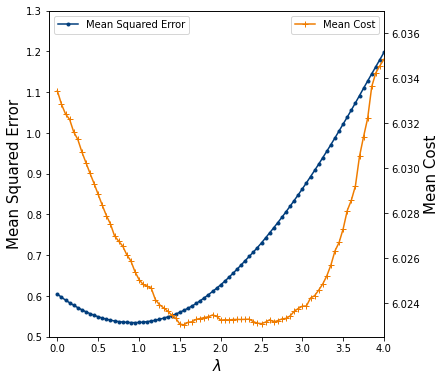

In [24]:
results = pickle.load( open( '421cross_validata.pickle', "rb" ) )
plotter, regret, hth, mci, pio, mu_range, lamb_range, lamb_opt, lamb_final, lamb_min_ind, c_ols_true, c_oracle, pac, pac_true, data = results
lamb_range_cut = lamb_range

mu_range = [mu_range[8]]
print(len(lamb_range))
for mu in mu_range:
    fig,ax = plt.subplots(figsize=(6,6))
    ax.plot(lamb_range_cut, pac_true[mu], marker=".", label='Mean Squared Error', color='#003D7C')
    ax.set_xlabel('$\lambda$', fontsize=15)
    ax.set_ylabel('Mean Squared Error', fontsize=15) #, color='#003D7C'
    ax.set_ylim(0.50, 1.3)
    ax.legend(loc = 2)
    
    ax2=ax.twinx()
    ax2.plot(lamb_range_cut, plotter[mu], color='#EF7C00', marker="+", label='Mean Cost')
    ax2.set_ylabel("Mean Cost",fontsize=15)#, color='#EF7C00'
    ax2.set_ylim(6.0225, 6.037)
    ax2.legend(loc = 1)
#     plt.show()

plt.rcParams.update({'font.size': 12})


plt.xlim(-0.1, 4)
fig.savefig('Prediction_accuracy.eps', format='eps', bbox_inches="tight")
fig.savefig('Prediction_accuracy.pdf', format='pdf', bbox_inches="tight")

### Regression with confidence interval

In [24]:
import seaborn as sns
random.seed(seed)
p = 1
d = 1
samples_test = 100
samples_train = 50
lower = 0
upper = 1
alpha = 1
n_epsilon = 0
mis = 1
thres = 100000
## Generate data below
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p
W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
data = generate_samples(p,d,samples_test, samples_train, alpha, W_star, n_epsilon = 1, mis = 1, thres = 100000, 
                     version = 1, x_dist = 'normal', e_dist = 'normal', x_low = -2, x_up = 4, x_mean = 2, 
                     x_var = 0.5, bump = 7)
x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


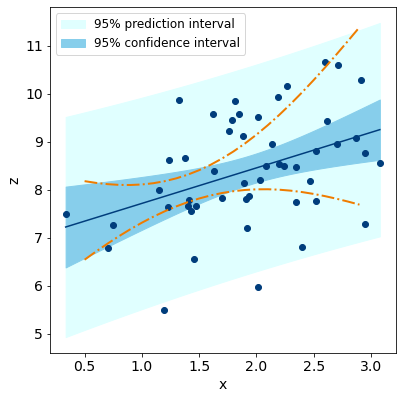

In [65]:
import scipy.stats as stats
x = x_train.T[0]
y = z_train.T[0]

slope, intercept = np.polyfit(x, y, 1)  # linear model adjustment

y_model = np.polyval([slope, intercept], x)   # modeling...

x_mean = np.mean(x)
y_mean = np.mean(y)
n = x.size                        # number of samples
m = 2                             # number of parameters
dof = n - m                       # degrees of freedom
t = stats.t.ppf(0.975, dof)       # Students statistic of interval confidence

residual = y - y_model

std_error = (np.sum(residual**2) / dof)**.5   # Standard deviation of the error

# calculating the r2
# https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
# Pearson's correlation coefficient
numerator = np.sum((x - x_mean)*(y - y_mean))
denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
correlation_coef = numerator / denominator
r2 = correlation_coef**2

# mean squared error
MSE = 1/n * np.sum( (y - y_model)**2 )

# to plot the adjusted model
x_line = np.linspace(np.min(x), np.max(x), 100)
y_line = np.polyval([slope, intercept], x_line)

# confidence interval
ci = t * std_error * (1/n + (x_line - x_mean)**2 / np.sum((x - x_mean)**2))**.5
# predicting interval
pi = t * std_error * (1 + 1/n + (x_line - x_mean)**2 / np.sum((x - x_mean)**2))**.5  

############### Ploting
plt.rcParams.update({'font.size': 14})
fig = plt.figure(figsize=(6,6))
ax = fig.add_axes([.1, .1, .8, .8])

ax.plot(x, y, 'o', color = '#003D7C') # royalblue
ax.plot(x_line, y_line, color = '#003D7C')
ax.fill_between(x_line, y_line + pi, y_line - pi, color = 'lightcyan', label = '95% prediction interval')
ax.fill_between(x_line, y_line + ci, y_line - ci, color = 'skyblue', label = '95% confidence interval') #skyblue

ax.set_xlabel('x')
ax.set_ylabel('z')

# rounding and position must be changed for each case and preference
a = str(np.round(intercept))
b = str(np.round(slope,2))
r2s = str(np.round(r2,2))
MSEs = str(np.round(MSE))

# ax.text(3.5, 10.0, 'y = ' + a + ' + ' + b + ' x')
# ax.text(3.5, 9.0, '$r^2$ = ' + r2s + '     MSE = ' + MSEs)

plt.legend(fontsize=12)

x1 = np.array([0.5 + 0.1*i for i in range(25)])
y1 = 1.953*(sin(x1-3.14159)) - 0.07127*((x1-9.7)**2) + 15.15
plt.plot(x1,y1, '-.', color = '#EF7C00', alpha = 1, linewidth = 2.0)

y2 = -1.208*(sin(x1-3.14159)) - 0.03607*((x1-10)**2) + 9.221
plt.plot(x1,y2, '-.', color = '#EF7C00', alpha = 1, linewidth = 2.0)
fig.savefig('Prediction_intrval.eps', format='eps', bbox_inches="tight")
fig.savefig('Prediction_intrval.pdf', format='pdf', bbox_inches="tight")

<a id='Sec_4.1'></a>
## Section 4.1: Benchmarks
[Go back to top](#Top)

<a id='Part_4.1.1'></a>
### 4.1.1 Comparison against SPO+   
[Go back to top](#Top)

We will plot two figures in this subsection:

Figure 4.1.1.1: OLS vs SPO+

Figure 4.1.1.2: DDR vs SPO+

In [25]:
## Train and test data are not separated
def each_iter_ddr_vs_spo_and_ols(data, mis, thres, mu, lamb, ypio = 0):
    x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data
    ## Solve and evaluate the OLS model
    W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)
    z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
    c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)

    y_test_opt = decision_finder(z_test_ori)
    c_oracle = mean(np.sum(np.minimum(z_test_ori,thres) * y_test_opt, axis = 1))
    
    ## Solve and evaluate the DDR model
    # Obtain regression parameters
    W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb) #******
    z_test_ddr, y_test_ddr, c_test_ddr = param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres)
    c_ddr_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
    
    ## Solve and evaluate the SPO+ model
    # Obtain regression parameters
    y_train_opt = decision_finder(z_train) #generates the optimal y from the training costs
    W_spo, w0_spo, t_spo = spo_solver(x_train, z_train, y_train_opt)
    
    z_test_spo, y_test_spo, c_test_spo = param_prediction_and_cost_estimation(x_test, W_spo, w0_spo, thres)
    c_spo_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_spo, axis = 1)
    
    if ypio == 0:
#     # compares results
        lbels_ddrspo, h2h_ddrspo, mci_ddrspo = cross_compare2(c_ddr_true, c_spo_true, c_oracle)
        lbels_olsspo, h2h_olsspo, mci_olsspo = cross_compare2(c_ols_true, c_spo_true, c_oracle)
        lbels_ddrols, h2h_ddrols, mci_ddrols = cross_compare2(c_ddr_true, c_ols_true, c_oracle)
        return h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols
    else:
        # compares results plus
        lbels_ddrspo, h2h_ddrspo, mci_ddrspo, pio_ddrspo = cross_compare2plus(c_ddr_true, c_spo_true, c_oracle)
        lbels_olsspo, h2h_olsspo, mci_olsspo, pio_olsspo = cross_compare2plus(c_ols_true, c_spo_true, c_oracle)
        lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = cross_compare2plus(c_ddr_true, c_ols_true, c_oracle)

        return h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols, pio_ddrspo, pio_olsspo, pio_ddrols 

## Train and test data are separated
def each_iter_ddr_vs_spo_and_ols_train(Data_train, thres, mu, lamb):
    x_train, z_train_ori, z_train, W_star = Data_train
    Results_ols = ols_solver(x_train, z_train)
#     Results_abs = L1_ols_solver(x_train, z_train)
    Results_ddr = ddr_solver(x_train, z_train, thres, mu, lamb) #******
    
#     print(Results_ddr[0])
    
    y_train_opt = decision_finder(z_train) 
    Results_spo = spo_solver(x_train, z_train, y_train_opt)
    return Results_ols, Results_ddr, Results_spo, Results_abs

def each_iter_ddr_vs_spo_and_ols_test(Data_test, Results_train, thres):
    x_test, z_test_ori, z_test = Data_test
    Results_train_ols, Results_train_ddr, Results_train_spo, Results_train_abs = Results_train
    
    W_ols = Results_train_ols[0]
    w0_ols = Results_train_ols[1]
    z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
    c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)
    
#     W_abs = Results_train_abs[0]
#     w0_abs = Results_train_abs[1]
#     z_test_abs, y_test_abs, c_test_abs = param_prediction_and_cost_estimation(x_test, W_abs, w0_abs, thres)
#     c_abs_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_abs, axis = 1)

    y_test_opt = decision_finder(z_test_ori)
    c_oracle_true = mean(np.sum(np.minimum(z_test_ori,thres) * y_test_opt, axis = 1))
    
    W_ddr = Results_train_ddr[0]
    w0_ddr = Results_train_ddr[1]
    z_test_ddr, y_test_ddr, c_test_ddr = param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres)
    c_ddr_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
    
    W_spo = Results_train_spo[0]
    w0_spo = Results_train_spo[1]
    z_test_spo, y_test_spo, c_test_spo = param_prediction_and_cost_estimation(x_test, W_spo, w0_spo, thres)
    c_spo_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_spo, axis = 1)
    
    lbels_ddrspo, h2h_ddrspo, mci_ddrspo = cross_compare2(c_ddr_true, c_spo_true, c_oracle_true)
    lbels_ddrols, h2h_ddrols, mci_ddrols = cross_compare2(c_ddr_true, c_ols_true, c_oracle_true)
#     lbels_absols, h2h_absols, mci_absols = cross_compare2(c_abs_true, c_ols_true, c_oracle_true)
    
    return lbels_ddrspo, h2h_ddrspo, mci_ddrspo, lbels_ddrols, h2h_ddrols, mci_ddrols, lbels_absols, h2h_absols, mci_absols

In [28]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 10000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
bp = 7

mu = 0.25
lamb = 0.25

## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_ddrspo = []
all_mci_ddrspo = []
all_pio_ddrspo = []

all_h2h_olsspo = []
all_mci_olsspo = []
all_pio_olsspo = []

all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012

    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp)
    
    h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols, pio_ddrspo, pio_olsspo, pio_ddrols\
    = each_iter_ddr_vs_spo_and_ols(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_ddrspo.append(h2h_ddrspo*100)
    all_mci_ddrspo.append(mci_ddrspo*100)
    all_pio_ddrspo.append(pio_ddrspo*100)
    
    all_h2h_olsspo.append(h2h_olsspo*100)
    all_mci_olsspo.append(mci_olsspo*100)
    all_pio_olsspo.append(pio_olsspo*100)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
results = [all_h2h_ddrspo, all_mci_ddrspo, all_pio_ddrspo, all_h2h_olsspo, all_mci_olsspo, all_pio_olsspo, all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols]
string = '411_ddr_spo.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
# figure_plot_upleft(all_wins, all_mean_cost_imp_oracle, figure_name, size = (5, 5), move = [-0.12, 0.04])
end = time.time()
print(end - start)

92.34022927284241


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


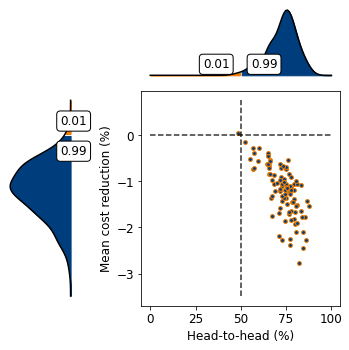

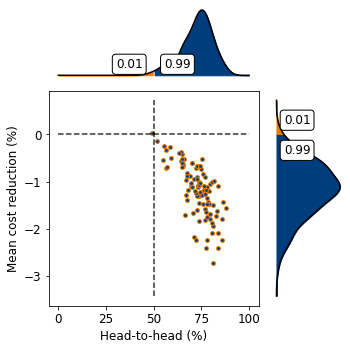

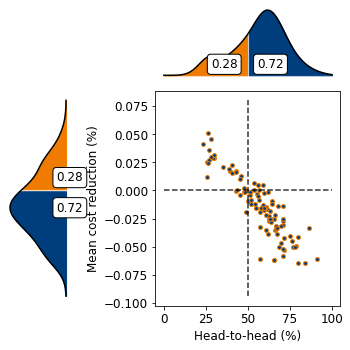

In [29]:
figure_plot_upleft(all_h2h_ddrspo, all_mci_ddrspo, figure_name = '411_ddr_spo', size = (5, 5), move = [-0.12, 0.02, 0.31, 0.55])

figure_plot_upright(all_h2h_olsspo, all_mci_olsspo, figure_name = '411_ols_spo', size = (5, 5), move = [-0.12, 0.02, 0.32, 0.55])

figure_plot_upleft(all_h2h_ddrols, all_mci_ddrols, figure_name = '411_ddr_ols', size = (5, 5), move = [-0.10, 0.04, 0.30, 0.55])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


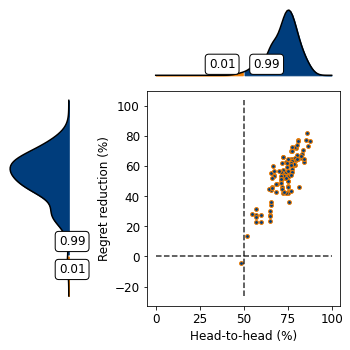

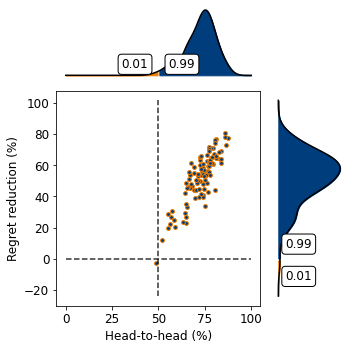

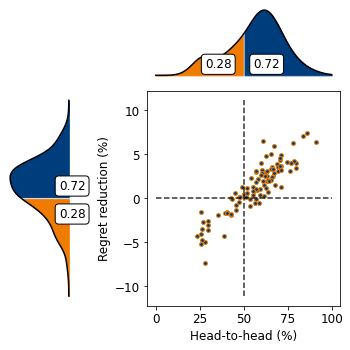

In [30]:
figure_plot_upleft(all_h2h_ddrspo, all_pio_ddrspo, figure_name = '411_ddr_spo_pio_mis1point8', size = (5, 5), move = [-0.05, 0.08, 0.32, 0.55], ypio = 1)

figure_plot_upright(all_h2h_olsspo, all_pio_olsspo, figure_name = '411_ols_spo_pio', size = (5, 5), move = [-0.07, 0.08, 0.32, 0.55], ypio = 1)

figure_plot_upleft(all_h2h_ddrols, all_pio_ddrols, figure_name = '411_ddr_ols_pio', size = (5, 5), move = [-0.09, 0.04, 0.30, 0.55], ypio = 1)

<a id='Part_4.1.2'></a>
### 4.1.2 Adding quadratic terms
[Go back to top](#Top)

We will plot two figures in this subsection:

Figure 4.1.2.1: OLS vs SPO+ (both has quadratic terms)

Figure 4.1.2.2: DDR vs SPO+ (both has quadratic terms)

#### mis = 3, no quadratic term

In [31]:
## the improvement is significant only when bp = 20
## if bp = 10, h2h does not have much improvement for uniformX + normalE
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 3
thres = 10000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25

## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_ddrspo = []
all_mci_ddrspo = []
all_pio_ddrspo = []

all_h2h_olsspo = []
all_mci_olsspo = []
all_pio_olsspo = []

all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
    
    # 0 mis out; 1 mis in, X N(0,1); epsilon U[-alpha, alpha]; 2 n epsilon; 3 spo+; 4 sparse X; 
    #5 X U[0,1], epsilon U[-alpha, alpha]; 6 X N(0,1), epsilon N(0,1)
    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp) 
    
    h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols, pio_ddrspo, pio_olsspo, pio_ddrols = \
    each_iter_ddr_vs_spo_and_ols(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_ddrspo.append(h2h_ddrspo*100)
    all_mci_ddrspo.append(mci_ddrspo*100)
    all_pio_ddrspo.append(pio_ddrspo*100)
    
    all_h2h_olsspo.append(h2h_olsspo*100)
    all_mci_olsspo.append(mci_olsspo*100)
    all_pio_olsspo.append(pio_olsspo*100)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
results = [all_h2h_ddrspo, all_mci_ddrspo, all_pio_ddrspo, all_h2h_olsspo, all_mci_olsspo, all_pio_olsspo, all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols]
string = '411_ddr_spo.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
# figure_plot_upleft(all_wins, all_mean_cost_imp_oracle, figure_name, size = (5, 5), move = [-0.12, 0.04])
end = time.time()
print(end - start)

92.02438688278198


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


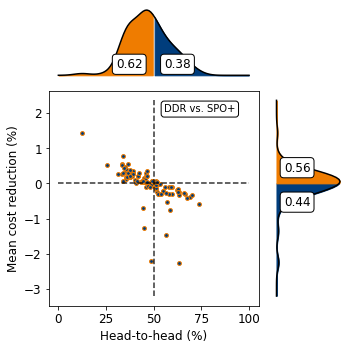

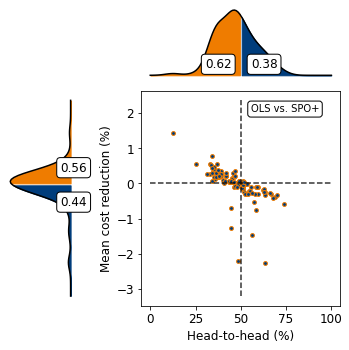

In [32]:
figure_plot_upright(all_h2h_ddrspo, all_mci_ddrspo, figure_name = '411_ddr_spo_mis3', size = (5, 5), move = [-0.11, 0.05, 0.32, 0.55], sublabel = 'DDR vs. SPO+')

figure_plot_upleft(all_h2h_olsspo, all_mci_olsspo, figure_name = '411_ols_spo_mis3', size = (5, 5), move = [-0.11, 0.05, 0.32, 0.55], sublabel = 'OLS vs. SPO+')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


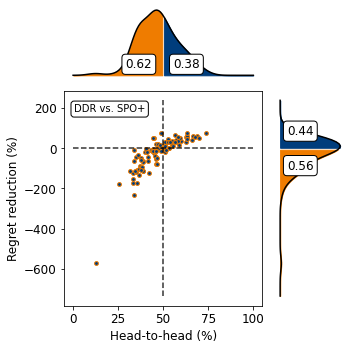

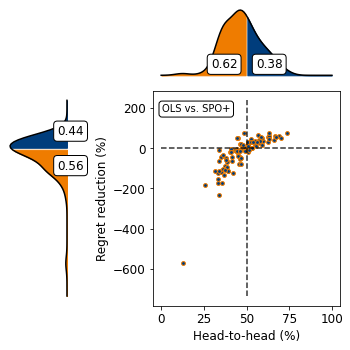

In [33]:
figure_plot_upright(all_h2h_ddrspo, all_pio_ddrspo, figure_name = '411_ddr_spo_mis3_pio', size = (5, 5), move = [-0.12, 0.04, 0.31, 0.55], sublabel = 'DDR vs. SPO+', ypio = 1)

figure_plot_upleft(all_h2h_olsspo, all_pio_olsspo, figure_name = '411_ols_spo_mis3_pio', size = (5, 5), move = [-0.12, 0.04, 0.31, 0.55], sublabel = 'OLS vs. SPO+', ypio = 1)

In [34]:
mean(all_mci_olsspo)

-0.028835258741516517

In [35]:
x_test = np.array([[1,1],[2,3],[4,5]])
N,p = x_test.shape
temp = [np.multiply(x_test[:,i], x_test[:,j]).tolist() for i in range(p) for j in range(i+1)]
x_test_qua = np.concatenate( (x_test, np.array(temp).T), axis = 1 )
print(x_test_qua)

[[ 1  1  1  1  1]
 [ 2  3  4  6  9]
 [ 4  5 16 20 25]]


#### mis = 3, with quadratic term
We do this by letting the x_train = np.concatenate( (x_train, np.square(x_train)), axis = 1 )

In [24]:
def each_iter_ddr_vs_spo_and_ols_qua(data, mis, thres, mu, lamb, ypio = 0):
    x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data
#     x_test_qua = np.concatenate( (x_test, np.square(x_test)), axis = 1 )
#     x_train_qua = np.concatenate( (x_train, np.square(x_train)), axis = 1 ) # N*(2p)
#     print(x_test.shape, x_test)
    temp = [np.multiply(x_test[:,i], x_test[:,j]).tolist() for i in range(p) for j in range(i+1)]
    x_test_qua = np.concatenate( (x_test, np.array(temp).T), axis = 1 )
    
    temp = [np.multiply(x_train[:,i], x_train[:,j]).tolist() for i in range(p) for j in range(i+1)]
    x_train_qua = np.concatenate( (x_train, np.array(temp).T), axis = 1 )
    
    ## Solve and evaluate the OLS model
    W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)
    z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
    c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)
    
    W_ols_qua, w0_ols_qua, t_ols_qua, obj_ols_qua = ols_solver(x_train_qua, z_train)
    z_test_ols_qua, y_test_ols_qua, c_test_ols_qua = param_prediction_and_cost_estimation(x_test_qua, W_ols_qua, w0_ols_qua, thres)
    c_ols_true_qua =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols_qua, axis = 1)

    y_test_opt = decision_finder(z_test_ori)
    c_oracle = mean(np.sum(np.minimum(z_test_ori,thres) * y_test_opt, axis = 1))
    
    ## Solve and evaluate the DDR model
    # Obtain regression parameters
    W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb) #******
    z_test_ddr, y_test_ddr, c_test_ddr = param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres)
    c_ddr_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
    
    W_ddr_qua, w0_ddr_qua, t_ddr_qua = ddr_solver(x_train_qua, z_train, thres, mu, lamb) #******
    z_test_ddr_qua, y_test_ddr_qua, c_test_ddr_qua = param_prediction_and_cost_estimation(x_test_qua, W_ddr_qua, w0_ddr_qua, thres)
    c_ddr_true_qua =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr_qua, axis = 1)
    
    ## Solve and evaluate the SPO+ model
    # Obtain regression parameters
    y_train_opt = decision_finder(z_train) 
    W_spo, w0_spo, t_spo = spo_solver(x_train, z_train, y_train_opt)
    
    z_test_spo, y_test_spo, c_test_spo = param_prediction_and_cost_estimation(x_test, W_spo, w0_spo, thres)
    c_spo_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_spo, axis = 1)
    
    W_spo_qua, w0_spo_qua, t_spo_qua = spo_solver(x_train_qua, z_train, y_train_opt)
    
    z_test_spo_qua, y_test_spo_qua, c_test_spo_qua = param_prediction_and_cost_estimation(x_test_qua, W_spo_qua, w0_spo_qua, thres)
    c_spo_true_qua =  np.sum(np.minimum(z_test_ori,thres) * y_test_spo_qua, axis = 1)
    
    if ypio == 0:
    # compares results
        lbels_ddrspo, h2h_ddrspo, mci_ddrspo = cross_compare2(c_ddr_true_qua, c_spo_true_qua, c_oracle)
        lbels_olsspo, h2h_olsspo, mci_olsspo = cross_compare2(c_ols_true_qua, c_spo_true_qua, c_oracle)
        lbels_ddrols, h2h_ddrols, mci_ddrols = cross_compare2(c_ddr_true_qua, c_ols_true_qua, c_oracle)

        lbels_ddrqua, h2h_ddrqua, mci_ddrqua = cross_compare2(c_ddr_true_qua, c_ddr_true, c_oracle)
        lbels_olsqua, h2h_olsqua, mci_olsqua = cross_compare2(c_ols_true_qua, c_ols_true, c_oracle)
        lbels_spoqua, h2h_spoqua, mci_spoqua = cross_compare2(c_spo_true_qua, c_spo_true, c_oracle)
        return h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols, h2h_ddrqua, mci_ddrqua, h2h_olsqua, mci_olsqua, h2h_spoqua, mci_spoqua
    
    else:
        lbels_ddrspo, h2h_ddrspo, mci_ddrspo, pio_ddrspo = cross_compare2plus(c_ddr_true_qua, c_spo_true_qua, c_oracle)
        lbels_olsspo, h2h_olsspo, mci_olsspo, pio_olsspo = cross_compare2plus(c_ols_true_qua, c_spo_true_qua, c_oracle)
        lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = cross_compare2plus(c_ddr_true_qua, c_ols_true_qua, c_oracle)

        lbels_ddrqua, h2h_ddrqua, mci_ddrqua, pio_ddrqua = cross_compare2plus(c_ddr_true_qua, c_ddr_true, c_oracle)
        lbels_olsqua, h2h_olsqua, mci_olsqua, pio_olsqua = cross_compare2plus(c_ols_true_qua, c_ols_true, c_oracle)
        lbels_spoqua, h2h_spoqua, mci_spoqua, pio_spoqua = cross_compare2plus(c_spo_true_qua, c_spo_true, c_oracle)
    
        return h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols, h2h_ddrqua, mci_ddrqua, h2h_olsqua, mci_olsqua, h2h_spoqua, mci_spoqua, pio_ddrspo, pio_olsspo, pio_ddrols, pio_ddrqua, pio_olsqua, pio_spoqua 

In [37]:
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 3
thres = 10000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25

## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_ddrspo = []
all_mci_ddrspo = []
all_pio_ddrspo = []

all_h2h_olsspo = []
all_mci_olsspo = []
all_pio_olsspo = []

all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
####
all_h2h_ddrqua = []
all_mci_ddrqua = []
all_pio_ddrqua = []

all_h2h_olsqua = []
all_mci_olsqua = []
all_pio_olsqua = []

all_h2h_spoqua = []
all_mci_spoqua = []
all_pio_spoqua = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
    
    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp) 

    
    h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols, \
    h2h_ddrqua, mci_ddrqua, h2h_olsqua, mci_olsqua, h2h_spoqua, mci_spoqua, \
    pio_ddrspo, pio_olsspo, pio_ddrols, pio_ddrqua, pio_olsqua, pio_spoqua\
    = each_iter_ddr_vs_spo_and_ols_qua(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_ddrspo.append(h2h_ddrspo*100)
    all_mci_ddrspo.append(mci_ddrspo*100)
    all_pio_ddrspo.append(pio_ddrspo*100)
    
    all_h2h_olsspo.append(h2h_olsspo*100)
    all_mci_olsspo.append(mci_olsspo*100)
    all_pio_olsspo.append(pio_olsspo*100)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
    ##
    all_h2h_ddrqua.append(h2h_ddrqua*100)
    all_mci_ddrqua.append(mci_ddrqua*100)
    all_pio_ddrqua.append(pio_ddrqua*100)
    
    all_h2h_olsqua.append(h2h_olsqua*100)
    all_mci_olsqua.append(mci_olsqua*100)
    all_pio_olsqua.append(pio_olsqua*100)
    
    all_h2h_spoqua.append(h2h_spoqua*100)
    all_mci_spoqua.append(mci_spoqua*100)
    all_pio_spoqua.append(pio_spoqua*100)
    
results = [all_h2h_ddrspo, all_mci_ddrspo, all_h2h_olsspo, all_mci_olsspo, all_h2h_ddrols, all_mci_ddrols,\
          all_h2h_ddrqua, all_mci_ddrqua, all_h2h_olsqua, all_mci_olsqua, all_h2h_spoqua, all_mci_spoqua,\
          all_pio_ddrspo, all_pio_olsspo, all_pio_ddrols, all_pio_ddrqua, all_pio_olsqua, all_pio_spoqua]
string = '411_ddr_spo_qua.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
# figure_plot_upleft(all_wins, all_mean_cost_imp_oracle, figure_name, size = (5, 5), move = [-0.12, 0.04])
end = time.time()
print(end - start)

528.291665315628


In [38]:
all_h2h_ddrspo, all_mci_ddrspo, all_h2h_olsspo, all_mci_olsspo, all_h2h_ddrols, all_mci_ddrols,\
all_h2h_ddrqua, all_mci_ddrqua, all_h2h_olsqua, all_mci_olsqua, all_h2h_spoqua, all_mci_spoqua,\
all_pio_ddrspo, all_pio_olsspo, all_pio_ddrols, all_pio_ddrqua, all_pio_olsqua, all_pio_spoqua = pickle.load( open( '411_ddr_spo_qua.pickle', "rb" ) )

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


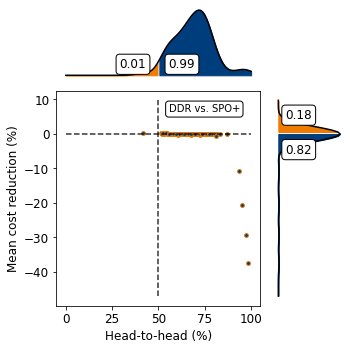

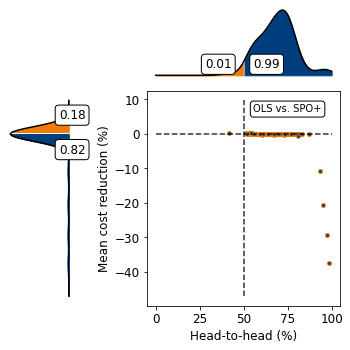

In [39]:
figure_plot_upright(all_h2h_ddrspo, all_mci_ddrspo, figure_name = '411_ddr_qua_spo_qua', size = (5, 5), move = [-0.12, 0.04, 0.31, 0.55], sublabel = 'DDR vs. SPO+')

figure_plot_upleft(all_h2h_olsspo, all_mci_olsspo, figure_name = '411_ols_qua_spo_qua', size = (5, 5), move = [-0.12, 0.04, 0.30, 0.55], sublabel = 'OLS vs. SPO+')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


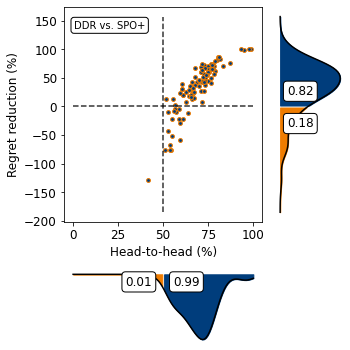

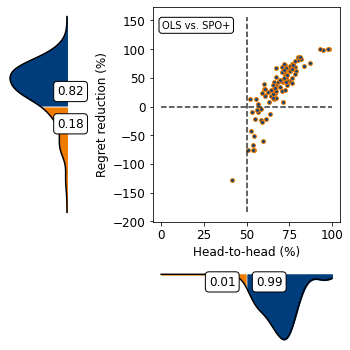

In [40]:
figure_plot_lowright(all_h2h_ddrspo, all_pio_ddrspo, figure_name = '411_ddr_qua_spo_qua_pio', size = (5, 5), move = [-0.10, 0.05, 0.31, 0.55], sublabel = 'DDR vs. SPO+', ypio = 1)

figure_plot_lowleft(all_h2h_olsspo, all_pio_olsspo, figure_name = '411_ols_qua_spo_qua_pio', size = (5, 5), move = [-0.10, 0.05, 0.30, 0.55], sublabel = 'OLS vs. SPO+', ypio = 1)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


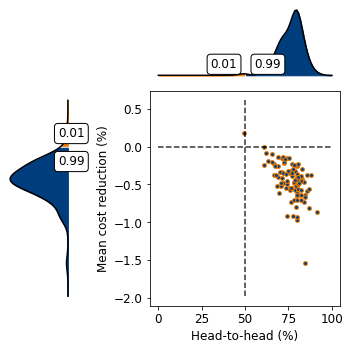

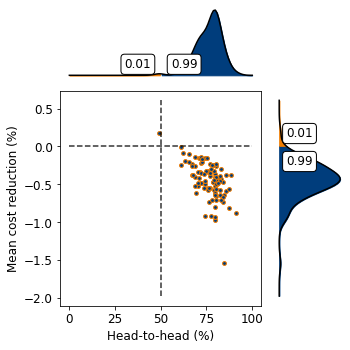

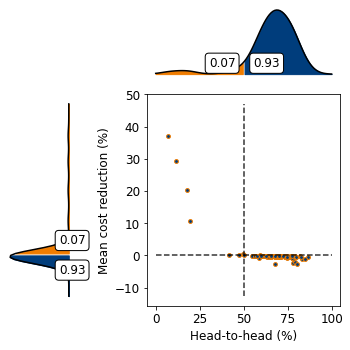

In [41]:
figure_plot_upleft(all_h2h_ddrqua, all_mci_ddrqua, figure_name = '411_ddr_qua', size = (5, 5), move = [-0.11, 0.02, 0.32, 0.55])

figure_plot_upright(all_h2h_olsqua, all_mci_olsqua, figure_name = '411_ols_qua', size = (5, 5), move = [-0.11, 0.02, 0.32, 0.55])

figure_plot_upleft(all_h2h_spoqua, all_mci_spoqua, figure_name = '411_spo_qua', size = (5, 5), move = [-0.06, 0.08, 0.32, 0.55])

<a id='Part_4.1.3'></a>
### 4.1.3 Against LASSO and Ridge
[Go back to top](#Top)
We will plot four figures in this subsection:

Figure 4.1.3.1: LASSO vs OLS 

Figure 4.1.3.2: Ridge vs OLS 

Figure 4.1.3.3: LASSO vs DDR 

Figure 4.1.3.4: Ridge vs DDR 

In [26]:
def each_iter_vs_lasso_ridge(data, mis, thres, mu, lamb, ypio = 0):
    x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data
    ## Solve and evaluate the OLS model
    W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)
    z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
    c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)
    
    z_train_ols, y_train_ols, c_train_ols = param_prediction_and_cost_estimation(x_train, W_ols, w0_ols, thres)
    pac_ols = np.linalg.norm(z_test_ols - z_test)/len(z_test) # prediction accuracy
    
    ## Solve and evaluate the LASSO model
    W_lso, w0_lso, t_lso = lasso_solver(x_train, z_train)
    z_test_lso, y_test_lso, c_test_lso = param_prediction_and_cost_estimation(x_test, W_lso, w0_lso, thres)
    c_lso_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_lso, axis = 1)
    
    z_train_lso, y_train_lso, c_train_lso = param_prediction_and_cost_estimation(x_train, W_lso, w0_lso, thres)
    pac_lso = np.linalg.norm(z_test_lso - z_test)/len(z_test) # prediction accuracy
    
    ## Solve and evaluate the LASSO model
    W_rgi, w0_rgi, t_rgi = ridge_solver(x_train, z_train)
    z_test_rgi, y_test_rgi, c_test_rgi = param_prediction_and_cost_estimation(x_test, W_rgi, w0_rgi, thres)
    c_rgi_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_rgi, axis = 1)
    
    z_train_rgi, y_train_rgi, c_train_rgi = param_prediction_and_cost_estimation(x_train, W_rgi, w0_rgi, thres)
    pac_rgi = np.linalg.norm(z_test_rgi - z_test)/len(z_test) # prediction accuracy
    
    
    y_test_opt = decision_finder(z_test_ori)
    c_oracle = mean(np.sum(np.minimum(z_test_ori,thres) * y_test_opt, axis = 1))
    
    ## Solve and evaluate the DDR model
    # Obtain regression parameters
    W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb) #******
    z_test_ddr, y_test_ddr, c_test_ddr = param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres)
    c_ddr_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
    
    z_train_ddr, y_train_ddr, c_train_ddr = param_prediction_and_cost_estimation(x_train, W_ddr, w0_ddr, thres)
    pac_ddr = np.linalg.norm(z_test_ddr - z_test)/len(z_test) # prediction accuracy
    
#     print(c_rgi_true - c_ddr_true)
    
    if ypio == 0:
        # compares results
        lbels_lsools, h2h_lsools, mci_lsools = cross_compare2(c_lso_true, c_ols_true, c_oracle)
        lbels_rgiols, h2h_rgiols, mci_rgiols = cross_compare2(c_rgi_true, c_ols_true, c_oracle)

        lbels_lsoddr, h2h_lsoddr, mci_lsoddr = cross_compare2(c_lso_true, c_ddr_true, c_oracle)
        lbels_rgiddr, h2h_rgiddr, mci_rgiddr = cross_compare2(c_rgi_true, c_ddr_true, c_oracle)

        return h2h_lsools, mci_lsools, h2h_rgiols, mci_rgiols, h2h_lsoddr, mci_lsoddr, h2h_rgiddr, mci_rgiddr
    
    else:
        # compares results
        lbels_lsools, h2h_lsools, mci_lsools, pio_lsools = cross_compare2plus(c_lso_true, c_ols_true, c_oracle)
        lbels_rgiols, h2h_rgiols, mci_rgiols, pio_rgiols = cross_compare2plus(c_rgi_true, c_ols_true, c_oracle)

        lbels_lsoddr, h2h_lsoddr, mci_lsoddr, pio_lsoddr = cross_compare2plus(c_lso_true, c_ddr_true, c_oracle)
        lbels_rgiddr, h2h_rgiddr, mci_rgiddr, pio_rgiddr = cross_compare2plus(c_rgi_true, c_ddr_true, c_oracle)

        return h2h_lsools, mci_lsools, h2h_rgiols, mci_rgiols, h2h_lsoddr, mci_lsoddr, h2h_rgiddr, mci_rgiddr, pio_lsools, pio_rgiols, pio_lsoddr, pio_rgiddr, pac_ols, pac_lso, pac_rgi, pac_ddr


In [43]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 10000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25


## generate samples
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_lsools = []
all_mci_lsools = []
all_pio_lsools = []
all_h2h_rgiols = []
all_mci_rgiols = []
all_pio_rgiols = []

all_h2h_lsoddr = []
all_mci_lsoddr = []
all_pio_lsoddr = []
all_h2h_rgiddr = []
all_mci_rgiddr = []
all_pio_rgiddr = []

all_pac_ols = [] 
all_pac_lso = []
all_pac_rgi = [] 
all_pac_ddr = []

for i in range(iters):
    # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
    W_star = generate_truth(lower, upper, p, d, version = 0) 
    
    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp) 
    
    h2h_lsools, mci_lsools, h2h_rgiols, mci_rgiols, h2h_lsoddr, mci_lsoddr, h2h_rgiddr, mci_rgiddr,\
    pio_lsools, pio_rgiols, pio_lsoddr, pio_rgiddr,\
    pac_ols, pac_lso, pac_rgi, pac_ddr = each_iter_vs_lasso_ridge(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_lsools.append(h2h_lsools*100)
    all_mci_lsools.append(mci_lsools*100)
    all_pio_lsools.append(pio_lsools*100)
    
    all_h2h_rgiols.append(h2h_rgiols*100)
    all_mci_rgiols.append(mci_rgiols*100)
    all_pio_rgiols.append(pio_rgiols*100)
    
    all_h2h_lsoddr.append(h2h_lsoddr*100)
    all_mci_lsoddr.append(mci_lsoddr*100)
    all_pio_lsoddr.append(pio_lsoddr*100)
    
    all_h2h_rgiddr.append(h2h_rgiddr*100)
    all_mci_rgiddr.append(mci_rgiddr*100)
    all_pio_rgiddr.append(pio_rgiddr*100)
    
    all_pac_ols.append(pac_ols)
    all_pac_lso.append(pac_lso)
    all_pac_rgi.append(pac_rgi)
    all_pac_ddr.append(pac_ddr)
    
results = [all_h2h_lsools, all_mci_lsools, all_h2h_rgiols, all_mci_rgiols, all_h2h_lsoddr,\
           all_mci_lsoddr, all_h2h_lsoddr, all_mci_lsoddr,\
           all_pio_lsools, all_pio_rgiols, all_pio_lsoddr, all_pio_lsoddr,\
           all_pac_ols, all_pac_lso, all_pac_rgi, all_pac_ddr]
string = '413lso_rgi_vs_ols_and_ddr.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
end = time.time()
print(end - start)

190.82941007614136


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


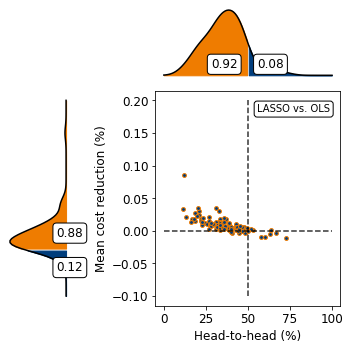

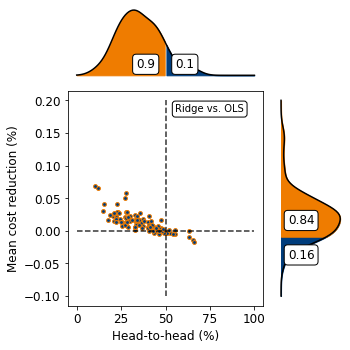

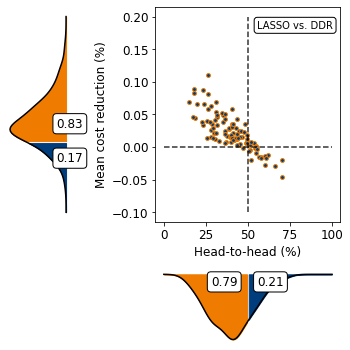

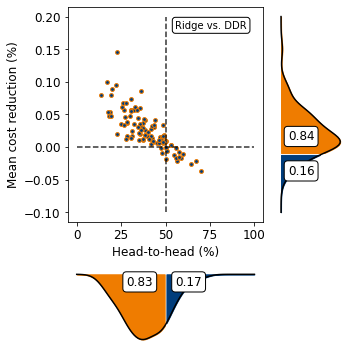

In [44]:
figure_plot_upleft(all_h2h_lsools, all_mci_lsools, figure_name = '413lsools', size = (5, 5), move = [-0.08, 0.08, 0.30, 0.55], ysame = 1, yrange = [-0.1,.2], sublabel = 'Lasso vs. OLS')
figure_plot_upright(all_h2h_rgiols, all_mci_rgiols, figure_name = '413rgiols', size = (5, 5), move = [-0.08, 0.08, 0.35, 0.55], ysame = 1, yrange = [-0.1,.2], sublabel = 'Ridge vs. OLS')
figure_plot_lowleft(all_h2h_lsoddr, all_mci_lsoddr, figure_name = '413lsoddr', size = (5, 5), move = [-0.08, 0.08, 0.30, 0.55], ysame = 1, yrange = [-0.1,.2], sublabel = 'Lasso vs. DDR')
figure_plot_lowright(all_h2h_rgiddr, all_mci_rgiddr, figure_name = '413rgiddr', size = (5, 5), move = [-0.08, 0.08, 0.30, 0.55], ysame = 1, yrange = [-0.1,.2], sublabel = 'Ridge vs. DDR')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


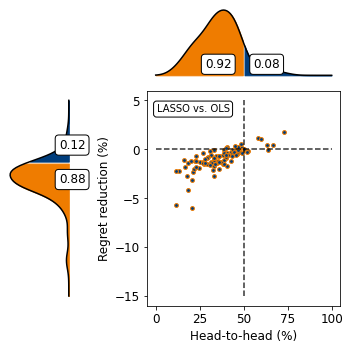

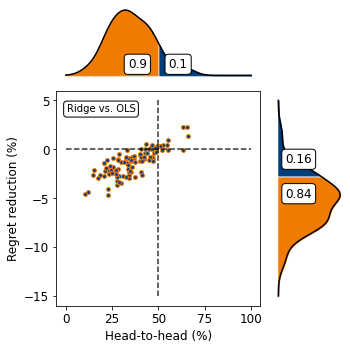

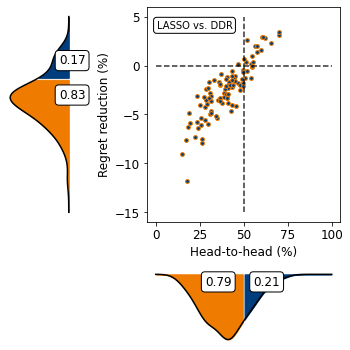

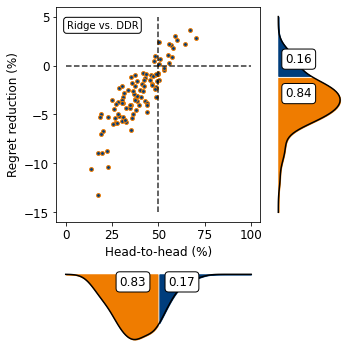

In [45]:
figure_plot_upleft(all_h2h_lsools, all_pio_lsools, figure_name = '413lsools_pio', size = (5, 5), move = [-0.11, 0.05, 0.30, 0.55], ysame = 1, yrange = [-15,5], sublabel = 'Lasso vs. OLS', ypio = 1)
figure_plot_upright(all_h2h_rgiols, all_pio_rgiols, figure_name = '413rgiols_pio', size = (5, 5), move = [-0.11, 0.05, 0.35, 0.55], ysame = 1, yrange = [-15,5], sublabel = 'Ridge vs. OLS', ypio = 1)
figure_plot_lowleft(all_h2h_lsoddr, all_pio_lsoddr, figure_name = '413lsoddr_pio', size = (5, 5), move = [-0.11, 0.05, 0.30, 0.55], ysame = 1, yrange = [-15,5], sublabel = 'Lasso vs. DDR', ypio = 1)
figure_plot_lowright(all_h2h_rgiddr, all_pio_rgiddr, figure_name = '413rgiddr_pio', size = (5, 5), move = [-0.11, 0.05, 0.31, 0.55], ysame = 1, yrange = [-15,5], sublabel = 'Ridge vs. DDR', ypio = 1)

In [104]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 20
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 10000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25


## generate samples
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_lsools = []
all_mci_lsools = []
all_pio_lsools = []
all_h2h_rgiols = []
all_mci_rgiols = []
all_pio_rgiols = []

all_h2h_lsoddr = []
all_mci_lsoddr = []
all_pio_lsoddr = []
all_h2h_rgiddr = []
all_mci_rgiddr = []
all_pio_rgiddr = []

all_pac_ols = [] 
all_pac_lso = []
all_pac_rgi = [] 
all_pac_ddr = []

for i in range(iters):
    # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
    W_star = generate_truth(lower, upper, p, d, version = 0) 
    
    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp) 
    
    h2h_lsools, mci_lsools, h2h_rgiols, mci_rgiols, h2h_lsoddr, mci_lsoddr, h2h_rgiddr, mci_rgiddr,\
    pio_lsools, pio_rgiols, pio_lsoddr, pio_rgiddr,\
    pac_ols, pac_lso, pac_rgi, pac_ddr = each_iter_vs_lasso_ridge(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_lsools.append(h2h_lsools*100)
    all_mci_lsools.append(mci_lsools*100)
    all_pio_lsools.append(pio_lsools*100)
    
    all_h2h_rgiols.append(h2h_rgiols*100)
    all_mci_rgiols.append(mci_rgiols*100)
    all_pio_rgiols.append(pio_rgiols*100)
    
    all_h2h_lsoddr.append(h2h_lsoddr*100)
    all_mci_lsoddr.append(mci_lsoddr*100)
    all_pio_lsoddr.append(pio_lsoddr*100)
    
    all_h2h_rgiddr.append(h2h_rgiddr*100)
    all_mci_rgiddr.append(mci_rgiddr*100)
    all_pio_rgiddr.append(pio_rgiddr*100)
    
    all_pac_ols.append(pac_ols)
    all_pac_lso.append(pac_lso)
    all_pac_rgi.append(pac_rgi)
    all_pac_ddr.append(pac_ddr)
    
results = [all_h2h_lsools, all_mci_lsools, all_h2h_rgiols, all_mci_rgiols, all_h2h_lsoddr,\
           all_mci_lsoddr, all_h2h_lsoddr, all_mci_lsoddr,\
           all_pio_lsools, all_pio_rgiols, all_pio_lsoddr, all_pio_lsoddr,\
           all_pac_ols, all_pac_lso, all_pac_rgi, all_pac_ddr]
# string = '413lso_rgi_vs_ols_and_ddr.pickle'
# with open(string, 'wb') as f:
#     pickle.dump(results, f)
# end = time.time()
print(end - start)

-2193.77108669281


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


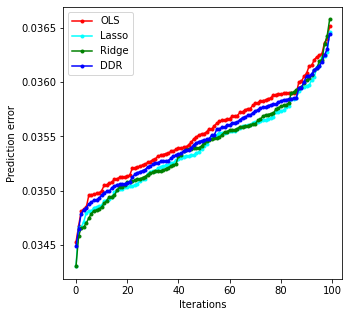

In [105]:
fig = plt.figure(figsize = (5, 5))
iters = range(100)
plt.plot(iters, np.sort(all_pac_ols), color='red', marker = ".", label = 'OLS')
plt.plot(iters, np.sort(all_pac_lso), color='cyan', marker = ".", label = 'Lasso')
plt.plot(iters, np.sort(all_pac_rgi), color='green', marker = ".", label = 'Ridge')
plt.plot(iters, np.sort(all_pac_ddr), color='blue', marker = ".", label = 'DDR')
plt.legend()

plt.xlabel('Iterations')
plt.ylabel('Prediction error')

fig.savefig('413_prediction_accuracy.eps', format='eps', bbox_inches="tight")
fig.savefig('413_prediction_accuracy.pdf', format='pdf', bbox_inches="tight")

In [106]:
np.mean(all_pac_ols),np.mean(all_pac_ddr),np.mean(all_pac_lso),np.mean(all_pac_rgi)

(0.035530228226254394,
 0.035470290641072426,
 0.035406945096331806,
 0.03542023429288687)

In [107]:
(np.mean(all_pac_ddr) - np.mean(all_pac_ols))/np.mean(all_pac_ols)*100,\
(np.mean(all_pac_lso) - np.mean(all_pac_ols))/np.mean(all_pac_ols)*100,\
(np.mean(all_pac_rgi) - np.mean(all_pac_ols))/np.mean(all_pac_ols)*100

(-0.1686946247580774, -0.34698096825477365, -0.3095784599724211)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


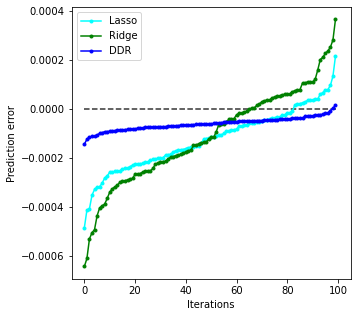

In [108]:
fig = plt.figure(figsize = (5, 5))
iters = range(100)
# plt.plot(iters, np.sort(all_pac_ols), color='red', marker = ".", label = 'OLS')
plt.plot(iters, np.sort(np.array(all_pac_lso) - np.array(all_pac_ols)), color='cyan', marker = ".", label = 'Lasso')
plt.plot(iters, np.sort(np.array(all_pac_rgi) - np.array(all_pac_ols)), color='green', marker = ".", label = 'Ridge')
plt.plot(iters, np.sort(np.array(all_pac_ddr) - np.array(all_pac_ols)), color='blue', marker = ".", label = 'DDR')
plt.legend()

plt.hlines(0, 0, 100, linestyle="dashed", alpha = 0.8,color = 'k') #pio

plt.xlabel('Iterations')
plt.ylabel('Prediction error')

fig.savefig('413_prediction_accuracy_gap.eps', format='eps', bbox_inches="tight")
fig.savefig('413_prediction_accuracy_gap.pdf', format='pdf', bbox_inches="tight")

<a id='Part_4.1.4'></a>
### 4.1.4 Effects of d, p, N, alpha--LASSO and Ridge
[Go back to top](#Top)

In [26]:
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

def each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower,upper, alpha, W_star, n_epsilon, 
                         mis, thres, mu, lamb, vs = [0,1]):
    Data = {}
    all_h2h_lsools = []
#     all_mci_lsools = []
    all_pio_lsools = []

    all_h2h_lsoddr = []
#     all_mci_lsoddr = []
    all_pio_lsoddr = []

    all_h2h_rgiols = []
#     all_mci_rgiols = []
    all_pio_rgiols = []

    all_h2h_rgiddr = []
#     all_mci_rgiddr = []
    all_pio_rgiddr = []
    for i in range(iters):
        W_star = generate_truth(lower, upper, p, d, version = vs[0]) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
        # 0 mis out; 1 mis in, X N(0,1); epsilon U[-alpha, alpha]; 2 n epsilon; 3 spo+; 4 sparse X; 
        #5 X U[0,1], epsilon U[-alpha, alpha]; 6 X N(0,1), epsilon N(0,1)
        Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                version = vs[1], x_dist = 'uniform', e_dist = 'normal', x_low = -2, x_up = 2, x_mean = 2,
                x_var = 0.25, bump = 7) 
#                 print(Data[i][0])

        h2h_lsools, mci_lsools, h2h_rgiols, mci_rgiols, h2h_lsoddr, mci_lsoddr, h2h_rgiddr,\
        mci_rgiddr, pio_lsools, pio_rgiols, pio_lsoddr, pio_rgiddr, pac_ols, pac_lso, pac_rgi, pac_ddr\
        = each_iter_vs_lasso_ridge(Data[i], mis, thres, mu, lamb, ypio = 1)

        all_h2h_lsools.append(h2h_lsools*100)
        all_pio_lsools.append(pio_lsools*100)

        all_h2h_rgiols.append(h2h_rgiols*100)
        all_pio_rgiols.append(pio_rgiols*100)

        all_h2h_lsoddr.append(h2h_lsoddr*100)
        all_pio_lsoddr.append(pio_lsoddr*100)

        all_h2h_rgiddr.append(h2h_rgiddr*100)
        all_pio_rgiddr.append(pio_rgiddr*100)
        
        h2h_lsools_pct = np.round( sum(n >= 50 for n in all_h2h_lsools)/len(all_h2h_lsools),4 )
        pio_lsools_pct = np.round( sum(n >= 0 and n <= 100 for n in all_pio_lsools)/len(all_pio_lsools),4 )
        
        h2h_rgiols_pct = np.round( sum(n >= 50 for n in all_h2h_rgiols)/len(all_h2h_rgiols),4 )
        pio_rgiols_pct = np.round( sum(n >= 0 and n <= 100 for n in all_pio_rgiols)/len(all_pio_rgiols),4 )
        
        h2h_lsoddr_pct = np.round( sum(n >= 50 for n in all_h2h_lsoddr)/len(all_h2h_lsoddr),4 )
        pio_lsoddr_pct = np.round( sum(n >= 0 and n <= 100 for n in all_pio_lsoddr)/len(all_pio_lsoddr),4 )
        
        h2h_rgiddr_pct = np.round( sum(n >= 50 for n in all_h2h_rgiddr)/len(all_h2h_rgiddr),4 )
        pio_rgiddr_pct = np.round( sum(n >= 0 and n <= 100 for n in all_pio_rgiddr)/len(all_pio_rgiddr),4 )

    Results_all = [all_h2h_lsools, all_pio_lsools, all_h2h_rgiols, all_pio_rgiols, 
                            all_h2h_lsoddr, all_pio_lsoddr, all_h2h_rgiddr, all_pio_rgiddr]
                
    return h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct, h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all

In [40]:
start = time.time()
random.seed(seed)
mis = 1
thres = 1000000
iters = 100
samples_test = 10000
n_epsilon = 1
lower = 0
upper = 1


p = 4
d = 10
samples_train = 100
alpha = 1

mu = 0.25
lamb = 0.25


p_range = [4 + 2*i for i in range(4)]
d_range = [5, 10, 25, 50]
N_range = [50,100,200,500,1000]
alpha_range = [0.25, 1, 2.25, 4]

Results_all_p = {}
Results_all_d = {}
Results_all_N = {}
Results_all_alpha = {}
Results_p = {}
Results_d = {}
Results_N = {}
Results_alpha = {}
##### p
for p in p_range:
    start = time.time()
    
    h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
    h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all\
    =each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower, upper, \
                          alpha, W_star, n_epsilon, mis, thres, mu, lamb, vs = [0,1])
    
    end = time.time()
    Results_p[p] = [h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
                    h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct]
    Results_all_p[p] = Results_all
    
string = '414Against_lsorgi_p.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_p, f)

p = 4

##### d
for d in d_range:
    start = time.time()
    if d == 10:
        Results_d[d] = Results_p[p]
        Results_all_d[d] = Results_all_p[p]
    else:
    
        h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all\
        =each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu, lamb, vs = [0,1])

        end = time.time()
        Results_d[d] = [h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
                        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct]
        Results_all_d[d] = Results_all
    end = time.time()
    
string = '414Against_lsorgi_d.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_d, f)
    
d = 10
##### N
for samples_train in N_range:
    start = time.time()
    if samples_train == 100:
        Results_N[samples_train] = Results_p[p]
        Results_all_N[samples_train] = Results_all_p[p]
    else:
    
        h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all\
        =each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu, lamb, vs = [0,1])

        end = time.time()
        Results_N[samples_train] = [h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
                        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct]
        Results_all_N[samples_train] = Results_all
    end = time.time()
    
string = '414Against_lsorgi_N.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
samples_train = 100

##### alpha
for alpha in alpha_range:
    start = time.time()
    if alpha == 1:
        Results_alpha[alpha] = Results_p[p]
        Results_all_alpha[alpha] = Results_all_p[p]
    else:
    
        h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all\
        =each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu, lamb, vs = [0,1])

        end = time.time()
        Results_alpha[alpha] = [h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
                        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct]
        Results_all_alpha[alpha] = Results_all
    end = time.time()
    
string = '414Against_lsorgi_alpha.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
alpha = 1

In [41]:
Results = [Results_p, Results_d, Results_N, Results_alpha]
Results_all = [Results_all_p, Results_all_d, Results_all_N, Results_all_alpha]

string = '414Aginst_lsorgi_all.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_all, f) 
    
string = '414Aginst_lsorgi.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results, f) 

In [42]:
Results

[{4: [0.09, 0.12, 0.1, 0.16, 0.21, 0.17, 0.17, 0.16],
  6: [0.28, 0.26, 0.29, 0.23, 0.26, 0.22, 0.27, 0.18],
  8: [0.4, 0.33, 0.36, 0.3, 0.26, 0.25, 0.21, 0.22],
  10: [0.44, 0.39, 0.4, 0.41, 0.34, 0.37, 0.34, 0.32]},
 {5: [0.18, 0.16, 0.22, 0.21, 0.31, 0.28, 0.28, 0.26],
  10: [0.09, 0.12, 0.1, 0.16, 0.21, 0.17, 0.17, 0.16],
  25: [0.1, 0.11, 0.1, 0.1, 0.15, 0.12, 0.13, 0.1],
  50: [0.07, 0.08, 0.08, 0.07, 0.15, 0.11, 0.13, 0.08]},
 {50: [0.23, 0.23, 0.18, 0.23, 0.25, 0.25, 0.19, 0.21],
  100: [0.09, 0.12, 0.1, 0.16, 0.21, 0.17, 0.17, 0.16],
  200: [0.22, 0.21, 0.1, 0.12, 0.28, 0.28, 0.27, 0.25],
  500: [0.44, 0.32, 0.31, 0.21, 0.47, 0.5, 0.46, 0.49],
  1000: [0.58, 0.54, 0.46, 0.36, 0.6, 0.55, 0.6, 0.55]},
 {0.25: [0.3, 0.29, 0.22, 0.17, 0.36, 0.36, 0.32, 0.31],
  1: [0.09, 0.12, 0.1, 0.16, 0.21, 0.17, 0.17, 0.16],
  2.25: [0.13, 0.13, 0.14, 0.16, 0.11, 0.1, 0.15, 0.13],
  4: [0.1, 0.11, 0.16, 0.16, 0.11, 0.12, 0.2, 0.2]}]

#### LSO-OLS

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


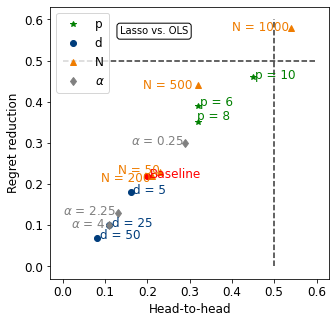

In [47]:
results = pickle.load( open( '414Aginst_lsorgi.pickle', "rb" ) )
p_range = [4 + 2*i for i in range(4)]
d_range = [5, 10, 25, 50]
N_range = [50,100,200,500,1000]
alpha_range = [0.25, 1, 2.25, 4]
Results_p = results[0]
Results_d = results[1]
Results_N = results[2]
Results_alpha = results[3]
mci_p = []
h2h_p = []
mci_d = []
h2h_d = []
mci_N = []
h2h_N = []
mci_alpha = []
h2h_alpha = []
for p in p_range:
    mci_p.append(Results_p[p][0])
    h2h_p.append(Results_p[p][1])
for d in d_range:
    mci_d.append(Results_d[d][0])
    h2h_d.append(Results_d[d][1])
for samples_train in N_range: 
    mci_N.append(Results_N[samples_train][0])
    h2h_N.append(Results_N[samples_train][1])
for alpha in alpha_range:
    mci_alpha.append(Results_alpha[alpha][0])
    h2h_alpha.append(Results_alpha[alpha][1])

fig = plt.figure(figsize = (5, 5))
plt.plot(h2h_p, mci_p, color='green', marker = "*", label = 'p', linestyle = 'None')
plt.text(h2h_p[0] + 0.005, mci_p[0] - 0.005, 'Baseline', color='red')
plt.text(h2h_p[1] + 0.005, mci_p[1] - 0.001, 'p = 6', color='green')
plt.text(h2h_p[2] - 0.003, mci_p[2] + 0.005, 'p = 8', color='green')
plt.text(h2h_p[3] + 0.005, mci_p[3] - 0.005, 'p = 10', color='green')

plt.plot(h2h_d[0], mci_d[0], color='#003D7C', marker = "o", label = 'd', linestyle = 'None')
# plt.plot(h2h_d[1], mci_d[1], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[2], mci_d[2], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[3], mci_d[3], color='#003D7C', marker = "o", linestyle = 'None')
plt.text(h2h_d[0] + 0.007, mci_d[0] - 0.003, 'd = 5', color='#003D7C')
# plt.text(h2h_d[1] + 0.007, mci_d[1] - 0.003, 'd = 15', color='#003D7C')
plt.text(h2h_d[2] + 0.007, mci_d[2] - 0.003, 'd = 25', color='#003D7C')
plt.text(h2h_d[3] + 0.007, mci_d[3] - 0.003, 'd = 50', color='#003D7C')


plt.plot(h2h_N[0], mci_N[0], color='#EF7C00', marker = "^", label = 'N',linestyle = 'None')
# plt.plot(h2h_N[1], mci_N[1], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[2], mci_N[2], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[3], mci_N[3], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[4], mci_N[4], color='#EF7C00', marker = "^",linestyle = 'None')
plt.text(h2h_N[0] - 0.10, mci_N[0] - 0.006, 'N = 50', color='#EF7C00')
# plt.text(h2h_N[1] + 0.005, mci_N[1] - 0.003, 'N = 100', color='#EF7C00')
plt.text(h2h_N[2] - 0.12, mci_N[2] - 0.014, 'N = 200', color='#EF7C00')
plt.text(h2h_N[3] - 0.13, mci_N[3] - 0.008, 'N = 500', color='#EF7C00')
plt.text(h2h_N[4] - 0.14, mci_N[4] - 0.008, 'N = 1000', color='#EF7C00')


plt.plot(h2h_alpha[0], mci_alpha[0], color='grey', marker = "d", label = r'$\alpha$',linestyle = 'None')
# plt.plot(h2h_alpha[1], mci_alpha[1], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[2], mci_alpha[2], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[3], mci_alpha[3], color='grey', marker = "d",linestyle = 'None')
plt.text(h2h_alpha[0] - 0.13, mci_alpha[0] - 0.005, r'$\alpha$ = 0.25', color='grey')
# plt.text(h2h_alpha[1] + 0.005, mci_alpha[1] - 0.005, r'$\alpha$ = 1', color='grey')
plt.text(h2h_alpha[2] - 0.13, mci_alpha[2] - 0.005, r'$\alpha$ = 2.25', color='grey')
plt.text(h2h_alpha[3] - 0.09, mci_alpha[3] - 0.005, r'$\alpha$ = 4', color='grey')

plt.vlines(0.5, 0.0, 0.6, linestyle="dashed", alpha = 0.8,color = 'k')
plt.hlines(0.5, 0.0, 0.6, linestyle="dashed", alpha = 0.8,color = 'k')
plt.legend()

plt.xlabel('Head-to-head')
plt.ylabel('Regret reduction')

plt.plot(h2h_p[0], mci_p[0], color='red', marker = "o", linestyle = 'None')
plt.annotate('Lasso vs. OLS', xy = (0.25,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)

fig.savefig('414_pattern_pdNalpha_lsools.eps', format='eps', bbox_inches="tight")
fig.savefig('414_pattern_pdNalpha_lsools.pdf', format='pdf', bbox_inches="tight")

#### RGI-OLS

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


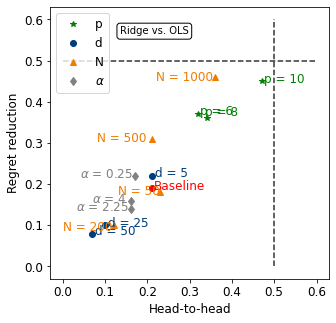

In [48]:
results = pickle.load( open( '414Aginst_lsorgi.pickle', "rb" ) )
Results_p = results[0]
Results_d = results[1]
Results_N = results[2]
Results_alpha = results[3]
mci_p = []
h2h_p = []
mci_d = []
h2h_d = []
mci_N = []
h2h_N = []
mci_alpha = []
h2h_alpha = []
for p in p_range:
    mci_p.append(Results_p[p][2])
    h2h_p.append(Results_p[p][3])
for d in d_range:
    mci_d.append(Results_d[d][2])
    h2h_d.append(Results_d[d][3])
for samples_train in N_range: 
    mci_N.append(Results_N[samples_train][2])
    h2h_N.append(Results_N[samples_train][3])
for alpha in alpha_range:
    mci_alpha.append(Results_alpha[alpha][2])
    h2h_alpha.append(Results_alpha[alpha][3])

fig = plt.figure(figsize = (5, 5))
plt.plot(h2h_p, mci_p, color='green', marker = "*", label = 'p', linestyle = 'None')
plt.text(h2h_p[0] + 0.005, mci_p[0] - 0.005, 'Baseline', color='red')
plt.text(h2h_p[1] + 0.005, mci_p[1] - 0.001, 'p = 6', color='green')
plt.text(h2h_p[2] - 0.003, mci_p[2] + 0.005, 'p = 8', color='green')
plt.text(h2h_p[3] + 0.005, mci_p[3] - 0.005, 'p = 10', color='green')

plt.plot(h2h_d[0], mci_d[0], color='#003D7C', marker = "o", label = 'd', linestyle = 'None')
# plt.plot(h2h_d[1], mci_d[1], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[2], mci_d[2], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[3], mci_d[3], color='#003D7C', marker = "o", linestyle = 'None')
plt.text(h2h_d[0] + 0.007, mci_d[0] - 0.003, 'd = 5', color='#003D7C')
# plt.text(h2h_d[1] + 0.007, mci_d[1] - 0.003, 'd = 15', color='#003D7C')
plt.text(h2h_d[2] + 0.007, mci_d[2] - 0.003, 'd = 25', color='#003D7C')
plt.text(h2h_d[3] + 0.007, mci_d[3] - 0.003, 'd = 50', color='#003D7C')


plt.plot(h2h_N[0], mci_N[0], color='#EF7C00', marker = "^", label = 'N',linestyle = 'None')
# plt.plot(h2h_N[1], mci_N[1], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[2], mci_N[2], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[3], mci_N[3], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[4], mci_N[4], color='#EF7C00', marker = "^",linestyle = 'None')
plt.text(h2h_N[0] - 0.10, mci_N[0] - 0.006, 'N = 50', color='#EF7C00')
# plt.text(h2h_N[1] + 0.005, mci_N[1] - 0.003, 'N = 100', color='#EF7C00')
plt.text(h2h_N[2] - 0.12, mci_N[2] - 0.014, 'N = 200', color='#EF7C00')
plt.text(h2h_N[3] - 0.13, mci_N[3] - 0.008, 'N = 500', color='#EF7C00')
plt.text(h2h_N[4] - 0.14, mci_N[4] - 0.008, 'N = 1000', color='#EF7C00')


plt.plot(h2h_alpha[0], mci_alpha[0], color='grey', marker = "d", label = r'$\alpha$',linestyle = 'None')
# plt.plot(h2h_alpha[1], mci_alpha[1], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[2], mci_alpha[2], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[3], mci_alpha[3], color='grey', marker = "d",linestyle = 'None')
plt.text(h2h_alpha[0] - 0.13, mci_alpha[0] - 0.005, r'$\alpha$ = 0.25', color='grey')
# plt.text(h2h_alpha[1] + 0.005, mci_alpha[1] - 0.005, r'$\alpha$ = 1', color='grey')
plt.text(h2h_alpha[2] - 0.13, mci_alpha[2] - 0.005, r'$\alpha$ = 2.25', color='grey')
plt.text(h2h_alpha[3] - 0.09, mci_alpha[3] - 0.005, r'$\alpha$ = 4', color='grey')

plt.vlines(0.5, 0.0, 0.6, linestyle="dashed", alpha = 0.8,color = 'k')
plt.hlines(0.5, 0.0, 0.6, linestyle="dashed", alpha = 0.8,color = 'k')
plt.legend(loc = 2)

plt.xlabel('Head-to-head')
plt.ylabel('Regret reduction')

plt.plot(h2h_p[0], mci_p[0], color='red', marker = "o", linestyle = 'None')
plt.annotate('Ridge vs. OLS', xy = (0.25,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)

fig.savefig('414_pattern_pdNalpha_rgiols.eps', format='eps', bbox_inches="tight")
fig.savefig('414_pattern_pdNalpha_rgiols.pdf', format='pdf', bbox_inches="tight")

#### LSO-DDR

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


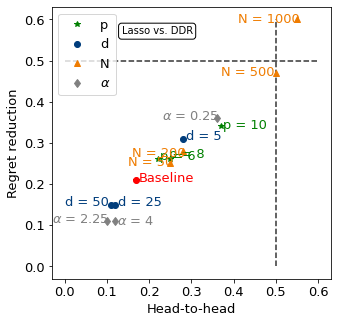

In [132]:
results = pickle.load( open( '414Aginst_lsorgi.pickle', "rb" ) )
Results_p = results[0]
Results_d = results[1]
Results_N = results[2]
Results_alpha = results[3]
mci_p = []
h2h_p = []
mci_d = []
h2h_d = []
mci_N = []
h2h_N = []
mci_alpha = []
h2h_alpha = []
for p in p_range:
    mci_p.append(Results_p[p][4])
    h2h_p.append(Results_p[p][5])
for d in d_range:
    mci_d.append(Results_d[d][4])
    h2h_d.append(Results_d[d][5])
for samples_train in N_range: 
    mci_N.append(Results_N[samples_train][4])
    h2h_N.append(Results_N[samples_train][5])
for alpha in alpha_range:
    mci_alpha.append(Results_alpha[alpha][4])
    h2h_alpha.append(Results_alpha[alpha][5])

fig = plt.figure(figsize = (5, 5))
plt.plot(h2h_p, mci_p, color='green', marker = "*", label = 'p', linestyle = 'None')
plt.text(h2h_p[0] + 0.005, mci_p[0] - 0.005, 'Baseline', color='red')
plt.text(h2h_p[1] + 0.005, mci_p[1] - 0.001, 'p = 6', color='green')
plt.text(h2h_p[2] - 0.003, mci_p[2] + 0.005, 'p = 8', color='green')
plt.text(h2h_p[3] + 0.005, mci_p[3] - 0.005, 'p = 10', color='green')

plt.plot(h2h_d[0], mci_d[0], color='#003D7C', marker = "o", label = 'd', linestyle = 'None')
# plt.plot(h2h_d[1], mci_d[1], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[2], mci_d[2], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[3], mci_d[3], color='#003D7C', marker = "o", linestyle = 'None')
plt.text(h2h_d[0] + 0.007, mci_d[0] - 0.003, 'd = 5', color='#003D7C')
# plt.text(h2h_d[1] + 0.007, mci_d[1] - 0.003, 'd = 15', color='#003D7C')
plt.text(h2h_d[2] + 0.007, mci_d[2] - 0.003, 'd = 25', color='#003D7C')
plt.text(h2h_d[3] - 0.11, mci_d[3] - 0.003, 'd = 50', color='#003D7C')


plt.plot(h2h_N[0], mci_N[0], color='#EF7C00', marker = "^", label = 'N',linestyle = 'None')
# plt.plot(h2h_N[1], mci_N[1], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[2], mci_N[2], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[3], mci_N[3], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[4], mci_N[4], color='#EF7C00', marker = "^",linestyle = 'None')
plt.text(h2h_N[0] - 0.10, mci_N[0] - 0.006, 'N = 50', color='#EF7C00')
# plt.text(h2h_N[1] + 0.005, mci_N[1] - 0.003, 'N = 100', color='#EF7C00')
plt.text(h2h_N[2] - 0.12, mci_N[2] - 0.014, 'N = 200', color='#EF7C00')
plt.text(h2h_N[3] - 0.13, mci_N[3] - 0.008, 'N = 500', color='#EF7C00')
plt.text(h2h_N[4] - 0.14, mci_N[4] - 0.008, 'N = 1000', color='#EF7C00')


plt.plot(h2h_alpha[0], mci_alpha[0], color='grey', marker = "d", label = r'$\alpha$',linestyle = 'None')
# plt.plot(h2h_alpha[1], mci_alpha[1], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[2], mci_alpha[2], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[3], mci_alpha[3], color='grey', marker = "d",linestyle = 'None')
plt.text(h2h_alpha[0] - 0.13, mci_alpha[0] - 0.005, r'$\alpha$ = 0.25', color='grey')
# plt.text(h2h_alpha[1] + 0.005, mci_alpha[1] - 0.005, r'$\alpha$ = 1', color='grey')
plt.text(h2h_alpha[2] - 0.13, mci_alpha[2] - 0.005, r'$\alpha$ = 2.25', color='grey')
plt.text(h2h_alpha[3] + 0.005, mci_alpha[3] - 0.01, r'$\alpha$ = 4', color='grey')

plt.vlines(0.5, 0.0, 0.6, linestyle="dashed", alpha = 0.8,color = 'k')
plt.hlines(0.5, 0.0, 0.6, linestyle="dashed", alpha = 0.8,color = 'k')
plt.legend()

plt.xlabel('Head-to-head')
plt.ylabel('Regret reduction')

plt.plot(h2h_p[0], mci_p[0], color='red', marker = "o", linestyle = 'None')
plt.annotate('Lasso vs. DDR', xy = (0.25,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)

fig.savefig('414_pattern_pdNalpha_lsoddr.eps', format='eps', bbox_inches="tight")
fig.savefig('414_pattern_pdNalpha_lsoddr.pdf', format='pdf', bbox_inches="tight")

#### RGI-DDR

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


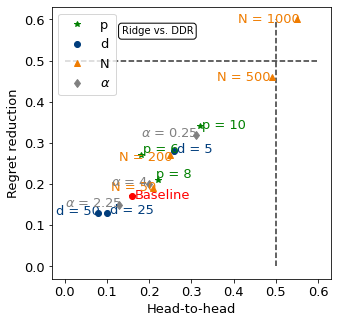

In [131]:
results = pickle.load( open( '414Aginst_lsorgi.pickle', "rb" ) )
Results_p = results[0]
Results_d = results[1]
Results_N = results[2]
Results_alpha = results[3]
mci_p = []
h2h_p = []
mci_d = []
h2h_d = []
mci_N = []
h2h_N = []
mci_alpha = []
h2h_alpha = []
for p in p_range:
    mci_p.append(Results_p[p][6])
    h2h_p.append(Results_p[p][7])
for d in d_range:
    mci_d.append(Results_d[d][6])
    h2h_d.append(Results_d[d][7])
for samples_train in N_range: 
    mci_N.append(Results_N[samples_train][6])
    h2h_N.append(Results_N[samples_train][7])
for alpha in alpha_range:
    mci_alpha.append(Results_alpha[alpha][6])
    h2h_alpha.append(Results_alpha[alpha][7])

fig = plt.figure(figsize = (5, 5))
plt.plot(h2h_p, mci_p, color='green', marker = "*", label = 'p', linestyle = 'None')
plt.text(h2h_p[0] + 0.005, mci_p[0] - 0.005, 'Baseline', color='red')
plt.text(h2h_p[1] + 0.005, mci_p[1] + 0.005, 'p = 6', color='green')
plt.text(h2h_p[2] - 0.003, mci_p[2] + 0.005, 'p = 8', color='green')
plt.text(h2h_p[3] + 0.005, mci_p[3] - 0.005, 'p = 10', color='green')

plt.plot(h2h_d[0], mci_d[0], color='#003D7C', marker = "o", label = 'd', linestyle = 'None')
# plt.plot(h2h_d[1], mci_d[1], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[2], mci_d[2], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[3], mci_d[3], color='#003D7C', marker = "o", linestyle = 'None')
plt.text(h2h_d[0] + 0.007, mci_d[0] - 0.003, 'd = 5', color='#003D7C')
# plt.text(h2h_d[1] + 0.007, mci_d[1] - 0.003, 'd = 15', color='#003D7C')
plt.text(h2h_d[2] + 0.007, mci_d[2] - 0.003, 'd = 25', color='#003D7C')
plt.text(h2h_d[3] - 0.10, mci_d[3] - 0.005, 'd = 50', color='#003D7C')


plt.plot(h2h_N[0], mci_N[0], color='#EF7C00', marker = "^", label = 'N',linestyle = 'None')
# plt.plot(h2h_N[1], mci_N[1], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[2], mci_N[2], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[3], mci_N[3], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[4], mci_N[4], color='#EF7C00', marker = "^",linestyle = 'None')
plt.text(h2h_N[0] - 0.10, mci_N[0] - 0.006, 'N = 50', color='#EF7C00')
# plt.text(h2h_N[1] + 0.005, mci_N[1] - 0.003, 'N = 100', color='#EF7C00')
plt.text(h2h_N[2] - 0.12, mci_N[2] - 0.014, 'N = 200', color='#EF7C00')
plt.text(h2h_N[3] - 0.13, mci_N[3] - 0.008, 'N = 500', color='#EF7C00')
plt.text(h2h_N[4] - 0.14, mci_N[4] - 0.008, 'N = 1000', color='#EF7C00')


plt.plot(h2h_alpha[0], mci_alpha[0], color='grey', marker = "d", label = r'$\alpha$',linestyle = 'None')
# plt.plot(h2h_alpha[1], mci_alpha[1], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[2], mci_alpha[2], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[3], mci_alpha[3], color='grey', marker = "d",linestyle = 'None')
plt.text(h2h_alpha[0] - 0.13, mci_alpha[0] - 0.005, r'$\alpha$ = 0.25', color='grey')
# plt.text(h2h_alpha[1] + 0.005, mci_alpha[1] - 0.005, r'$\alpha$ = 1', color='grey')
plt.text(h2h_alpha[2] - 0.13, mci_alpha[2] - 0.005, r'$\alpha$ = 2.25', color='grey')
plt.text(h2h_alpha[3] - 0.09, mci_alpha[3] - 0.005, r'$\alpha$ = 4', color='grey')

plt.vlines(0.5, 0.0, 0.6, linestyle="dashed", alpha = 0.8,color = 'k')
plt.hlines(0.5, 0.0, 0.6, linestyle="dashed", alpha = 0.8,color = 'k')
plt.legend()

plt.xlabel('Head-to-head')
plt.ylabel('Regret reduction')

plt.plot(h2h_p[0], mci_p[0], color='red', marker = "o", linestyle = 'None')
plt.annotate('Ridge vs. DDR', xy = (0.25,0.9), xycoords = 'axes fraction', bbox=dict(boxstyle="round", fc="w"), size = 10)
fig.savefig('414_pattern_pdNalpha_rgiddr.eps', format='eps', bbox_inches="tight")
fig.savefig('414_pattern_pdNalpha_rgiddr.pdf', format='pdf', bbox_inches="tight")

#### Patterns-binary W

In [57]:
start = time.time()
random.seed(seed)
mis = 1
thres = 1000000
iters = 100
samples_test = 10000
n_epsilon = 1
lower = 0
upper = 1


p = 4
d = 10
samples_train = 100
alpha = 1

mu = 0.25
lamb = 0.25


p_range = [4 + 2*i for i in range(4)]
d_range = [5, 10, 25, 50]
N_range = [50,100,200,500,1000]
alpha_range = [0.25, 1, 2.25, 4]

Results_all_p = {}
Results_all_d = {}
Results_all_N = {}
Results_all_alpha = {}
Results_p = {}
Results_d = {}
Results_N = {}
Results_alpha = {}
##### p
for p in p_range:
    start = time.time()
    
    h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
    h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all\
    =each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower, upper, \
                          alpha, W_star, n_epsilon, mis, thres, mu, lamb, vs = [1,1])
    
    end = time.time()
    Results_p[p] = [h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
                    h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct]
    Results_all_p[p] = Results_all
    
string = '414Against_lsorgi_p_binaryW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_p, f)

p = 4

##### d
for d in d_range:
    start = time.time()
    if d == 10:
        Results_d[d] = Results_p[p]
        Results_all_d[d] = Results_all_p[p]
    else:
    
        h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all\
        =each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu, lamb, vs = [0,1])

        end = time.time()
        Results_d[d] = [h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
                        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct]
        Results_all_d[d] = Results_all
    end = time.time()
    
string = '414Against_lsorgi_d_binaryW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_d, f)
    
d = 10
##### N
for samples_train in N_range:
    start = time.time()
    if samples_train == 100:
        Results_N[samples_train] = Results_p[p]
        Results_all_N[samples_train] = Results_all_p[p]
    else:
    
        h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all\
        =each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu, lamb, vs = [0,1])

        end = time.time()
        Results_N[samples_train] = [h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
                        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct]
        Results_all_N[samples_train] = Results_all
    end = time.time()
    
string = '414Against_lsorgi_N_binaryW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
samples_train = 100

##### alpha
for alpha in alpha_range:
    start = time.time()
    if alpha == 1:
        Results_alpha[alpha] = Results_p[p]
        Results_all_alpha[alpha] = Results_all_p[p]
    else:
    
        h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct, Results_all\
        =each_para_ddr_ols_vs_lasso_ridge(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu, lamb, vs = [0,1])

        end = time.time()
        Results_alpha[alpha] = [h2h_lsools_pct, pio_lsools_pct, h2h_rgiols_pct, pio_rgiols_pct,\
                        h2h_lsoddr_pct, pio_lsoddr_pct, h2h_rgiddr_pct, pio_rgiddr_pct]
        Results_all_alpha[alpha] = Results_all
    end = time.time()
    
string = '414Against_lsorgi_alpha_binaryW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
alpha = 1

In [59]:
Results = [Results_p, Results_d, Results_N, Results_alpha]
Results_all = [Results_all_p, Results_all_d, Results_all_N, Results_all_alpha]

string = '414Aginst_lsorgi_all.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_all, f) 
    
string = '414Aginst_lsorgi.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results, f) 

In [60]:
Results

[{4: [0.22, 0.2, 0.19, 0.21, 0.32, 0.27, 0.25, 0.23],
  6: [0.39, 0.32, 0.37, 0.32, 0.33, 0.25, 0.35, 0.29],
  8: [0.35, 0.32, 0.36, 0.34, 0.24, 0.23, 0.29, 0.25],
  10: [0.46, 0.45, 0.45, 0.47, 0.39, 0.34, 0.39, 0.38]},
 {5: [0.18, 0.16, 0.22, 0.21, 0.31, 0.28, 0.28, 0.26],
  10: [0.22, 0.2, 0.19, 0.21, 0.32, 0.27, 0.25, 0.23],
  25: [0.1, 0.11, 0.1, 0.1, 0.15, 0.12, 0.13, 0.1],
  50: [0.07, 0.08, 0.08, 0.07, 0.15, 0.11, 0.13, 0.08]},
 {50: [0.23, 0.23, 0.18, 0.23, 0.25, 0.25, 0.19, 0.21],
  100: [0.22, 0.2, 0.19, 0.21, 0.32, 0.27, 0.25, 0.23],
  200: [0.22, 0.21, 0.1, 0.12, 0.28, 0.28, 0.27, 0.25],
  500: [0.44, 0.32, 0.31, 0.21, 0.47, 0.5, 0.46, 0.49],
  1000: [0.58, 0.54, 0.46, 0.36, 0.6, 0.55, 0.6, 0.55]},
 {0.25: [0.3, 0.29, 0.22, 0.17, 0.36, 0.36, 0.32, 0.31],
  1: [0.22, 0.2, 0.19, 0.21, 0.32, 0.27, 0.25, 0.23],
  2.25: [0.13, 0.13, 0.14, 0.16, 0.11, 0.1, 0.15, 0.13],
  4: [0.1, 0.11, 0.16, 0.16, 0.11, 0.12, 0.2, 0.2]}]

In [ ]:
[{4: [0.09, 0.12, 0.1, 0.16, 0.21, 0.17, 0.17, 0.16],
  6: [0.28, 0.26, 0.29, 0.23, 0.26, 0.22, 0.27, 0.18],
  8: [0.4, 0.33, 0.36, 0.3, 0.26, 0.25, 0.21, 0.22],
  10: [0.44, 0.39, 0.4, 0.41, 0.34, 0.37, 0.34, 0.32]},
 {5: [0.18, 0.16, 0.22, 0.21, 0.31, 0.28, 0.28, 0.26],
  10: [0.09, 0.12, 0.1, 0.16, 0.21, 0.17, 0.17, 0.16],
  25: [0.1, 0.11, 0.1, 0.1, 0.15, 0.12, 0.13, 0.1],
  50: [0.07, 0.08, 0.08, 0.07, 0.15, 0.11, 0.13, 0.08]},
 {50: [0.23, 0.23, 0.18, 0.23, 0.25, 0.25, 0.19, 0.21],
  100: [0.09, 0.12, 0.1, 0.16, 0.21, 0.17, 0.17, 0.16],
  200: [0.22, 0.21, 0.1, 0.12, 0.28, 0.28, 0.27, 0.25],
  500: [0.44, 0.32, 0.31, 0.21, 0.47, 0.5, 0.46, 0.49],
  1000: [0.58, 0.54, 0.46, 0.36, 0.6, 0.55, 0.6, 0.55]},
 {0.25: [0.3, 0.29, 0.22, 0.17, 0.36, 0.36, 0.32, 0.31],
  1: [0.09, 0.12, 0.1, 0.16, 0.21, 0.17, 0.17, 0.16],
  2.25: [0.13, 0.13, 0.14, 0.16, 0.11, 0.1, 0.15, 0.13],
  4: [0.1, 0.11, 0.16, 0.16, 0.11, 0.12, 0.2, 0.2]}]

<a id='Sec_4.2'></a>
## Section 4.2: Comparing against OLS
[Go back to top](#Top)

In [27]:
def each_iter_ddr_vs_ols(data, mis, thres, mu, lamb, ypio = 0, yconstraint = 0, A = 0, b = 0, yB = 0, B = 0):
    x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data
    ## Solve and evaluate the OLS model
    W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)
    
    if yB == 0:
        z_test_ols, y_test_ols, c_test_ols = \
        param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres, yconstraint, A, b)
        c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)


        y_test_opt = decision_finder(z_test_ori)
        c_oracle = mean(np.sum(np.minimum(z_test_ori,thres) * y_test_opt, axis = 1))
    
        ## Solve and evaluate the DDR model
        # Obtain regression parameters
        W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb) #******
        z_test_ddr, y_test_ddr, c_test_ddr = \
        param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres, yconstraint, A, b)
        c_ddr_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
    else: 
        z_test_ols, y_test_ols, c_test_ols = \
        param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres, yconstraint, A, b, yB, B)
        c_ols_true =  np.sum( (np.array(B) @ (np.minimum(z_test_ori,thres)).T).T * y_test_ols, axis = 1 )


        y_test_opt = decision_finder(z_test_ori, yB = yB, B = B)
        c_oracle = mean( (np.array(B) @ (np.minimum(z_test_ori,thres)).T).T * y_test_opt, axis = 1 )
    
        ## Solve and evaluate the DDR model
        # Obtain regression parameters
        W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb, yB = yB, B = B) #******
        z_test_ddr, y_test_ddr, c_test_ddr = \
        param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres, yconstraint, A, b, yB, B)
        c_ddr_true =  np.sum( (np.array(B) @ (np.minimum(z_test_ori,thres)).T).T * y_test_ddr, axis = 1)
    
    if ypio == 0:
        lbels_ddrols, win_h2h_ddrols, mci_ddrols = cross_compare2(c_ddr_true, c_ols_true, c_oracle)
        return lbels_ddrols, win_h2h_ddrols, mci_ddrols
    else:
        lbels_ddrols, win_h2h_ddrols, mci_ddrols, pio_ddrols = cross_compare2plus(c_ddr_true, c_ols_true, c_oracle)
        return lbels_ddrols, win_h2h_ddrols, mci_ddrols, pio_ddrols


<a id='Part_4.2.1'></a>
### 4.2.1 Base case--Uniform W 
[Go back to top](#Top)

We will plot one figure in this subsection: DDR vs OLS

In [32]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 10000000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25

#0.25+0.23: 0.72, 0.72
#0.25+0.25: 0.72, 0.72
#-0.25+0.25: 0.65, 0.65

#0.27+0.25: 0.71, 0.73
#0.29+0.25: 0.72, 0.71

#0.30+0.23: 0.74,0.72
#0.30+0.25: 0.73,0.72
#0.30+0.27: 0.74,0.70
#0.30+0.29: 0.73,0.70

#0.31+0.25: 0.72, 0.73
#0.32+0.25: 0.70, 0.73

## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
    
    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp)
        
    lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = each_iter_ddr_vs_ols(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
results = [all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols, Data]
string = '421Base_UniformW.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
end = time.time()
print(end - start)

64.45813155174255


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


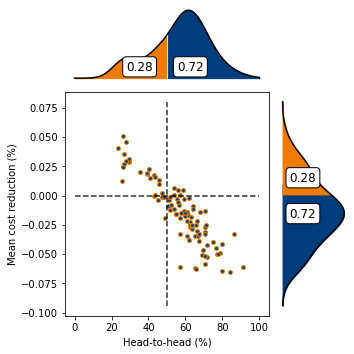

In [33]:
figure_plot_upright(all_h2h_ddrols, all_mci_ddrols, figure_name = '421Base_UniformW', size = (5, 5), move = [-0.1, 0.06, 0.30, 0.55])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


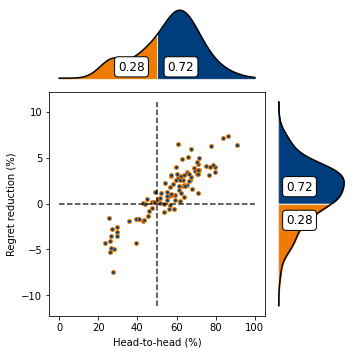

In [34]:
figure_plot_upright(all_h2h_ddrols, all_pio_ddrols, figure_name = '421Base_UniformW_pio', size = (5, 5), move = [-0.09, 0.06, 0.32, 0.55], ypio = 1)

In [35]:
mean(all_pio_ddrols), min(all_pio_ddrols), max(all_pio_ddrols)

(1.2506244198413228, -7.413122691515145, 7.405126575847085)

In [36]:
## sample_train = 25, mu = -0.1, lamb = 2, bump = 20, xl = -2, xu = 2, xm = 2, xv = 0.25, p = 4, d = 10, alpha = 4, lower = 0, upper = 3

## UniformW + normalX + normalE:  0.6,0.66
## UniformW + uniformX + normalE: 0.46,0.45
## UniformW + normal + uniformE:  0.55,0.54
## UniformW + uniformX + uniformE:  0.5,0.53

## binaryW + normalX + normalE:  0.58,0.57
## binaryW + uniformX + normalE: 0.66,0.68
## binaryW + normal + uniformE:  0.55,0.54
## binaryW + uniformX + uniformE:  0.63,0.66

## sample_train = 100, mu = -0.1, lamb = 2, bump = 10, xl = -2, xu = 2, xm = 2, xv = 0.25, p = 4, d = 15, , alpha = 4, lower = 0, upper = 3 
## binaryW + normalX + normalE:  0.8, 0.81
# binaryW + normalX + uniformE: 0.9, 0.92
# binaryW + uniformX + normalE: 0.74,0.78
# binaryW + uniformX + uniformE: 0.84,0.9

## uniformW + normalX + normalE:  0.47,0.55
# uniformW + normalX + uniformE: 0.62,0.62
# uniformW + uniformX + normalE: 0.48,0.5
# uniformW + uniformX + uniformE: 0.48,0.5


#### Calibrating $\lambda$ and $\mu$

In [37]:
print( min(all_mci_ddrols), argmin(all_mci_ddrols) )
print( max(all_pio_ddrols), argmax(all_pio_ddrols) )

-0.065058059457894 76
7.405126575847085 65


In [38]:
start = time.time()
random.seed(seed)
iters = 1
x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = Data[argmax(all_pio_ddrols)]
np.min(z_train)

1.2732158608288997

In [39]:
## Solve and evaluate the OLS model
W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)  
z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)
pac_ols = ( np.linalg.norm(z_test_ols - z_test) )**2/len(z_test) ## prediction accuracy

y_test_opt = decision_finder(z_test_ori)
c_oracle = mean(np.sum(z_test_ori * y_test_opt, axis = 1))
## Solve and evaluate the DDR model
c_ddr_true_all = {}
pac_ddr_all = {}
pac_ddr_true_all = {}

mu_range = [-0.25 + i*0.05 for i in range(13)]
lamb_range = [0 + i*0.05 for i in range(81)]
for mu in mu_range:
    for lamb in lamb_range:
        # Obtain regression parameters
        W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb)
        z_test_ddr, y_test_ddr, c_test_ddr = param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres)
        c_ddr_true_all[mu,lamb] =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
        # obtain prediction accuracy
        pac_ddr_all[mu,lamb] = ( np.linalg.norm(z_test_ddr - z_test) )**2/len(z_test) ## prediction accuracy
        pac_ddr_true_all[mu,lamb] = ( np.linalg.norm(z_test_ddr - z_test_ori) )**2/len(z_test_ori) ## prediction accuracy
        
        
lamb_final = {}
for mu in mu_range:
    all_c_ddr_true = [(np.mean(c_ddr_true_all[mu, lamb])) for lamb in lamb_range]
    index = np.argmin(all_c_ddr_true)
    lamb_final_t = lamb_range[index]
    lamb_final[mu] = lamb_final_t

plotter = {}
regret = {}
pac = {}
pac_true = {}
#head_to_head
hth = {}
#mean cost improvement
mci = {}
pio = {}
lamb_min_ind = []
lamb_opt = []    
lamb_range_cut = lamb_range    
for mu in mu_range:
    plotter[mu] = [mean(c_ddr_true_all[mu,lambnow]) for lambnow in lamb_range_cut]
    pac[mu] = [mean(pac_ddr_all[mu,lambnow]) for lambnow in lamb_range_cut]
    pac_true[mu] = [mean(pac_ddr_true_all[mu,lambnow]) for lambnow in lamb_range_cut]
    regret[mu] = [mean(c_ddr_true_all[mu,lambnow]) - c_oracle for lambnow in lamb_range_cut]
    hth[mu] = [head_2_head(c_ddr_true_all[mu,lambnow], c_ols_true) for lambnow in lamb_range_cut]
    mci[mu] = [(mean(c_ddr_true_all[mu,lambnow]) - mean(c_ols_true)) / c_oracle for lambnow in lamb_range_cut]
    pio[mu] = [( mean(c_ols_true) - mean(c_ddr_true_all[mu,lambnow]) ) / ( mean(c_ols_true) - c_oracle )*100 for lambnow in lamb_range_cut]
    index = np.argmin(plotter[mu])
    lamb_min_ind.append(index)
    lamb_opt.append(lamb_range[index])
    
results = [plotter, regret, hth, mci, pio, mu_range, lamb_range, lamb_opt, lamb_final, lamb_min_ind, c_ols_true, c_oracle, pac, pac_true, Data[argmax(all_pio_ddrols)]]
string = '421cross_validata.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)

In [40]:
for mu in mu_range:
    print(mu, np.min(plotter[mu]), np.argmin(plotter[mu]), lamb_range[np.argmin(plotter[mu])])

-0.25 6.032845241486338 6 0.30000000000000004
-0.2 6.0326991814505035 8 0.4
-0.15 6.031024900633108 7 0.35000000000000003
-0.09999999999999998 6.029753589447198 8 0.4
-0.04999999999999999 6.02852113650472 15 0.75
0.0 6.027578690754454 17 0.8500000000000001
0.050000000000000044 6.026116571130095 36 1.8
0.10000000000000003 6.023627810352412 42 2.1
0.15000000000000002 6.023033118079796 31 1.55
0.2 6.023247347740314 51 2.5500000000000003
0.25 6.025262637189105 50 2.5
0.30000000000000004 6.025159774820754 61 3.0500000000000003
0.3500000000000001 6.025670843403673 55 2.75


In [41]:
for mu in mu_range:
    print(mu, np.max(pio[mu]), np.argmax(pio[mu]), lamb_range[np.argmax(pio[mu])])

-0.25 2.1858480059467844 6 0.30000000000000004
-0.2 2.728911182102237 8 0.4
-0.15 8.954024391741195 7 0.35000000000000003
-0.09999999999999998 13.680863506628027 8 0.4
-0.04999999999999999 18.26322448978345 15 0.75
0.0 21.767314979500043 17 0.8500000000000001
0.050000000000000044 27.203595496543254 36 1.8
0.10000000000000003 36.45701190782778 42 2.1
0.15000000000000002 38.66812648518662 31 1.55
0.2 37.87160306107767 51 2.5500000000000003
0.25 30.37859182988743 50 2.5
0.30000000000000004 30.761042540272225 61 3.0500000000000003
0.3500000000000001 28.860847690335845 55 2.75


In [42]:
plotter[0][0], pio[0][0]

(6.0334331381659405, 0.0)

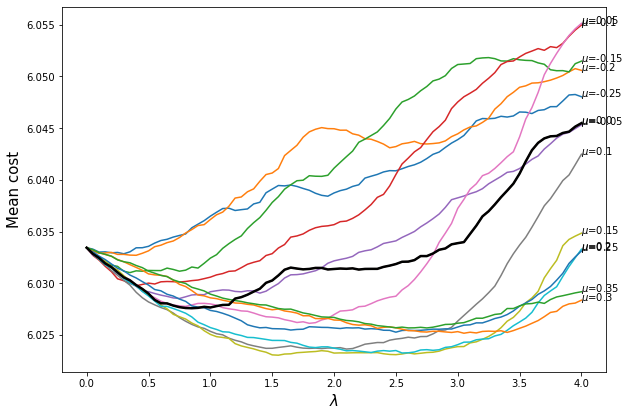

In [43]:
lamb_range_cut = lamb_range
plt.figure(figsize=(9,6))
for mu in mu_range:
    plt.plot(lamb_range_cut, plotter[mu])
    plt.text(lamb_range_cut[len(lamb_range_cut)-1], plotter[mu][len(lamb_range_cut)-1], '$\mu$='+ str(np.round(mu, decimals = 3)))
    
plt.plot(lamb_range_cut, plotter[mu_range[5]], linewidth=2.5, color = 'black')

plt.xlabel('$\lambda$', fontsize=15)
plt.ylabel('Mean cost', fontsize=15)

plt.rcParams.update({'font.size': 15})

####### Bring the marginals closer to the scatter plot and save eps file
plt.tight_layout(pad = 1)
plt.savefig('421baseline_calibration.eps', format='eps')
plt.savefig('421baseline_calibration.pdf', format='pdf')

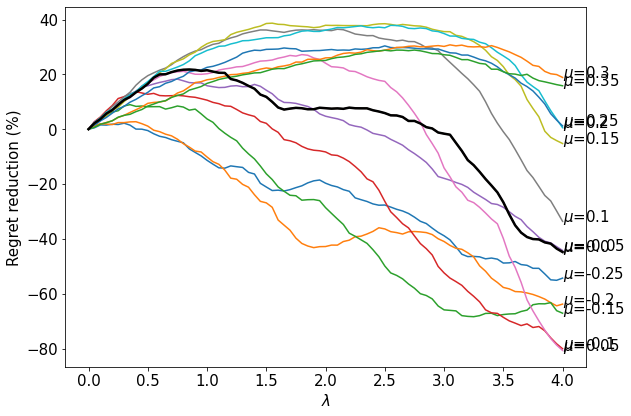

In [44]:
lamb_range_cut = lamb_range
plt.figure(figsize=(9,6))
for mu in mu_range:
    plt.plot(lamb_range_cut, pio[mu])
    plt.text(lamb_range_cut[len(lamb_range_cut)-1], pio[mu][len(lamb_range_cut)-1], '$\mu$='+ str(np.round(mu, decimals = 3)))
    
plt.plot(lamb_range_cut, pio[mu_range[5]], linewidth=2.5, color = 'black')

plt.xlabel('$\lambda$', fontsize=15)
plt.ylabel('Regret reduction (%)', fontsize=15)

plt.rcParams.update({'font.size': 15})

####### Bring the marginals closer to the scatter plot and save eps file
plt.tight_layout(pad = 1)
plt.savefig('421baseline_calibration_pio.eps', format='eps')
plt.savefig('421baseline_calibration_pio.pdf', format='pdf')

In [71]:
results = pickle.load( open( '421cross_validata.pickle', "rb" ) )
plotter, regret, hth, mci, pio, mu_range, lamb_range, lamb_opt, lamb_final, lamb_min_ind, c_ols_true, c_oracle, pac, pac_true, data = results
lamb_range_cut = lamb_range

mu_range = [mu_range[8]]
print(len(lamb_range))

81


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


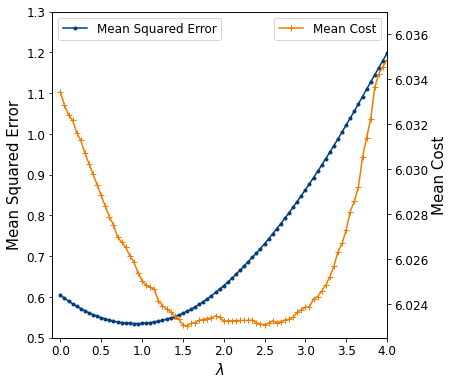

In [85]:
results = pickle.load( open( '421cross_validata.pickle', "rb" ) )
plotter, regret, hth, mci, pio, mu_range, lamb_range, lamb_opt, lamb_final, lamb_min_ind, c_ols_true, c_oracle, pac, pac_true, data = results
lamb_range_cut = lamb_range

mu_range = [mu_range[8]]
print(len(lamb_range))
for mu in mu_range:
    fig,ax = plt.subplots(figsize=(6,6))
    ax.plot(lamb_range_cut, pac_true[mu], marker=".", label='Mean Squared Error', color='#003D7C')
    ax.set_xlabel('$\lambda$', fontsize=15)
    ax.set_ylabel('Mean Squared Error', fontsize=15) #, color='#003D7C'
    ax.set_ylim(0.50, 1.3)
    ax.legend(loc = 2)
    
    ax2=ax.twinx()
    ax2.plot(lamb_range_cut, plotter[mu], color='#EF7C00', marker="+", label='Mean Cost')
    ax2.set_ylabel("Mean Cost",fontsize=15)#, color='#EF7C00'
    ax2.set_ylim(6.0225, 6.037)
    ax2.legend(loc = 1)
#     plt.show()

plt.rcParams.update({'font.size': 12})


plt.xlim(-0.1, 4)
fig.savefig('Prediction_accuracy.eps', format='eps', bbox_inches="tight")
fig.savefig('Prediction_accuracy.pdf', format='pdf', bbox_inches="tight")

<a id='Part_4.2.2'></a>
### 4.2.2 Effects of d, p, N, alpha--Uniform W
[Go back to top](#Top)

We will plot one figure in this subsection: DDR vs OLS

In [27]:
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

def each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower,upper, alpha, W_star, n_epsilon, 
                         mis, thres, mu_all, lamb_all, vs = [0,1]):
    mci_pct_final = 0
    h2h_pct_final = 0
    pio_pct_final = 0
    Results_all = {}
    for mu in mu_all:
        for lamb in lamb_all:
            Data = {}
            all_h2h_ddrols = []
            all_mci_ddrols = []
            all_pio_ddrols = []
            for i in range(iters):
                W_star = generate_truth(lower, upper, p, d, version = vs[0]) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
                # 0 mis out; 1 mis in, X N(0,1); epsilon U[-alpha, alpha]; 2 n epsilon; 3 spo+; 4 sparse X; 
                #5 X U[0,1], epsilon U[-alpha, alpha]; 6 X N(0,1), epsilon N(0,1)
                Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = vs[1], x_dist = 'uniform', e_dist = 'normal', x_low = -2, x_up = 2, x_mean = 2,
                        x_var = 0.25, bump = 7) 
#                 print(Data[i][0])
                
                lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = each_iter_ddr_vs_ols(Data[i], mis, thres, mu, lamb, ypio = 1)
                all_h2h_ddrols.append(h2h_ddrols*100)
                all_mci_ddrols.append(mci_ddrols*100)
                all_pio_ddrols.append(pio_ddrols*100)
                
            Results_all[mu,lamb] = [all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols]
            
            mci_pct = np.round( sum(n <= 0 for n in all_mci_ddrols)/len(all_mci_ddrols),4 )
            h2h_pct = np.round( sum(n >= 50 for n in all_h2h_ddrols)/len(all_h2h_ddrols),4 )
            pio_pct = np.round( sum(n >= 0 for n in all_pio_ddrols)/len(all_pio_ddrols),4 )
    
            if mci_pct >= mci_pct_final and h2h_pct >= h2h_pct_final:
                mci_pct_final = mci_pct
                h2h_pct_final = h2h_pct
                pio_pct_final = pio_pct
                mu_final = mu
                lamb_final = lamb
                
    return mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all

In [28]:
start = time.time()
random.seed(seed)
mis = 1
thres = 1000000
iters = 100
samples_test = 10000
n_epsilon = 1
lower = 0
upper = 1


p = 4
d = 10
samples_train = 100
alpha = 1

mu_all = [0.25]#[-0.2 + 0.05*i for i in range(6)]
lamb_all = [0.25]#[0.1 + 0.1*i for i in range(10)]


p_range = [4 + 2*i for i in range(4)]
d_range = [5, 10, 25, 50]
N_range = [50,100,200,500,1000]
alpha_range = [0.25, 1, 2.25, 4]

Results_all_p = {}
Results_all_d = {}
Results_all_N = {}
Results_all_alpha = {}
Results_p = {}
Results_d = {}
Results_N = {}
Results_alpha = {}
##### p
for p in p_range:
    start = time.time()
    
    mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
    =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                          alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [0,1])
    
    end = time.time()
    Results_p[p] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
    Results_all_p[p] = Results_all
    
string = '422Against_ols_p.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_p, f)

p = 4

##### d
for d in d_range:
    start = time.time()
    if d == 10:
        Results_d[d] = Results_p[p]
        Results_all_d[d] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [0,1])

        Results_d[d] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_d[d] = Results_all
    end = time.time()
    
string = '422Against_ols_d.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_d, f)
    
d = 10
##### N
for samples_train in N_range:
    start = time.time()
    if samples_train == 100:
        Results_N[samples_train] = Results_p[p]
        Results_all_N[samples_train] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [0,1])

        Results_N[samples_train] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_N[samples_train] = Results_all
    end = time.time()
    
string = '422Against_ols_N.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
samples_train = 100

##### alpha
for alpha in alpha_range:
    start = time.time()
    if alpha == 1:
        Results_alpha[alpha] = Results_p[p]
        Results_all_alpha[alpha] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [0,1])

        Results_alpha[alpha] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_alpha[alpha] = Results_all
    end = time.time()
    
string = '422Against_ols_alpha.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
alpha = 1

In [29]:
Results = [Results_p, Results_d, Results_N, Results_alpha]
Results_all = [Results_all_p, Results_all_d, Results_all_N, Results_all_alpha]

string = '422Aginst_ols_all.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_all, f) 
    
string = '422Aginst_ols.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results, f) 

In [30]:
Results

[{4: [0.72, 0.72, 0.25, 0.25],
  6: [0.69, 0.71, 0.25, 0.25],
  8: [0.72, 0.71, 0.25, 0.25],
  10: [0.66, 0.63, 0.25, 0.25]},
 {5: [0.58, 0.57, 0.25, 0.25],
  10: [0.72, 0.72, 0.25, 0.25],
  25: [0.67, 0.7, 0.25, 0.25],
  50: [0.72, 0.64, 0.25, 0.25]},
 {50: [0.67, 0.66, 0.25, 0.25],
  100: [0.72, 0.72, 0.25, 0.25],
  200: [0.64, 0.62, 0.25, 0.25],
  500: [0.6, 0.51, 0.25, 0.25],
  1000: [0.53, 0.5, 0.25, 0.25]},
 {0.25: [0.6, 0.59, 0.25, 0.25],
  1: [0.72, 0.72, 0.25, 0.25],
  2.25: [0.77, 0.74, 0.25, 0.25],
  4: [0.74, 0.78, 0.25, 0.25]}]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


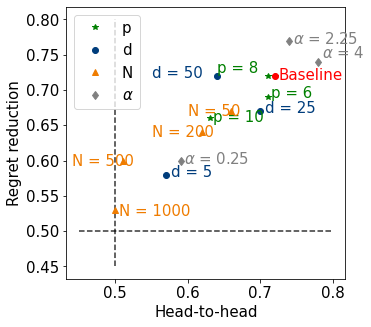

In [64]:
results = pickle.load( open( '422Aginst_ols.pickle', "rb" ) )
p_range = [4 + 2*i for i in range(4)]
d_range = [5, 10, 25, 50]
N_range = [50,100,200,500,1000]
alpha_range = [0.25, 1, 2.25, 4]
Results_p = results[0]
Results_d = results[1]
Results_N = results[2]
Results_alpha = results[3]
mci_p = []
h2h_p = []
mci_d = []
h2h_d = []
mci_N = []
h2h_N = []
mci_alpha = []
h2h_alpha = []
for p in p_range:
    mci_p.append(Results_p[p][0])
    h2h_p.append(Results_p[p][1])
for d in d_range:
    mci_d.append(Results_d[d][0])
    h2h_d.append(Results_d[d][1])
for samples_train in N_range: 
    mci_N.append(Results_N[samples_train][0])
    h2h_N.append(Results_N[samples_train][1])
for alpha in alpha_range:
    mci_alpha.append(Results_alpha[alpha][0])
    h2h_alpha.append(Results_alpha[alpha][1])

fig = plt.figure(figsize = (5, 5))
plt.plot(h2h_p, mci_p, color='green', marker = "*", label = 'p', linestyle = 'None')
plt.text(h2h_p[0] + 0.005, mci_p[0] - 0.005, 'Baseline', color='red')
plt.text(h2h_p[1] + 0.005, mci_p[1] - 0.001, 'p = 6', color='green')
plt.text(h2h_p[2] - 0.07, mci_p[2] + 0.005, 'p = 8', color='green')
plt.text(h2h_p[3] + 0.005, mci_p[3] - 0.005, 'p = 10', color='green')

plt.plot(h2h_d[0], mci_d[0], color='#003D7C', marker = "o", label = 'd', linestyle = 'None')
# plt.plot(h2h_d[1], mci_d[1], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[2], mci_d[2], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[3], mci_d[3], color='#003D7C', marker = "o", linestyle = 'None')
plt.text(h2h_d[0] + 0.007, mci_d[0] - 0.003, 'd = 5', color='#003D7C')
# plt.text(h2h_d[1] + 0.007, mci_d[1] - 0.003, 'd = 15', color='#003D7C')
plt.text(h2h_d[2] + 0.007, mci_d[2] - 0.003, 'd = 25', color='#003D7C')
plt.text(h2h_d[3] - 0.09, mci_d[3] - 0.003, 'd = 50', color='#003D7C')


plt.plot(h2h_N[0], mci_N[0], color='#EF7C00', marker = "^", label = 'N',linestyle = 'None')
# plt.plot(h2h_N[1], mci_N[1], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[2], mci_N[2], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[3], mci_N[3], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[4], mci_N[4], color='#EF7C00', marker = "^",linestyle = 'None')
plt.text(h2h_N[0] - 0.06, mci_N[0] - 0.006, 'N = 50', color='#EF7C00')
# plt.text(h2h_N[1] + 0.005, mci_N[1] - 0.003, 'N = 100', color='#EF7C00')
plt.text(h2h_N[2] - 0.07, mci_N[2] - 0.006, 'N = 200', color='#EF7C00')
plt.text(h2h_N[3] - 0.07, mci_N[3] - 0.008, 'N = 500', color='#EF7C00')
plt.text(h2h_N[4] + 0.005, mci_N[4] - 0.008, 'N = 1000', color='#EF7C00')


plt.plot(h2h_alpha[0], mci_alpha[0], color='grey', marker = "d", label = r'$\alpha$',linestyle = 'None')
# plt.plot(h2h_alpha[1], mci_alpha[1], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[2], mci_alpha[2], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[3], mci_alpha[3], color='grey', marker = "d",linestyle = 'None')
plt.text(h2h_alpha[0] + 0.005, mci_alpha[0] - 0.005, r'$\alpha$ = 0.25', color='grey')
# plt.text(h2h_alpha[1] + 0.005, mci_alpha[1] - 0.005, r'$\alpha$ = 1', color='grey')
plt.text(h2h_alpha[2] + 0.005, mci_alpha[2] - 0.005, r'$\alpha$ = 2.25', color='grey')
plt.text(h2h_alpha[3] + 0.005, mci_alpha[3] + 0.005, r'$\alpha$ = 4', color='grey')

plt.vlines(0.5, 0.45, 0.8, linestyle="dashed", alpha = 0.8,color = 'k')
plt.hlines(0.5, 0.45, 0.8, linestyle="dashed", alpha = 0.8,color = 'k')
plt.legend()

plt.xlabel('Head-to-head')
plt.ylabel('Regret reduction')

plt.plot(h2h_p[0], mci_p[0], color='red', marker = "o", linestyle = 'None')
fig.savefig('422_pattern_pdNalpha.eps', format='eps', bbox_inches="tight")
fig.savefig('422_pattern_pdNalpha.pdf', format='pdf', bbox_inches="tight")

<a id='Part_4.2.3'></a>
### 4.2.3 Base case---Sparse W
[Go back to top](#Top)

We will plot one figure in this subsection: DDR vs OLS

In [65]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 10000000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25

## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 4) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
    
    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp)
        
    lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = each_iter_ddr_vs_ols(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
results = [all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols, Data]
string = '423Base_SparseW.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
end = time.time()
print(end - start)

64.66272711753845


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


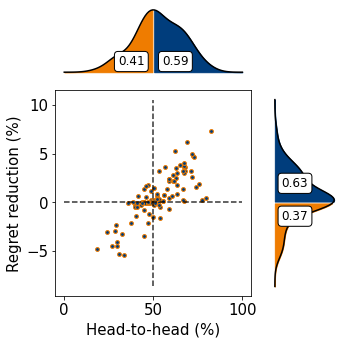

In [66]:
figure_plot_upright(all_h2h_ddrols, all_pio_ddrols, figure_name = '424Base_BinaryW_pio', yrange = [-2,4], size = (5, 5), move = [-0.08, 0.08, 0.32, 0.545], ypio = 1)

<a id='Part_4.2.3.1'></a>
#### 4.2.3.1 Effects of d, p, N, alpha--Sparse W
[Go back to top](#Top)

We will plot one figure in this subsection: DDR vs OLS

In [67]:
start = time.time()
random.seed(seed)
mis = 1
thres = 1000000
iters = 100
samples_test = 10000
n_epsilon = 1
lower = 0
upper = 1


p = 4
d = 10
samples_train = 100
alpha = 1

mu_all = [0.25]#[-0.2 + 0.05*i for i in range(6)]
lamb_all = [0.25]#[0.1 + 0.1*i for i in range(10)]


p_range = [4 + 2*i for i in range(4)]
d_range = [5, 10, 25, 50]
N_range = [50,100,200,500,1000]
alpha_range = [0.25, 1, 2.25, 4]

Results_all_p = {}
Results_all_d = {}
Results_all_N = {}
Results_all_alpha = {}
Results_p = {}
Results_d = {}
Results_N = {}
Results_alpha = {}
##### p
for p in p_range:
    start = time.time()
    
    mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
    =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                          alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [4,1])
    
    end = time.time()
    Results_p[p] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
    Results_all_p[p] = Results_all
    
string = '423Against_ols_p_SparseW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_p, f)

p = 4

##### d
for d in d_range:
    start = time.time()
    if d == 10:
        Results_d[d] = Results_p[p]
        Results_all_d[d] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [4,1])

        Results_d[d] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_d[d] = Results_all
    end = time.time()
    
string = '423Against_ols_d_SparseW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_d, f)
    
d = 10
##### N
for samples_train in N_range:
    start = time.time()
    if samples_train == 100:
        Results_N[samples_train] = Results_p[p]
        Results_all_N[samples_train] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [0,1])

        Results_N[samples_train] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_N[samples_train] = Results_all
    end = time.time()
    
string = '423Against_ols_N_SparseW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
samples_train = 100

##### alpha
for alpha in alpha_range:
    start = time.time()
    if alpha == 1:
        Results_alpha[alpha] = Results_p[p]
        Results_all_alpha[alpha] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [0,1])

        Results_alpha[alpha] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_alpha[alpha] = Results_all
    end = time.time()
    
string = '423Against_ols_alpha_SparseW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
alpha = 1

In [68]:
Results = [Results_p, Results_d, Results_N, Results_alpha]
Results_all = [Results_all_p, Results_all_d, Results_all_N, Results_all_alpha]

string = '423Aginst_ols_all_SparseW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_all, f) 
    
string = '423Aginst_ols_SparseW.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results, f) 

In [69]:
Results

[{4: [0.63, 0.6, 0.25, 0.25],
  6: [0.6, 0.59, 0.25, 0.25],
  8: [0.56, 0.56, 0.25, 0.25],
  10: [0.51, 0.54, 0.25, 0.25]},
 {5: [0.6, 0.55, 0.25, 0.25],
  10: [0.63, 0.6, 0.25, 0.25],
  25: [0.55, 0.53, 0.25, 0.25],
  50: [0.6, 0.55, 0.25, 0.25]},
 {50: [0.68, 0.66, 0.25, 0.25],
  100: [0.63, 0.6, 0.25, 0.25],
  200: [0.62, 0.6, 0.25, 0.25],
  500: [0.56, 0.55, 0.25, 0.25],
  1000: [0.55, 0.5, 0.25, 0.25]},
 {0.25: [0.58, 0.53, 0.25, 0.25],
  1: [0.63, 0.6, 0.25, 0.25],
  2.25: [0.75, 0.77, 0.25, 0.25],
  4: [0.75, 0.76, 0.25, 0.25]}]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


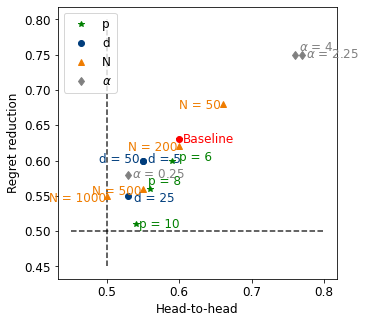

In [108]:
results = pickle.load( open( '423Aginst_ols_SparseW.pickle', "rb" ) )
Results_p = results[0]
Results_d = results[1]
Results_N = results[2]
Results_alpha = results[3]
mci_p = []
h2h_p = []
mci_d = []
h2h_d = []
mci_N = []
h2h_N = []
mci_alpha = []
h2h_alpha = []
for p in p_range:
    mci_p.append(Results_p[p][0])
    h2h_p.append(Results_p[p][1])
for d in d_range:
    mci_d.append(Results_d[d][0])
    h2h_d.append(Results_d[d][1])
for samples_train in N_range: 
    mci_N.append(Results_N[samples_train][0])
    h2h_N.append(Results_N[samples_train][1])
for alpha in alpha_range:
    mci_alpha.append(Results_alpha[alpha][0])
    h2h_alpha.append(Results_alpha[alpha][1])

fig = plt.figure(figsize = (5, 5))
plt.plot(h2h_p, mci_p, color='green', marker = "*", label = 'p', linestyle = 'None')
plt.text(h2h_p[0] + 0.005, mci_p[0] - 0.005, 'Baseline', color='red')
plt.text(h2h_p[1] + 0.01, mci_p[1] - 0.001, 'p = 6', color='green')
plt.text(h2h_p[2] - 0.003, mci_p[2] + 0.005, 'p = 8', color='green')
plt.text(h2h_p[3] + 0.005, mci_p[3] - 0.005, 'p = 10', color='green')

plt.plot(h2h_d[0], mci_d[0], color='#003D7C', marker = "o", label = 'd', linestyle = 'None')
# plt.plot(h2h_d[1], mci_d[1], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[2], mci_d[2], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[3], mci_d[3], color='#003D7C', marker = "o", linestyle = 'None')
plt.text(h2h_d[0] + 0.007, mci_d[0] - 0.003, 'd = 5', color='#003D7C')
# plt.text(h2h_d[1] + 0.007, mci_d[1] - 0.003, 'd = 15', color='#003D7C')
plt.text(h2h_d[2] + 0.007, mci_d[2] - 0.008, 'd = 25', color='#003D7C')
plt.text(h2h_d[3] - 0.06, mci_d[3] - 0.003, 'd = 50', color='#003D7C')


plt.plot(h2h_N[0], mci_N[0], color='#EF7C00', marker = "^", label = 'N',linestyle = 'None')
# plt.plot(h2h_N[1], mci_N[1], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[2], mci_N[2], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[3], mci_N[3], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[4], mci_N[4], color='#EF7C00', marker = "^",linestyle = 'None')
plt.text(h2h_N[0] - 0.06, mci_N[0] - 0.006, 'N = 50', color='#EF7C00')
# plt.text(h2h_N[1] + 0.005, mci_N[1] - 0.003, 'N = 100', color='#EF7C00')
plt.text(h2h_N[2] - 0.07, mci_N[2] - 0.006, 'N = 200', color='#EF7C00')
plt.text(h2h_N[3] - 0.07, mci_N[3] - 0.008, 'N = 500', color='#EF7C00')
plt.text(h2h_N[4] - 0.08, mci_N[4] - 0.008, 'N = 1000', color='#EF7C00')


plt.plot(h2h_alpha[0], mci_alpha[0], color='grey', marker = "d", label = r'$\alpha$',linestyle = 'None')
# plt.plot(h2h_alpha[1], mci_alpha[1], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[2], mci_alpha[2], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[3], mci_alpha[3], color='grey', marker = "d",linestyle = 'None')
plt.text(h2h_alpha[0] + 0.005, mci_alpha[0] - 0.005, r'$\alpha$ = 0.25', color='grey')
# plt.text(h2h_alpha[1] + 0.005, mci_alpha[1] - 0.005, r'$\alpha$ = 1', color='grey')
plt.text(h2h_alpha[2] + 0.005, mci_alpha[2] - 0.005, r'$\alpha$ = 2.25', color='grey')
plt.text(h2h_alpha[3] + 0.005, mci_alpha[3] + 0.005, r'$\alpha$ = 4', color='grey')

plt.vlines(0.5, 0.45, 0.8, linestyle="dashed", alpha = 0.8,color = 'k')
plt.hlines(0.5, 0.45, 0.8, linestyle="dashed", alpha = 0.8,color = 'k')
plt.legend()

plt.xlabel('Head-to-head')
plt.ylabel('Regret reduction')

plt.plot(h2h_p[0], mci_p[0], color='red', marker = "o", linestyle = 'None')

fig.savefig('423_pattern_pdNalpha_SparseW.eps', format='eps', bbox_inches="tight")
fig.savefig('423_pattern_pdNalpha_SparseW.pdf', format='pdf', bbox_inches="tight")

<a id='Part_4.2.4'></a>
### 4.2.4 Base case--Binary W 
[Go back to top](#Top)

We will plot one figure in this subsection: DDR vs OLS

In [67]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 100000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.3

# 0.25+0.25: 0.57, 0.6
# 0.60+0.25: 0.25, 0.6
# 0.25+0.50: 0.49, 0.52
## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 1) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012
    
    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp)
        
    lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = each_iter_ddr_vs_ols(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
results = [all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols, Data]
string = '424Base_BinaryW.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
end = time.time()
print(end - start)

65.10018491744995


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


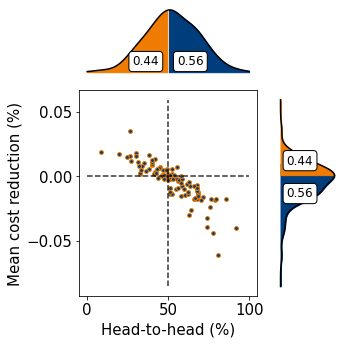

In [68]:
figure_plot_upright(all_h2h_ddrols, all_mci_ddrols, figure_name = '424Base_BinaryW', size = (5, 5), move = [-0.11, 0.05, 0.30, 0.55])

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


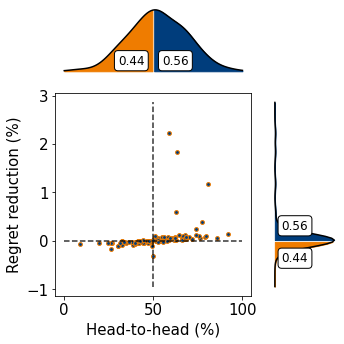

In [69]:
figure_plot_upright(all_h2h_ddrols, all_pio_ddrols, figure_name = '424Base_BinaryW_pio', yrange = [-2,4], size = (5, 5), move = [-0.08, 0.08, 0.32, 0.545], ypio = 1)

<a id='Part_4.2.5'></a>
### 4.2.5 Effects of d, p, N, alpha--Binary W
[Go back to top](#Top)

We will plot one figure in this subsection: DDR vs OLS

In [74]:
start = time.time()
random.seed(seed)
mis = 1
thres = 10000
iters = 100
samples_test = 10000
n_epsilon = 1
lower = 0
upper = 1


p = 4
d = 10
samples_train = 100
alpha = 1

mu_all = [0.25]#[-0.2 + 0.05*i for i in range(6)]
lamb_all = [0.25]#[0.1 + 0.1*i for i in range(10)]


p_range = [4 + 2*i for i in range(4)]
d_range = [5, 10, 25, 50]
N_range = [50,100,200,500,1000]
alpha_range = [0.25, 1, 2.25, 4]

Results_all_p = {}
Results_all_d = {}
Results_all_N = {}
Results_all_alpha = {}
Results_p = {}
Results_d = {}
Results_N = {}
Results_alpha = {}
##### p
for p in p_range:
    start = time.time()
    
    mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
    =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                          alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [1,1])
    
    end = time.time()
    Results_p[p] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
    Results_all_p[p] = Results_all
    
string = '425Against_ols_p.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_p, f)

p = 4

##### d
for d in d_range:
    start = time.time()
    if d == 10:
        Results_d[d] = Results_p[p]
        Results_all_d[d] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [1,1])

        Results_d[d] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_d[d] = Results_all
    end = time.time()
    
string = '425Against_ols_d.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_d, f)
    
d = 10
##### N
for samples_train in N_range:
    start = time.time()
    if samples_train == 100:
        Results_N[samples_train] = Results_p[p]
        Results_all_N[samples_train] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [1,1])

        Results_N[samples_train] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_N[samples_train] = Results_all
    end = time.time()
    
string = '425Against_ols_N.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
samples_train = 100

##### alpha
for alpha in alpha_range:
    start = time.time()
    if alpha == 1:
        Results_alpha[alpha] = Results_p[p]
        Results_all_alpha[alpha] = Results_all_p[p]
    else:
    
        mci_pct_final, h2h_pct_final, pio_pct_final, mu_final, lamb_final, Results_all\
        =each_para_ddr_vs_ols(p, d, samples_test, samples_train, lower, upper, \
                              alpha, W_star, n_epsilon, mis, thres, mu_all, lamb_all, vs = [1,1])

        Results_alpha[alpha] = [mci_pct_final, h2h_pct_final, mu_final, lamb_final]
        Results_all_alpha[alpha] = Results_all
    end = time.time()
    
string = '425Against_ols_alpha.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_N, f)
    
alpha = 1

In [75]:
Results = [Results_p, Results_d, Results_N, Results_alpha]
Results_all = [Results_all_p, Results_all_d, Results_all_N, Results_all_alpha]

string = '425Aginst_ols_all.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results_all, f) 
    
string = '425Aginst_ols.pickle'
with open(string, 'wb') as f:
    pickle.dump(Results, f) 

In [76]:
Results

[{4: [0.6, 0.58, 0.25, 0.25],
  6: [0.79, 0.74, 0.25, 0.25],
  8: [0.64, 0.71, 0.25, 0.25],
  10: [0.57, 0.59, 0.25, 0.25]},
 {5: [0.5, 0.48, 0.25, 0.25],
  10: [0.6, 0.58, 0.25, 0.25],
  25: [0.75, 0.71, 0.25, 0.25],
  50: [0.85, 0.79, 0.25, 0.25]},
 {50: [0.7, 0.67, 0.25, 0.25],
  100: [0.6, 0.58, 0.25, 0.25],
  200: [0.53, 0.49, 0.25, 0.25],
  500: [0.36, 0.37, 0.25, 0.25],
  1000: [0.32, 0.33, 0.25, 0.25]},
 {0.25: [0.47, 0.49, 0.25, 0.25],
  1: [0.6, 0.58, 0.25, 0.25],
  2.25: [0.72, 0.72, 0.25, 0.25],
  4: [0.84, 0.83, 0.25, 0.25]}]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


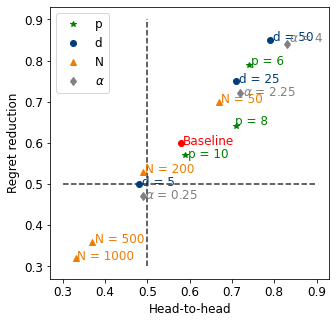

In [109]:
results = pickle.load( open( '425Aginst_ols.pickle', "rb" ) )
Results_p = results[0]
Results_d = results[1]
Results_N = results[2]
Results_alpha = results[3]
mci_p = []
h2h_p = []
mci_d = []
h2h_d = []
mci_N = []
h2h_N = []
mci_alpha = []
h2h_alpha = []
for p in p_range:
    mci_p.append(Results_p[p][0])
    h2h_p.append(Results_p[p][1])
for d in d_range:
    mci_d.append(Results_d[d][0])
    h2h_d.append(Results_d[d][1])
for samples_train in N_range: 
    mci_N.append(Results_N[samples_train][0])
    h2h_N.append(Results_N[samples_train][1])
for alpha in alpha_range:
    mci_alpha.append(Results_alpha[alpha][0])
    h2h_alpha.append(Results_alpha[alpha][1])

fig = plt.figure(figsize = (5, 5))
plt.plot(h2h_p, mci_p, color='green', marker = "*", label = 'p', linestyle = 'None')
plt.text(h2h_p[0] + 0.005, mci_p[0] - 0.005, 'Baseline', color='red')
plt.text(h2h_p[1] + 0.005, mci_p[1] - 0.001, 'p = 6', color='green')
plt.text(h2h_p[2] - 0.003, mci_p[2] + 0.005, 'p = 8', color='green')
plt.text(h2h_p[3] + 0.005, mci_p[3] - 0.005, 'p = 10', color='green')

plt.plot(h2h_d[0], mci_d[0], color='#003D7C', marker = "o", label = 'd', linestyle = 'None')
# plt.plot(h2h_d[1], mci_d[1], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[2], mci_d[2], color='#003D7C', marker = "o", linestyle = 'None')
plt.plot(h2h_d[3], mci_d[3], color='#003D7C', marker = "o", linestyle = 'None')
plt.text(h2h_d[0] + 0.007, mci_d[0] - 0.003, 'd = 5', color='#003D7C')
# plt.text(h2h_d[1] + 0.007, mci_d[1] - 0.003, 'd = 15', color='#003D7C')
plt.text(h2h_d[2] + 0.007, mci_d[2] - 0.003, 'd = 25', color='#003D7C')
plt.text(h2h_d[3] + 0.007, mci_d[3] - 0.003, 'd = 50', color='#003D7C')


plt.plot(h2h_N[0], mci_N[0], color='#EF7C00', marker = "^", label = 'N',linestyle = 'None')
# plt.plot(h2h_N[1], mci_N[1], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[2], mci_N[2], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[3], mci_N[3], color='#EF7C00', marker = "^",linestyle = 'None')
plt.plot(h2h_N[4], mci_N[4], color='#EF7C00', marker = "^",linestyle = 'None')
plt.text(h2h_N[0] + 0.005, mci_N[0] - 0.003, 'N = 50', color='#EF7C00')
# plt.text(h2h_N[1] + 0.005, mci_N[1] - 0.003, 'N = 100', color='#EF7C00')
plt.text(h2h_N[2] + 0.005, mci_N[2] - 0.003, 'N = 200', color='#EF7C00')
plt.text(h2h_N[3] + 0.005, mci_N[3] - 0.003, 'N = 500', color='#EF7C00')
plt.text(h2h_N[4] + 0.004, mci_N[4] - 0.003, 'N = 1000', color='#EF7C00')


plt.plot(h2h_alpha[0], mci_alpha[0], color='grey', marker = "d", label = r'$\alpha$',linestyle = 'None')
# plt.plot(h2h_alpha[1], mci_alpha[1], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[2], mci_alpha[2], color='grey', marker = "d",linestyle = 'None')
plt.plot(h2h_alpha[3], mci_alpha[3], color='grey', marker = "d",linestyle = 'None')
plt.text(h2h_alpha[0] + 0.005, mci_alpha[0] - 0.005, r'$\alpha$ = 0.25', color='grey')
# plt.text(h2h_alpha[1] + 0.005, mci_alpha[1] - 0.005, r'$\alpha$ = 1', color='grey')
plt.text(h2h_alpha[2] + 0.005, mci_alpha[2] - 0.005, r'$\alpha$ = 2.25', color='grey')
plt.text(h2h_alpha[3] + 0.005, mci_alpha[3] + 0.005, r'$\alpha$ = 4', color='grey')

plt.vlines(0.5, 0.3, 0.9, linestyle="dashed", alpha = 0.8,color = 'k')
plt.hlines(0.5, 0.3, 0.9, linestyle="dashed", alpha = 0.8,color = 'k')
plt.legend()

plt.xlabel('Head-to-head')
plt.ylabel('Regret reduction')

plt.plot(h2h_p[0], mci_p[0], color='red', marker = "o", linestyle = 'None')

fig.savefig('425_pattern_pdNalpha.eps', format='eps', bbox_inches="tight")
fig.savefig('425_pattern_pdNalpha.pdf', format='pdf', bbox_inches="tight")

<a id='Part_4.2.6'></a>
### 4.2.6 With constraints
[Go back to top](#Top)

In [34]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 1000000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.05
lamb = 0.25

# 0.25+0.25: 0.57, 0.6
# 0.60+0.25: 0.25, 0.6
# 0.25+0.50: 0.49, 0.52
## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p
a = 3
A = np.random.uniform(-2,0,(a,d))
b = np.random.uniform(-1,0,a)
    
Data = {}
all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012

    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp)
        
    lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = each_iter_ddr_vs_ols(Data[i], mis, thres, mu, lamb, ypio = 1, yconstraint = 1, A = A, b = b)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
results = [all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols, Data]
string = '426With_constraint.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
end = time.time()
print(end - start)

2567.748990535736


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


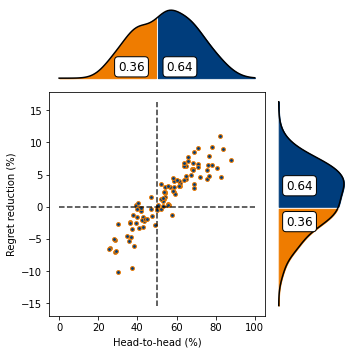

In [35]:
figure_plot_upright(all_h2h_ddrols, all_pio_ddrols, figure_name = '426With_constraint', yrange = [-2,4], size = (5, 5), move = [-0.08, 0.08, 0.32, 0.545], ypio = 1)

<a id='Part_4.2.7'></a>
### 4.2.7 With transformation matrix
[Go back to top](#Top)

In [27]:
B = np.diag(np.random.uniform(0.9,1.1,d))
B

array([[1.07426686, 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.90115032, 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.93040378, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.93879215, 0.        ],
       [0.        , 0.        , 0.        , 0.        , 1.01053882]])

In [30]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 1000000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.5

# 0.25+0.25: 0.57, 0.6
# 0.60+0.25: 0.25, 0.6
# 0.25+0.50: 0.49, 0.52
## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

# B = np.random.uniform(1/(4*d),3/(4*d),(d,d))

# B = B / B.sum(axis = 1)

# B = 0.5*np.eye(d, dtype = int)  - 0.5*np.eye(d, k = d)
B = np.diag(np.random.uniform(0.9,1.1,d))
Data = {}
all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012

    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp)
        
    lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = \
    each_iter_ddr_vs_ols(Data[i], mis, thres, mu, lamb, ypio = 1, yB = 1, B = B)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
results = [all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols, Data]
string = '427With_transformation.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
end = time.time()
print(end - start)

190.26081538200378


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


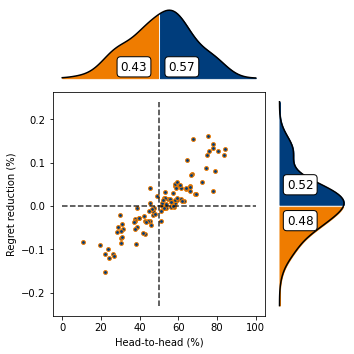

In [31]:
figure_plot_upright(all_h2h_ddrols, all_pio_ddrols, figure_name = '427With_trainsformation', yrange = [-2,4], size = (5, 5), move = [-0.08, 0.08, 0.32, 0.545], ypio = 1)

<a id='Sec_4.3'></a>
## Section 4.3: Misspecification
[Go back to top](#Top)

In [28]:
def each_iter_ddr_vs_spo_and_ols(data, mis, thres, mu, lamb, ypio = 0):
    x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data
    ## Solve and evaluate the OLS model
    W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)
    z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
    c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)

    y_test_opt = decision_finder(z_test_ori)
    c_oracle = mean(np.sum(np.minimum(z_test_ori,thres) * y_test_opt, axis = 1))
    
    ## Solve and evaluate the DDR model
    # Obtain regression parameters
    W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb) #******
    z_test_ddr, y_test_ddr, c_test_ddr = param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres)
    c_ddr_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
    
    ## Solve and evaluate the SPO+ model
    # Obtain regression parameters
    y_train_opt = decision_finder(z_train) #generates the optimal y from the training costs
    W_spo, w0_spo, t_spo = spo_solver(x_train, z_train, y_train_opt)
    
    z_test_spo, y_test_spo, c_test_spo = param_prediction_and_cost_estimation(x_test, W_spo, w0_spo, thres)
    c_spo_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_spo, axis = 1)
    
    if ypio == 0:
#     # compares results
        lbels_ddrspo, h2h_ddrspo, mci_ddrspo = cross_compare2(c_ddr_true, c_spo_true, c_oracle)
        lbels_olsspo, h2h_olsspo, mci_olsspo = cross_compare2(c_ols_true, c_spo_true, c_oracle)
        lbels_ddrols, h2h_ddrols, mci_ddrols = cross_compare2(c_ddr_true, c_ols_true, c_oracle)
        return h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols
    else:
        # compares results plus
        lbels_ddrspo, h2h_ddrspo, mci_ddrspo, pio_ddrspo = cross_compare2plus(c_ddr_true, c_spo_true, c_oracle)
        lbels_olsspo, h2h_olsspo, mci_olsspo, pio_olsspo = cross_compare2plus(c_ols_true, c_spo_true, c_oracle)
        lbels_ddrols, h2h_ddrols, mci_ddrols, pio_ddrols = cross_compare2plus(c_ddr_true, c_ols_true, c_oracle)

        return h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols, pio_ddrspo, pio_olsspo, pio_ddrols 


In [29]:
def figure_plot_mis(all_wins, all_mean_cost_imp, mis):
    plt.figure(figsize = (6,5))
    plt.plot(all_wins[0:3], all_mean_cost_imp[0:3],'bo', color='#003D7C')
    for i in range(3):
        plt.text(all_wins[i] - 1, all_mean_cost_imp[i] - 0.1,np.round(mis[i],1), color='#003D7C')

    plt.plot(all_wins[3], all_mean_cost_imp[3],'d', color='red')
    plt.text(all_wins[3] - 1, all_mean_cost_imp[3] - 0.1, np.round(mis[3],1), color='red')

    plt.plot(all_wins[4:7], all_mean_cost_imp[4:7],'v', color = '#EF7C00')
    for i in range(4, 7):
        plt.text(all_wins[i] + 1, all_mean_cost_imp[i] - 0.1, np.round(mis[i],1), color='#EF7C00')

    plt.plot(all_wins[7], all_mean_cost_imp[7],'v', color = '#EF7C00')
    plt.text(all_wins[7] - 1, all_mean_cost_imp[7] - 0.1, np.round(mis[7],1), color='#EF7C00')

    plt.plot(all_wins[8:12], all_mean_cost_imp[8:12],'v', color = '#EF7C00')
    for i in range(8, 12):
           plt.text(all_wins[i] - 1, all_mean_cost_imp[i] - 0.1, np.round(mis[i],1), color='#EF7C00')

    plt.vlines(50, -25, 7, linestyle="dashed", alpha = 0.8, color = 'k')
    plt.hlines(0, 40, 88, linestyle="dashed", alpha = 0.8, color = 'k')


    plt.xlabel('Head-to-head (%)', fontsize=13)
    plt.ylabel('Mean cost reduction (%)', fontsize=13)
    plt.rcParams.update({'font.size': 13})

    plt.ylim(min(all_mean_cost_imp) - 1, max(all_mean_cost_imp) + 1)
    plt.xlim(min(all_wins) - 1, max(all_wins) + 1)

In [30]:
def figure_plot_mis_pio(h2h, pio, mis):
    plt.figure(figsize = (6,5))
    plt.plot(h2h[0:3], pio[0:3],'bo', color='#003D7C')
    for i in range(3):
        plt.text(h2h[i] - 1, pio[i] - 0.1,np.round(mis[i],1), color='#003D7C')

    plt.plot(h2h[3], pio[3],'d', color='red')
    plt.text(h2h[3] - 1, pio[3] - 0.1, np.round(mis[3],1), color='red')

    plt.plot(h2h[4:7], pio[4:7],'v', color = '#EF7C00')
    for i in range(4, 7):
        plt.text(h2h[i] + 1, pio[i] - 0.1, np.round(mis[i],1), color='#EF7C00')

    plt.plot(h2h[7], pio[7],'v', color = '#EF7C00')
    plt.text(h2h[7] - 1, pio[7] - 0.1, np.round(mis[7],1), color='#EF7C00')

    plt.plot(h2h[8:12], pio[8:12],'v', color = '#EF7C00')
    for i in range(8, 12):
           plt.text(h2h[i] - 1, pio[i] - 0.1, np.round(mis[i],1), color='#EF7C00')

    plt.vlines(50, -25, 7, linestyle="dashed", alpha = 0.8, color = 'k')
    plt.hlines(0, 40, 88, linestyle="dashed", alpha = 0.8, color = 'k')


    plt.xlabel('Head-to-head (%)', fontsize=13)
    plt.ylabel('Regret reduction (%)', fontsize=13)
    plt.rcParams.update({'font.size': 13})

    plt.ylim(min(pio) - 1, max(pio) + 1)
    plt.xlim(min(h2h) - 1, max(h2h) + 1)

<a id='Sec_4.3.1'></a>
### Section 4.3.1: DDR vs SPO (mis 1.8)
[Go back to top](#Top)

In [31]:
## Train and test are together
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1.8
thres = 10000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
bp = 7

mu = 0.25
lamb = 0.25

## generate samples new
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p

Data = {}
all_h2h_ddrspo = []
all_mci_ddrspo = []
all_pio_ddrspo = []

all_h2h_olsspo = []
all_mci_olsspo = []
all_pio_olsspo = []

all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []
for i in range(iters):
    W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 binary, 2 uniform + feature, 3 binary + feature, 4 sparse, 5 012

    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                        version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, x_mean = xm,
                        x_var = xv, bump = bp)
    
    h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols, pio_ddrspo, pio_olsspo, pio_ddrols\
    = each_iter_ddr_vs_spo_and_ols(Data[i], mis, thres, mu, lamb, ypio = 1)
    
    all_h2h_ddrspo.append(h2h_ddrspo*100)
    all_mci_ddrspo.append(mci_ddrspo*100)
    all_pio_ddrspo.append(pio_ddrspo*100)
    
    all_h2h_olsspo.append(h2h_olsspo*100)
    all_mci_olsspo.append(mci_olsspo*100)
    all_pio_olsspo.append(pio_olsspo*100)
    
    all_h2h_ddrols.append(h2h_ddrols*100)
    all_mci_ddrols.append(mci_ddrols*100)
    all_pio_ddrols.append(pio_ddrols*100)
    
results = [all_h2h_ddrspo, all_mci_ddrspo, all_pio_ddrspo, all_h2h_olsspo, all_mci_olsspo, all_pio_olsspo, all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols]
string = '431_ddr_spo_mis1point8.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)
# figure_plot_upleft(all_wins, all_mean_cost_imp_oracle, figure_name, size = (5, 5), move = [-0.12, 0.04])
end = time.time()
print(end - start)

109.22179412841797


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


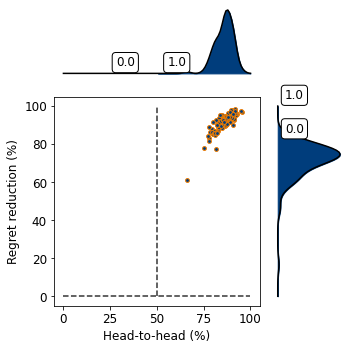

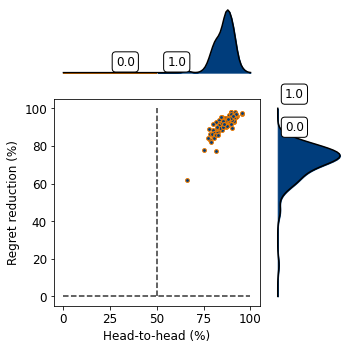

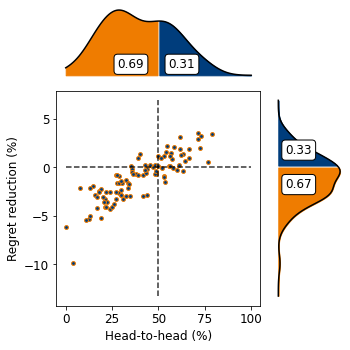

In [33]:
figure_plot_upright(all_h2h_ddrspo, all_pio_ddrspo, figure_name = '431_ddr_spo_mis1point8', size = (5, 5), move = [-0.11, 0.05, 0.30, 0.55], ysame = 1, yrange = [0, 100], ypio = 1)
figure_plot_upright(all_h2h_olsspo, all_pio_olsspo, figure_name = '431_ols_spo_mis1point8', size = (5, 5), move = [-0.11, 0.05, 0.30, 0.55], ysame = 1, yrange = [0, 100], ypio = 1)
figure_plot_upright(all_h2h_ddrols, all_pio_ddrols, figure_name = '431_ddr_ols_mis1point8', size = (5, 5), move = [-0.11, 0.05, 0.30, 0.55], ypio = 1)

<a id='Sec_4.3.2'></a>
### Section 4.3.2: DDR/OLS vs SPO (all mis)
[Go back to top](#Top)

In [158]:
# random.seed(3)
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 100000000
ver = 1
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25

mis_all = [0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.8, 2.0, 2.5, 3.0, 3.5, 4.0]
# mis_all = [0.5, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0]
    
all_h2h_ddrspo = []
all_mci_ddrspo = []
all_pio_ddrspo = []

all_h2h_ddrols = []
all_mci_ddrols = []
all_pio_ddrols = []

all_h2h_olsspo = []
all_mci_olsspo = []
all_pio_olsspo = []

for mis in mis_all:
    Data = {}
    mis_h2h_ddrspo = []
    mis_mci_ddrspo = []
    mis_pio_ddrspo = []
    
    mis_h2h_olsspo = []
    mis_mci_olsspo = []
    mis_pio_olsspo = []
    
    mis_h2h_ddrols = []
    mis_mci_ddrols = []
    mis_pio_ddrols = []
    for i in range(iters):
        W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
        Data[mis,i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                                           version = 1, x_dist = x_dister, e_dist = e_dister, x_low = xl, 
                                           x_up = xu, x_mean = xm, x_var = xv, bump = bp)
        h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols,\
        mci_ddrols, pio_ddrspo, pio_olsspo, pio_ddrols  = each_iter_ddr_vs_spo_and_ols(Data[mis,i], mis, thres, mu, lamb, ypio = 1)
                
        mis_h2h_ddrspo.append(h2h_ddrspo*100)
        mis_mci_ddrspo.append(mci_ddrspo*100)
        mis_pio_ddrspo.append(pio_ddrspo*100)
        
        mis_h2h_olsspo.append(h2h_olsspo*100)
        mis_mci_olsspo.append(mci_olsspo*100)
        mis_pio_olsspo.append(pio_olsspo*100)

        mis_h2h_ddrols.append(h2h_ddrols*100)
        mis_mci_ddrols.append(mci_ddrols*100)
        mis_pio_ddrols.append(pio_ddrols*100)
    
#     print(mis_mci_ddrspo)
    all_h2h_ddrspo.append(np.nanmean(mis_h2h_ddrspo))
    all_mci_ddrspo.append(np.nanmean(mis_mci_ddrspo))
    all_pio_ddrspo.append(np.nanmean(mis_pio_ddrspo))
    
    all_h2h_olsspo.append(np.nanmean(mis_h2h_olsspo))
    all_mci_olsspo.append(np.nanmean(mis_mci_olsspo))
    all_pio_olsspo.append(np.nanmean(mis_pio_olsspo))
    
    all_h2h_ddrols.append(np.nanmean(mis_h2h_ddrols))
    all_mci_ddrols.append(np.nanmean(mis_mci_ddrols))  
    all_pio_ddrols.append(np.nanmean(mis_pio_ddrols))  
    
results = [all_h2h_ddrspo, all_mci_ddrspo, all_pio_ddrspo, 
           all_h2h_olsspo, all_mci_olsspo, all_pio_olsspo, 
           all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols]
string = '430Misspecification.pickle'
with open(string, 'wb') as f: 
    pickle.dump(results, f)

In [3]:
results = pickle.load( open( '430Misspecification.pickle', "rb" ) )
all_h2h_ddrspo, all_mci_ddrspo, all_pio_ddrspo,\
all_h2h_olsspo, all_mci_olsspo, all_pio_olsspo,\
all_h2h_ddrols, all_mci_ddrols, all_pio_ddrols = results

In [160]:
all_h2h_ddrspo,all_mci_ddrspo, all_pio_ddrspo

([57.90514213711208,
  60.81316577036342,
  67.3503917460143,
  72.31796500052079,
  79.880510021795,
  82.31195314914078,
  85.29641080321944,
  79.33185508983175,
  50.007695839157506,
  47.11127271278575,
  49.0175204849103,
  47.151462054199726],
 [-0.6133408490401026,
  -0.979683799598688,
  -1.2208497541613836,
  -1.0806395860587608,
  -1.054827833695005,
  -0.8510437501936788,
  -1.2360890985656803,
  -1.0229867185965593,
  -0.06506311258345408,
  -0.034478732550901586,
  -0.04612140149263445,
  0.02823129800128753],
 [12.298885566131492,
  17.981197320030738,
  35.54593438553495,
  51.07300817672325,
  71.92454661039153,
  81.85206575963615,
  90.93757291043394,
  84.63872675679072,
  -9.720959443703528,
  -23.640257621475495,
  -20.18497376946435,
  -42.99429612695952])

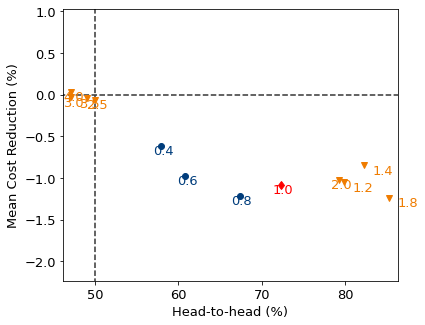

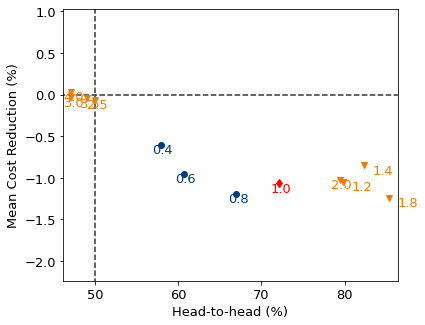

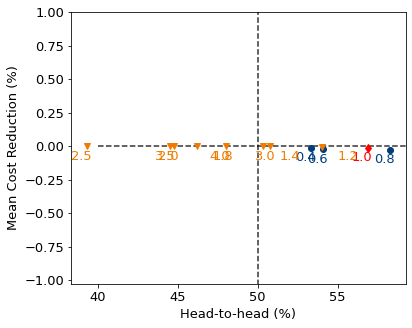

In [161]:
figure_plot_mis(all_h2h_ddrspo, all_mci_ddrspo, mis_all)   
figure_plot_mis(all_h2h_olsspo, all_mci_olsspo, mis_all) 
figure_plot_mis(all_h2h_ddrols, all_mci_ddrols, mis_all)

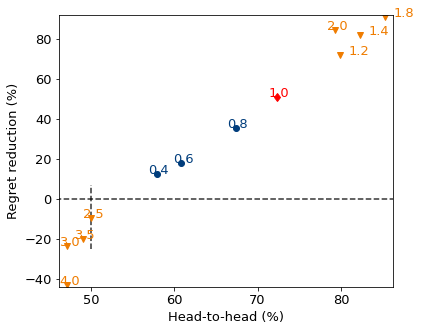

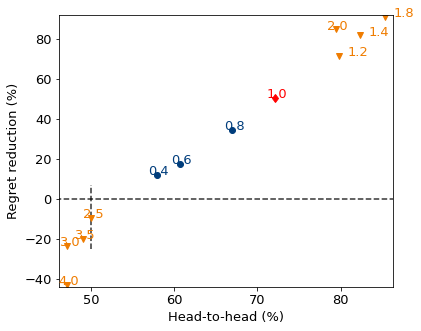

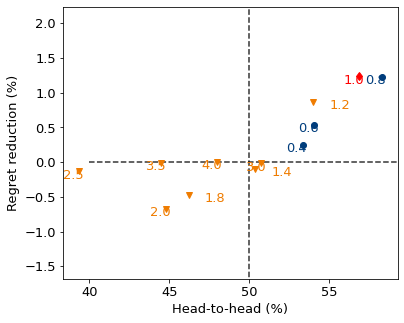

In [162]:
figure_plot_mis_pio(all_h2h_ddrspo, all_pio_ddrspo, mis_all)   
figure_plot_mis_pio(all_h2h_olsspo, all_pio_olsspo, mis_all) 
figure_plot_mis_pio(all_h2h_ddrols, all_pio_ddrols, mis_all)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


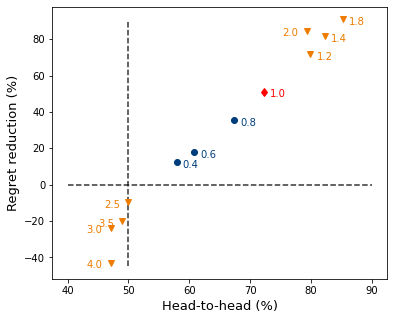

In [5]:
mis_all = [0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.8, 2.0, 2.5, 3.0, 3.5, 4.0]
h2h = all_h2h_ddrspo
pio = all_pio_ddrspo
mis = mis_all
plt.figure(figsize = (6,5))
plt.plot(h2h[0:3], pio[0:3],'bo', color='#003D7C')
for i in range(3):
    plt.text(h2h[i] + 1, pio[i] - 3,np.round(mis[i],1), color='#003D7C')

plt.plot(h2h[3], pio[3],'d', color='red')
plt.text(h2h[3] + 1, pio[3] - 3, np.round(mis[3],1), color='red')

plt.plot(h2h[4:7], pio[4:7],'v', color = '#EF7C00')
for i in range(4, 7):
    plt.text(h2h[i] + 1, pio[i] - 3, np.round(mis[i],1), color='#EF7C00')

plt.plot(h2h[7], pio[7],'v', color = '#EF7C00')
plt.text(h2h[7] - 4, pio[7] - 3, np.round(mis[7],1), color='#EF7C00')

plt.plot(h2h[8:12], pio[8:12],'v', color = '#EF7C00')
for i in range(8, 12):
       plt.text(h2h[i] - 4, pio[i] - 3, np.round(mis[i],1), color='#EF7C00')

plt.vlines(50, -45, 90, linestyle="dashed", alpha = 0.8, color = 'k')
plt.hlines(0, 40, 90, linestyle="dashed", alpha = 0.8, color = 'k')


plt.xlabel('Head-to-head (%)', fontsize=13)
plt.ylabel('Regret reduction (%)', fontsize=13)
plt.rcParams.update({'font.size': 13})

plt.savefig('430_mis_ddrspo.eps', format='eps', bbox_inches="tight")

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


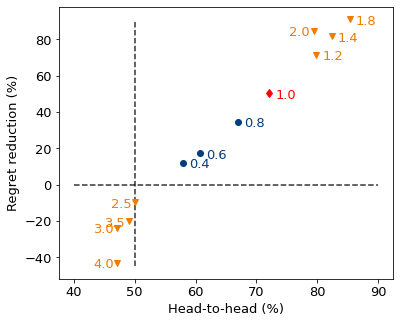

In [6]:
h2h = all_h2h_olsspo
pio = all_pio_olsspo
mis = mis_all
plt.figure(figsize = (6,5))
plt.plot(h2h[0:3], pio[0:3],'bo', color='#003D7C')
for i in range(3):
    plt.text(h2h[i] + 1, pio[i] - 3,np.round(mis[i],1), color='#003D7C')

plt.plot(h2h[3], pio[3],'d', color='red')
plt.text(h2h[3] + 1, pio[3] - 3, np.round(mis[3],1), color='red')

plt.plot(h2h[4:7], pio[4:7],'v', color = '#EF7C00')
for i in range(4, 7):
    plt.text(h2h[i] + 1, pio[i] - 3, np.round(mis[i],1), color='#EF7C00')

plt.plot(h2h[7], pio[7],'v', color = '#EF7C00')
plt.text(h2h[7] - 4, pio[7] - 3, np.round(mis[7],1), color='#EF7C00')

plt.plot(h2h[8:12], pio[8:12],'v', color = '#EF7C00')
for i in range(8, 12):
       plt.text(h2h[i] - 4, pio[i] - 3, np.round(mis[i],1), color='#EF7C00')

plt.vlines(50, -45, 90, linestyle="dashed", alpha = 0.8, color = 'k')
plt.hlines(0, 40, 90, linestyle="dashed", alpha = 0.8, color = 'k')


plt.xlabel('Head-to-head (%)', fontsize=13)
plt.ylabel('Regret reduction (%)', fontsize=13)
plt.rcParams.update({'font.size': 13})

plt.savefig('430_mis_olsspo.eps', format='eps', bbox_inches="tight")

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


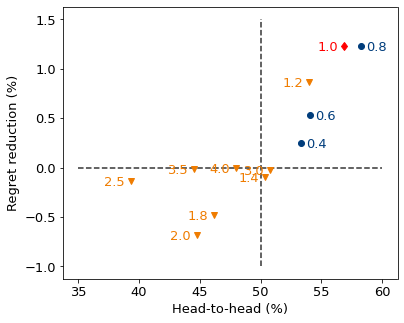

In [7]:
h2h = all_h2h_ddrols
pio = all_pio_ddrols
mis = mis_all
plt.figure(figsize = (6,5))
plt.plot(h2h[0:3], pio[0:3],'bo', color='#003D7C')
for i in range(3):
    plt.text(h2h[i] + 0.4, pio[i] - 0.05,np.round(mis[i],1), color='#003D7C')

plt.plot(h2h[3], pio[3],'d', color='red')
plt.text(h2h[3] - 2.2, pio[3] - 0.05, np.round(mis[3],1), color='red')

plt.plot(h2h[4:7], pio[4:7],'v', color = '#EF7C00')
for i in range(4, 7):
    plt.text(h2h[i] - 2.2, pio[i] - 0.05, np.round(mis[i],1), color='#EF7C00')

plt.plot(h2h[7], pio[7],'v', color = '#EF7C00')
plt.text(h2h[7] - 2.2, pio[7] - 0.05, np.round(mis[7],1), color='#EF7C00')

plt.plot(h2h[8:12], pio[8:12],'v', color = '#EF7C00')
for i in range(8, 12):
       plt.text(h2h[i] - 2.2, pio[i] - 0.05, np.round(mis[i],1), color='#EF7C00')

plt.vlines(50, -1, 1.5, linestyle="dashed", alpha = 0.8, color = 'k')
plt.hlines(0, 35, 60, linestyle="dashed", alpha = 0.8, color = 'k')


plt.xlabel('Head-to-head (%)', fontsize=13)
plt.ylabel('Regret reduction (%)', fontsize=13)
plt.rcParams.update({'font.size': 13})

plt.savefig('430_mis_ddrols.eps', format='eps', bbox_inches="tight")

In [99]:
# random.seed(3)
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 10000
ver = 1
x_dister = 'normal'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25

mis_all = [0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.8, 2.0, 2.5, 3.0, 3.5, 4.0]
# mis_all = [0.5, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0]
    
all_h2h_ddrspo = []
all_mci_ddrspo = []
all_h2h_ddrols = []
all_mci_ddrols = []
all_h2h_olsspo = []
all_mci_olsspo = []

for mis in mis_all:
    Data = {}
    mis_h2h_ddrspo = []
    mis_mci_ddrspo = []
    mis_h2h_olsspo = []
    mis_mci_olsspo = []
    mis_h2h_ddrols = []
    mis_mci_ddrols = []
    for i in range(iters):
        W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
        Data[mis,i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                                           version = 1, x_dist = x_dister, e_dist = e_dister, x_low = xl, 
                                           x_up = xu, x_mean = xm, x_var = xv, bump = bp)
        h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols = each_iter_ddr_vs_spo_and_ols(Data[mis,i], mis, thres, mu, lamb)
                
        mis_h2h_ddrspo.append(h2h_ddrspo*100)
        mis_mci_ddrspo.append(mci_ddrspo*100)
        
        mis_h2h_olsspo.append(h2h_olsspo*100)
        mis_mci_olsspo.append(mci_olsspo*100)

        mis_h2h_ddrols.append(h2h_ddrols*100)
        mis_mci_ddrols.append(mci_ddrols*100)
        
    all_h2h_ddrspo.append(mean(mis_h2h_ddrspo))
    all_mci_ddrspo.append(mean(mis_mci_ddrspo))
    all_h2h_olsspo.append(mean(mis_h2h_olsspo))
    all_mci_olsspo.append(mean(mis_mci_olsspo))
    all_h2h_ddrols.append(mean(mis_h2h_ddrols))
    all_mci_ddrols.append(mean(mis_mci_ddrols))  
results = [all_h2h_ddrspo, all_mci_ddrspo, all_h2h_olsspo, all_mci_olsspo, all_h2h_ddrols, all_mci_ddrols]
string = '430Misspecification.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)

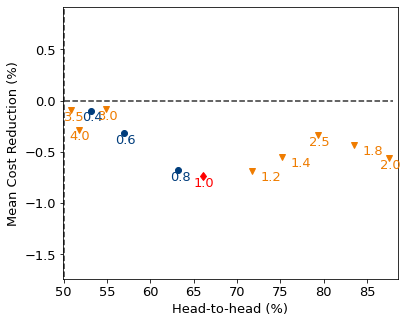

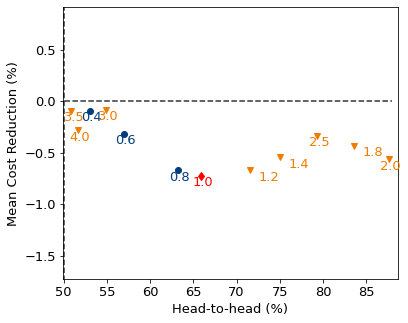

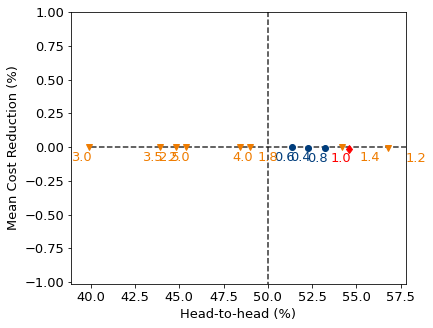

In [100]:
figure_plot_mis(all_h2h_ddrspo, all_mci_ddrspo, mis_all)   
figure_plot_mis(all_h2h_olsspo, all_mci_olsspo, mis_all) 
figure_plot_mis(all_h2h_ddrols, all_mci_ddrols, mis_all)

In [101]:
# random.seed(3)
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 10000000
ver = 1
x_dister = 'normal'
e_dister = 'uniform'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25

mis_all = [0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.8, 2.0, 2.5, 3.0, 3.5, 4.0]
# mis_all = [0.5, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0]
    
all_h2h_ddrspo = []
all_mci_ddrspo = []
all_h2h_ddrols = []
all_mci_ddrols = []
all_h2h_olsspo = []
all_mci_olsspo = []

for mis in mis_all:
    Data = {}
    mis_h2h_ddrspo = []
    mis_mci_ddrspo = []
    mis_h2h_olsspo = []
    mis_mci_olsspo = []
    mis_h2h_ddrols = []
    mis_mci_ddrols = []
    for i in range(iters):
        W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
        Data[mis,i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                                           version = 1, x_dist = x_dister, e_dist = e_dister, x_low = xl, 
                                           x_up = xu, x_mean = xm, x_var = xv, bump = bp)
        h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols = each_iter_ddr_vs_spo_and_ols(Data[mis,i], mis, thres, mu, lamb)
                
        mis_h2h_ddrspo.append(h2h_ddrspo*100)
        mis_mci_ddrspo.append(mci_ddrspo*100)
        
        mis_h2h_olsspo.append(h2h_olsspo*100)
        mis_mci_olsspo.append(mci_olsspo*100)

        mis_h2h_ddrols.append(h2h_ddrols*100)
        mis_mci_ddrols.append(mci_ddrols*100)
        
    all_h2h_ddrspo.append(mean(mis_h2h_ddrspo))
    all_mci_ddrspo.append(mean(mis_mci_ddrspo))
    all_h2h_olsspo.append(mean(mis_h2h_olsspo))
    all_mci_olsspo.append(mean(mis_mci_olsspo))
    all_h2h_ddrols.append(mean(mis_h2h_ddrols))
    all_mci_ddrols.append(mean(mis_mci_ddrols))  
results = [all_h2h_ddrspo, all_mci_ddrspo, all_h2h_olsspo, all_mci_olsspo, all_h2h_ddrols, all_mci_ddrols]
string = '430Misspecification.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)

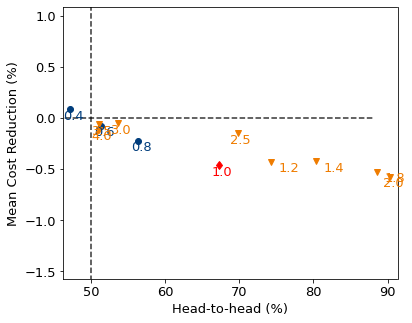

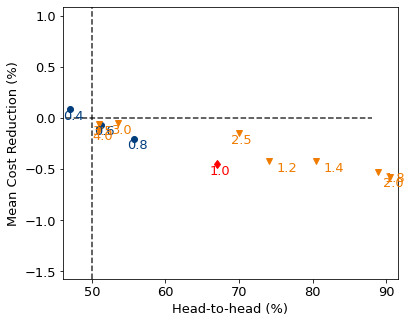

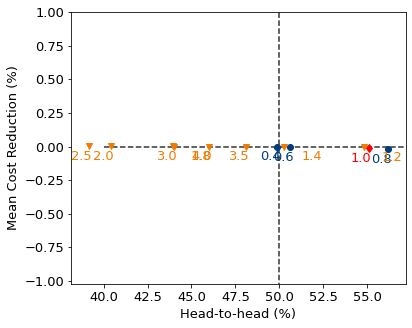

In [102]:
figure_plot_mis(all_h2h_ddrspo, all_mci_ddrspo, mis_all)   
figure_plot_mis(all_h2h_olsspo, all_mci_olsspo, mis_all) 
figure_plot_mis(all_h2h_ddrols, all_mci_ddrols, mis_all)

In [103]:
# random.seed(3)
start = time.time()
random.seed(seed)
iters = 100
p = 4
d = 10
samples_test = 10000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 1
mis = 1
thres = 10000000
ver = 1
x_dister = 'uniform'
e_dister = 'uniform'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.25
lamb = 0.25

mis_all = [0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.8, 2.0, 2.5, 3.0, 3.5, 4.0]
# mis_all = [0.5, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0]
    
all_h2h_ddrspo = []
all_mci_ddrspo = []
all_h2h_ddrols = []
all_mci_ddrols = []
all_h2h_olsspo = []
all_mci_olsspo = []

for mis in mis_all:
    Data = {}
    mis_h2h_ddrspo = []
    mis_mci_ddrspo = []
    mis_h2h_olsspo = []
    mis_mci_olsspo = []
    mis_h2h_ddrols = []
    mis_mci_ddrols = []
    for i in range(iters):
        W_star = generate_truth(lower, upper, p, d, version = 0) # o uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
        Data[mis,i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                                           version = 1, x_dist = x_dister, e_dist = e_dister, x_low = xl, 
                                           x_up = xu, x_mean = xm, x_var = xv, bump = bp)
        h2h_ddrspo, mci_ddrspo, h2h_olsspo, mci_olsspo, h2h_ddrols, mci_ddrols = each_iter_ddr_vs_spo_and_ols(Data[mis,i], mis, thres, mu, lamb)
                
        mis_h2h_ddrspo.append(h2h_ddrspo*100)
        mis_mci_ddrspo.append(mci_ddrspo*100)
        
        mis_h2h_olsspo.append(h2h_olsspo*100)
        mis_mci_olsspo.append(mci_olsspo*100)

        mis_h2h_ddrols.append(h2h_ddrols*100)
        mis_mci_ddrols.append(mci_ddrols*100)
        
    all_h2h_ddrspo.append(mean(mis_h2h_ddrspo))
    all_mci_ddrspo.append(mean(mis_mci_ddrspo))
    all_h2h_olsspo.append(mean(mis_h2h_olsspo))
    all_mci_olsspo.append(mean(mis_mci_olsspo))
    all_h2h_ddrols.append(mean(mis_h2h_ddrols))
    all_mci_ddrols.append(mean(mis_mci_ddrols))  
results = [all_h2h_ddrspo, all_mci_ddrspo, all_h2h_olsspo, all_mci_olsspo, all_h2h_ddrols, all_mci_ddrols]
string = '430Misspecification.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)

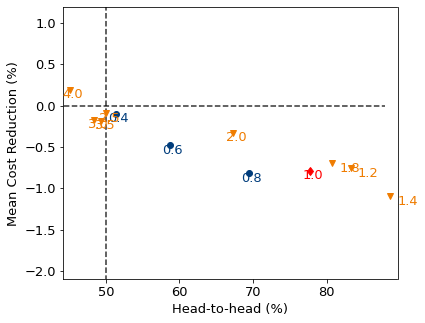

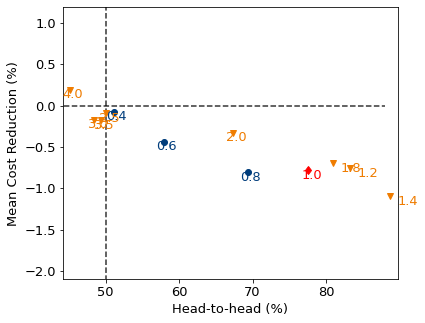

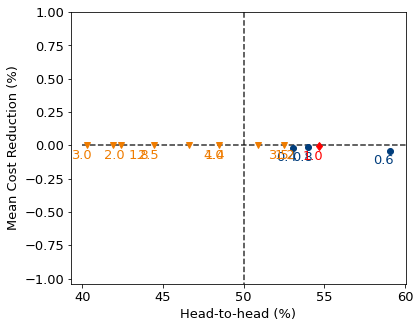

In [104]:
figure_plot_mis(all_h2h_ddrspo, all_mci_ddrspo, mis_all)   
figure_plot_mis(all_h2h_olsspo, all_mci_olsspo, mis_all) 
figure_plot_mis(all_h2h_ddrols, all_mci_ddrols, mis_all)

<a id='Sec_4.4'></a>
## Section 4.4: Nonlinear cost
[Go back to top](#Top)

### Test all cases

In [28]:
random.seed(seed)
iters = 50
p = 4
d = 10
samples_test = 1000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 2000
mis = 1

ver = 2
x_dister = 'uniform'
e_dister = 'normal'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

thres = 7

# search range for mu and lambda
mu_range = [-0.6 + i*0.05 for i in range(26)]
lamb_range = [0 + i*0.05 for i in range(26)]
Data = {}
all_h2h = {}
all_mci = {}
for i in range(iters):
    start = time.time()
    W_star = generate_truth(lower, upper, p, d, version = 0) 
    Data[i] = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                               version = ver, x_dist = x_dister, e_dist = e_dister, x_low = xl, x_up = xu, 
                               x_mean = xm, x_var = xv, bump = bp)
    
    # read data
    x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = Data[i]

    ## Solve and evaluate the OLS model
    W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)  
    z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
    c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)
    y_test_opt = decision_finder(z_test_ori)
    c_oracle = mean(np.sum(z_test_ori * y_test_opt, axis = 1))
            
    ## Solve and evaluate the DDR model
    for mu in mu_range:
        for lamb in lamb_range:
            # Obtain regression parameters
            W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb)
            z_test_ddr, y_test_ddr, c_test_ddr = param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres)
            c_ddr_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
            
            # Collects results
            lbels_ddrols, h2her , mcier = cross_compare2(c_ddr_true, c_ols_true, c_oracle)
            all_h2h[i, mu, lamb] = h2her * 100
            all_mci[i, mu, lamb] = mcier * 100
    
    # stops clock
    end = time.time()
    print(end - start)
    
results = [all_h2h, all_mci, Data]
string = '420full_search.pickle'
with open(string, 'wb') as f:
    pickle.dump(results, f)

372.7649164199829
352.474732875824
352.1024031639099
350.28795433044434
352.2534511089325
352.32585740089417
350.0740008354187
355.219984292984
355.1110587120056
358.2081289291382
356.57552194595337
357.77324628829956
358.3563451766968
360.1555757522583
361.2157988548279
359.1113169193268
359.8387219905853
361.54579973220825
363.9407720565796
359.72647070884705
360.1198728084564
358.22578954696655
362.9250855445862
365.82715225219727
365.8627018928528
361.79195189476013
361.63542342185974
360.6216504573822
362.2798192501068
359.806884765625
360.83748865127563
360.03328132629395
358.14518570899963
359.7428333759308
360.232136964798
361.34495782852173
363.2729778289795
362.14225149154663
361.80308055877686
361.7805132865906
362.450612783432
362.7375395298004
362.9177498817444
362.89455127716064
363.30285239219666
362.80697441101074
361.95747923851013
364.56627130508423
365.8634874820709
367.9352779388428


In [26]:
results = pickle.load( open( '420full_search.pickle', "rb" ) )
all_h2h = results[0]
all_mci = results[1]
unique_starts = unique([b for a,b,c in all_mci.keys()])
unique_ends = unique([c for a,b,c in all_mci.keys()])
list_keys = [(b,c) for b in unique_starts for c in unique_ends]
mci_vecs = {}
for pair in list_keys:
    hold = [all_mci[a, b, c] for a,b,c in all_mci.keys() if b == pair[0] if c == pair[1]]
    hold.sort()
    mci_vecs[pair] = hold
# print(mci_vecs)

In [ ]:
for pair in list_keys:
    np.argmin(np.abs(mci_vecs[pair]))

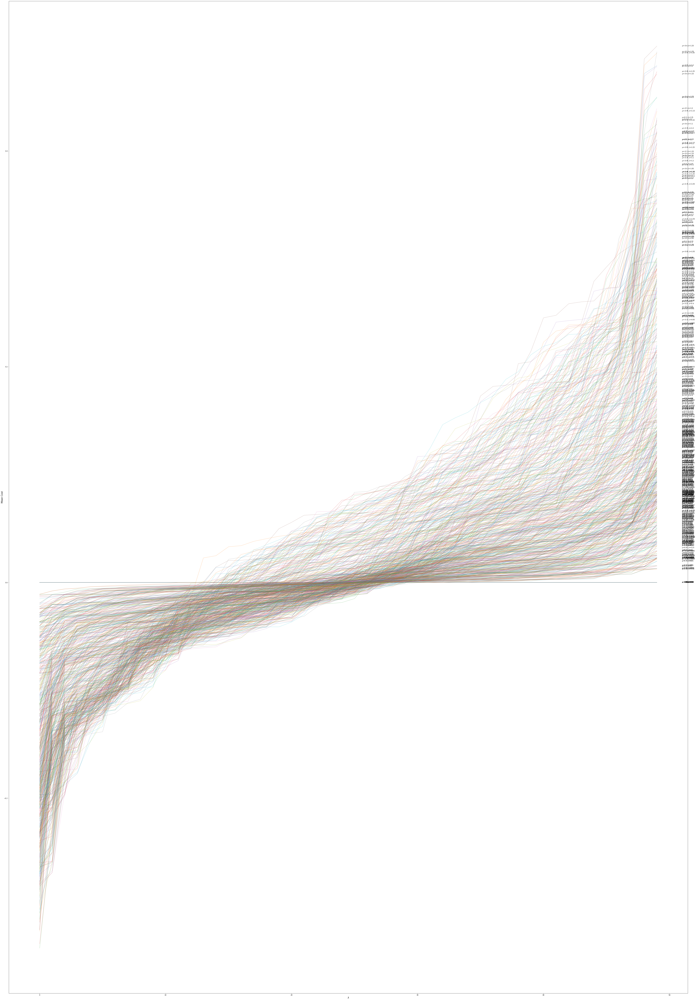

In [29]:
# plot
iters = 50
plt.figure(figsize=(80,120))
for pair in list_keys:
    if not(pair[0]==0):
        plt.plot(range(iters), mci_vecs[pair], alpha = 0.33)
        plt.text(iters+1, mci_vecs[pair][iters-1], 
                 '$\mu$='+ str(np.round(pair[0], decimals = 3))+' ,$\lambda$=' + str(np.round(pair[1], decimals = 3)))

plt.xlabel('$\lambda$', fontsize=15)
plt.ylabel('Mean Cost', fontsize=15)
plt.savefig('440_all_cases.png', format='png', bbox_inches="tight")

In [50]:
start = time.time()
random.seed(seed)
iters = 1
p = 4
d = 10
samples_test = 5000
samples_train = 100
lower = 0
upper = 1
alpha = 1
n_epsilon = 2000
mis = 1

ver = 1
x_dister = 'normal'
e_dister = 'uniform'
xl = -2
xu = 2
xm = 2
xv = 0.25
#bp = abs(xl)*upper*d
bp = 7

mu = 0.65
lamb = 0.05

thres = 6.6  ##

## generate samples
# x_test = data[0] #M*p
# z_test_ori = data[1] #M*d
# z_test = data[2] #M*d
# x_train = data[3] # N*p
# z_train_ori = data[4] #N*d
# z_train = data[5] # N*d
# W_star = data[6] # d*p
W_star = generate_truth(lower, upper, p, d, version = 0) # 0 uniform, 1 sparse, 2 uniform + feature, 3 sparse + feature
data = generate_samples(p, d, samples_test, samples_train, alpha, W_star, n_epsilon, mis, thres, 
                                           version = 2, x_dist = x_dister, e_dist = e_dister, x_low = xl, 
                                           x_up = xu, x_mean = xm, x_var = xv, bump = bp)
x_test, z_test_ori, z_test, x_train, z_train_ori, z_train, W_star = data

In [51]:
# start = time.time()
## Solve and evaluate the OLS model
W_ols, w0_ols, t_ols, obj_ols = ols_solver(x_train, z_train)  
z_test_ols, y_test_ols, c_test_ols = param_prediction_and_cost_estimation(x_test, W_ols, w0_ols, thres)
c_ols_true =  np.sum(np.minimum(z_test_ori,thres) * y_test_ols, axis = 1)

# print(c_ols_true)

# c_ols_test_all =  [np.sum(np.minimum(z_test[m],thres) * y_test_ols, axis = 1) for m in range(n_epsilon)]
c_ols_test_all = np.sum(np.minimum(np.array(z_test),thres) * y_test_ols, axis = 2)
c_ols_test = np.mean(np.array(c_ols_test_all), axis = 0) ## average over all n_epsilon

# print(c_ols_test)

# y_test_opt_all = [decision_finder(z_test[m]) for m in range(n_epsilon)]
# c_oracle_test_all = [mean(np.sum(z_test[m] * y_test_opt_all[m], axis = 1)) for m in range(n_epsilon)]
y_test_opt_all = decision_finder(z_test)
c_oracle_test_all = np.mean(np.sum(np.minimum(np.array(z_test),thres) * y_test_opt_all, axis = 2), axis = 1)

c_oracle_test = np.mean(np.array(c_oracle_test_all), axis = 0) ## average over all n_epsilon

y_test_opt = decision_finder(z_test_ori)
c_oracle_true = mean(np.sum(z_test_ori * y_test_opt, axis = 1))

# end = time.time()
# print(end - start)
## Solve and evaluate the DDR model
c_ddr_true_all = {}
c_ddr_test_all = {}
mu_range = [-0.5 + i*0.1 for i in range(13)]
lamb_range = [0 + i*0.05 for i in range(81)]


for mu in mu_range:
    for lamb in lamb_range:
        # Obtain regression parameters
        W_ddr, w0_ddr, t_ddr = ddr_solver(x_train, z_train, thres, mu, lamb)
        z_test_ddr, y_test_ddr, c_test_ddr = param_prediction_and_cost_estimation(x_test, W_ddr, w0_ddr, thres)
        c_ddr_true_all[mu,lamb] =  np.sum(np.minimum(z_test_ori,thres) * y_test_ddr, axis = 1)
        c_ddr_test_all_epsilon = [np.sum(np.minimum(z_test[m],thres) * y_test_ddr, axis = 1) for m in range(n_epsilon)]
        c_ddr_test_all[mu,lamb] = np.mean(np.array(c_ddr_test_all_epsilon), axis = 0) ## average over all n_epsilon 
        
lamb_final = {}
for mu in mu_range:
    all_c_ddr_test = [(np.mean(c_ddr_test_all[mu, lamb])) for lamb in lamb_range]
    index = np.argmin(all_c_ddr_test)
    lamb_final_t = lamb_range[index]
    lamb_final[mu] = lamb_final_t
# results = [plotter, hth, mci, mu_range, lamb_range, lamb_opt, lamb_final, lamb_min_ind, c_ols_test, c_oracle_test, data]
# string = 'Cross_validata_test (no_risk_' + str(d) + '_' + str(p) + '_' + str(round(alpha,1)) + '_' + str(samples_train) + '_' + \
#          str(samples_test) + '_iter_' + str(iters) + '_threshold_'+str(thres)+".pickle"
# with open(string, 'wb') as f:
#     pickle.dump(results, f)
plotter_true = {}
hth_true = {}
mci_true = {}
pio_true = {}
plotter_test = {}
hth_test = {}
mci_test = {}
pio_test = {}
lamb_min_ind_true = []
lamb_opt_true = []    
lamb_min_ind_test = []
lamb_opt_test = []  
lamb_range_cut = lamb_range    
for mu in mu_range:
    plotter_true[mu] = [mean(c_ddr_true_all[mu,lambnow]) for lambnow in lamb_range_cut]
    hth_true[mu] = [head_2_head(c_ddr_true_all[mu,lambnow], c_ols_true) for lambnow in lamb_range_cut]
    mci_true[mu] = [(mean(c_ddr_true_all[mu,lambnow]) - mean(c_ols_true)) / c_oracle_true for lambnow in lamb_range_cut]
    pio_true[mu] = [(mean(c_ols_true) - mean(c_ddr_true_all[mu,lambnow]))/(mean(c_ols_true) - c_oracle_true)*100 for lambnow in lamb_range_cut]
    
    plotter_test[mu] = [mean(c_ddr_test_all[mu,lambnow]) for lambnow in lamb_range_cut]
    hth_test[mu] = [head_2_head(c_ddr_test_all[mu,lambnow], c_ols_test) for lambnow in lamb_range_cut]
    mci_test[mu] = [(mean(c_ddr_test_all[mu,lambnow]) - mean(c_ols_test)) / c_oracle_test for lambnow in lamb_range_cut]
    pio_test[mu] = [(mean(c_ols_test) - mean(c_ddr_test_all[mu,lambnow]))/(mean(c_ols_test) - c_oracle_test)*100 for lambnow in lamb_range_cut]
    
    index = np.argmin(plotter_true[mu])
    lamb_min_ind_true.append(index)
    lamb_opt_true.append(lamb_range[index])
    
    index = np.argmin(plotter_test[mu])
    lamb_min_ind_test.append(index)
    lamb_opt_test.append(lamb_range[index])

<Figure size 648x432 with 0 Axes>

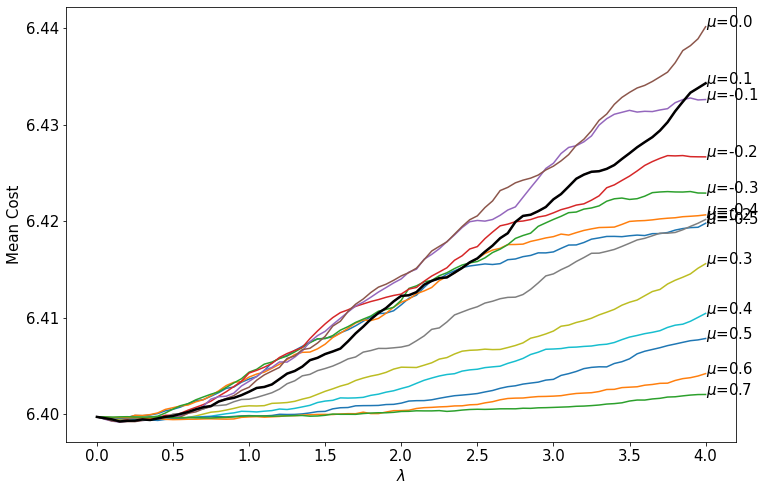

In [52]:
plotter = plotter_true
plt.figure(figsize = (9,6))
lamb_range_cut = lamb_range
plt.figure(figsize=(12,8))
for mu in mu_range:
    plt.plot(lamb_range_cut, plotter[mu])
    plt.text(lamb_range_cut[len(lamb_range_cut)-1], plotter[mu][len(lamb_range_cut)-1], '$\mu$='+ str(np.round(mu, decimals = 3)))
#for mu in mu_range[7:13]:
#    plt.plot(lamb_range_cut, plotter[mu][0:41])
    
plt.plot(lamb_range_cut, plotter[mu_range[6]], linewidth=2.5, color = 'black')

plt.xlabel('$\lambda$', fontsize=15)
plt.ylabel('Mean Cost', fontsize=15)

plt.rcParams.update({'font.size': 15})

<Figure size 648x432 with 0 Axes>

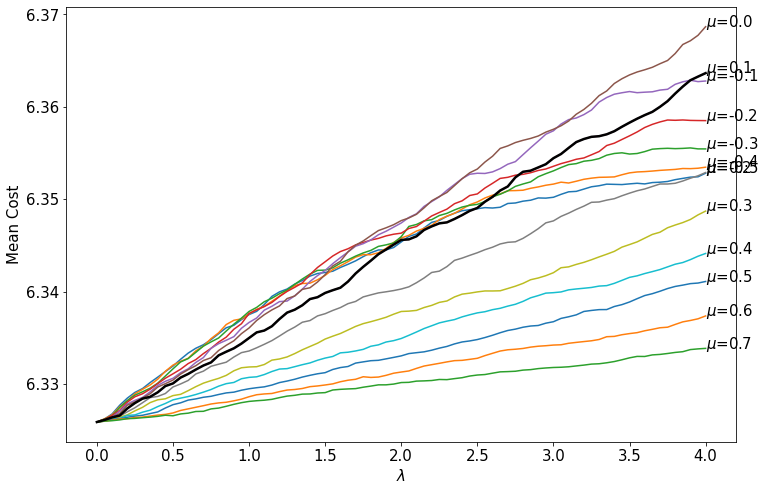

In [53]:
plotter = plotter_test
plt.figure(figsize = (9,6))
lamb_range_cut = lamb_range
plt.figure(figsize=(12,8))
for mu in mu_range:
    plt.plot(lamb_range_cut, plotter[mu])
    plt.text(lamb_range_cut[len(lamb_range_cut)-1], plotter[mu][len(lamb_range_cut)-1], '$\mu$='+ str(np.round(mu, decimals = 3)))
#for mu in mu_range[7:13]:
#    plt.plot(lamb_range_cut, plotter[mu][0:41])
    
plt.plot(lamb_range_cut, plotter[mu_range[6]], linewidth=2.5, color = 'black')

plt.xlabel('$\lambda$', fontsize=15)
plt.ylabel('Mean Cost', fontsize=15)

plt.rcParams.update({'font.size': 15})

<Figure size 648x432 with 0 Axes>

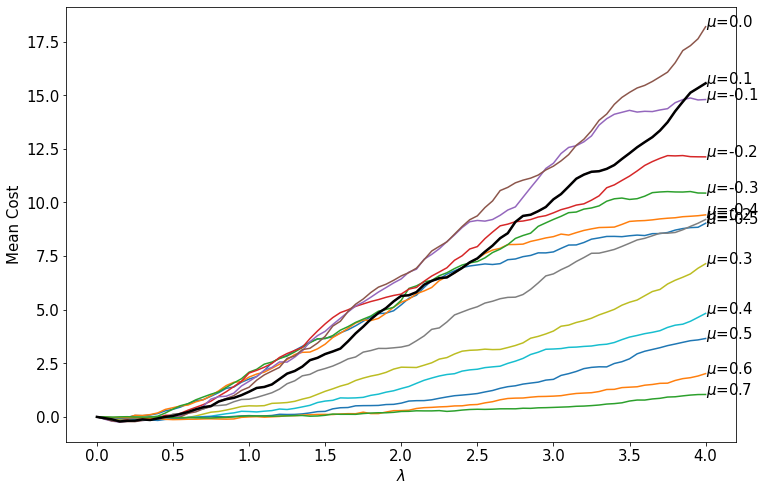

In [54]:
plotter = pio_true
plt.figure(figsize = (9,6))
lamb_range_cut = lamb_range
plt.figure(figsize=(12,8))
for mu in mu_range:
    plt.plot(lamb_range_cut, plotter[mu])
    plt.text(lamb_range_cut[len(lamb_range_cut)-1], plotter[mu][len(lamb_range_cut)-1], '$\mu$='+ str(np.round(mu, decimals = 3)))
#for mu in mu_range[7:13]:
#    plt.plot(lamb_range_cut, plotter[mu][0:41])
    
plt.plot(lamb_range_cut, plotter[mu_range[6]], linewidth=2.5, color = 'black')

plt.xlabel('$\lambda$', fontsize=15)
plt.ylabel('Mean Cost', fontsize=15)

plt.rcParams.update({'font.size': 15})

<Figure size 648x432 with 0 Axes>

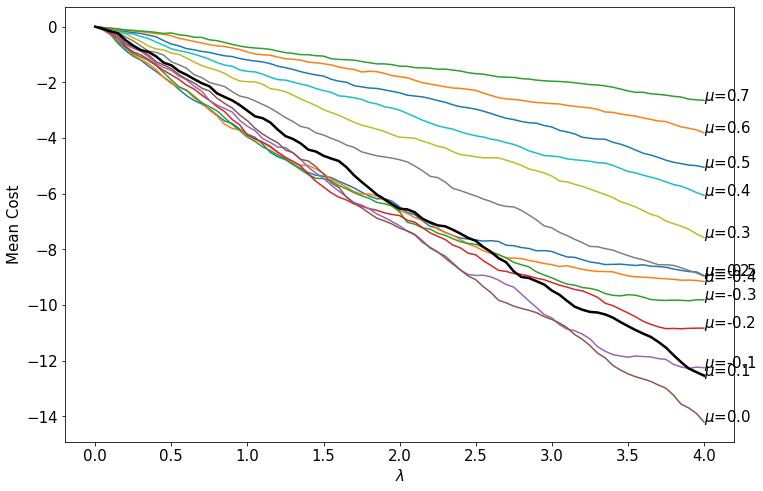

In [55]:
plotter = pio_test
plt.figure(figsize = (9,6))
lamb_range_cut = lamb_range
plt.figure(figsize=(12,8))
for mu in mu_range:
    plt.plot(lamb_range_cut, plotter[mu])
    plt.text(lamb_range_cut[len(lamb_range_cut)-1], plotter[mu][len(lamb_range_cut)-1], '$\mu$='+ str(np.round(mu, decimals = 3)))
#for mu in mu_range[7:13]:
#    plt.plot(lamb_range_cut, plotter[mu][0:41])
    
plt.plot(lamb_range_cut, plotter[mu_range[6]], linewidth=2.5, color = 'black')

plt.xlabel('$\lambda$', fontsize=15)
plt.ylabel('Regret reduction', fontsize=15)

plt.rcParams.update({'font.size': 15})

In [ ]:
<a id='Sec_4.5'></a>
## Section 4.5: Adding constraints Ax <= b
[Go back to top](#Top)